In [1]:
import numpy as np
from matplotlib import colors
from Configuration import *
import os

In [2]:
from climada.entity import Entity
from climada.entity import Exposures
from pandas import DataFrame
from climada.entity.exposures import LitPop

['British Columbia', 'Alberta', 'Saskatchewan', 'Manitoba', 'Ontario', 'Québec', 'New Brunswick', 'Yukon', 'Nunavut', 'Newfoundland and Labrador', 'Nova Scotia', 'Northwest Territories', 'Prince Edward Island']
Nova Scotia index: 10

 Runtime `from_shape` : 10.55 sec.



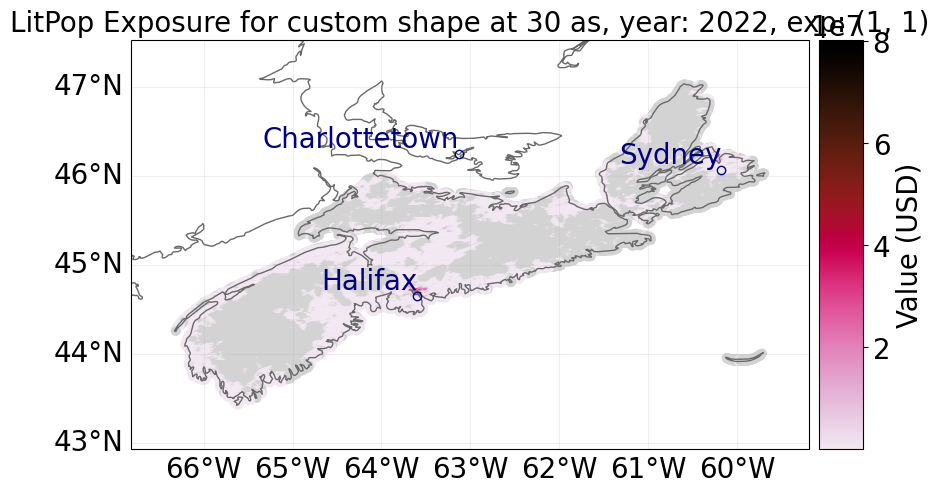

In [3]:
#Construct Exposure 1
#Houses

import time
import climada.util.coordinates as u_coord
import climada.entity.exposures.litpop as lp

country_iso3a = 'CAN'
state_name = 'Nova Scotia'
reslution_arcsec = 200
"""First, we need to get the shape of Nova Scotia:"""
admin1_info, admin1_shapes = u_coord.get_admin1_info(country_iso3a)
admin1_info = admin1_info[country_iso3a]
admin1_shapes = admin1_shapes[country_iso3a]
admin1_names = [record['name'] for record in admin1_info]
print(admin1_names)
for idx, name in enumerate(admin1_names):
    if admin1_names[idx]==state_name:
        break
print('Nova Scotia index: ' + str(idx))

"""Secondly, we estimate the `total_value`"""
# `total_value` required user input for `from_shape`, here we assume 2.01% of total value of the whole CAN, and 12,97% of total GDP:
total_value = 0.0201 * 0.1297 * lp._get_total_value_per_country(country_iso3a, 'gdp', 2022)

"""Then, we can initiate the exposures for Nova Scotia:"""
start = time.process_time()
exp_house = LitPop.from_shape(admin1_shapes[idx], total_value, res_arcsec=30, reference_year=2022)
print(f'\n Runtime `from_shape` : {time.process_time() - start:1.2f} sec.\n')
exp_house.plot_scatter(vmin=100, buffer=.5);

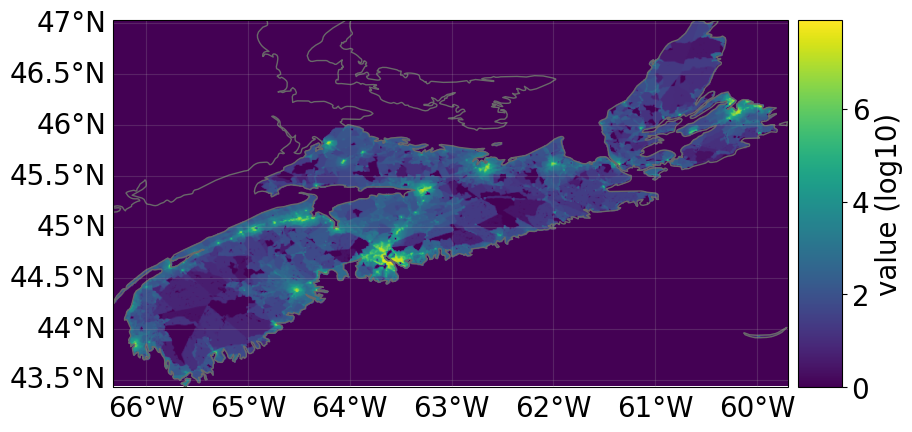

In [4]:
#Plot_raster method
from climada.util.plot import add_cntry_names # use climada's plotting utilities
ax = exp_house.plot_raster(); # plot with same resolution as data
add_cntry_names(ax, [exp_house.gdf.longitude.min(), exp_house.gdf.longitude.max(), exp_house.gdf.latitude.min(), exp_house.gdf.latitude.max()])

# use keyword argument save_tiff='filepath.tiff' to save the corresponding raster in tiff format
# use keyword argument raster_res='desired number' to change resolution of the raster.

<GeoAxesSubplot:title={'center':'LitPop Exposure for custom shape at 30 as, year: 2022, exp: (1, 1)'}>

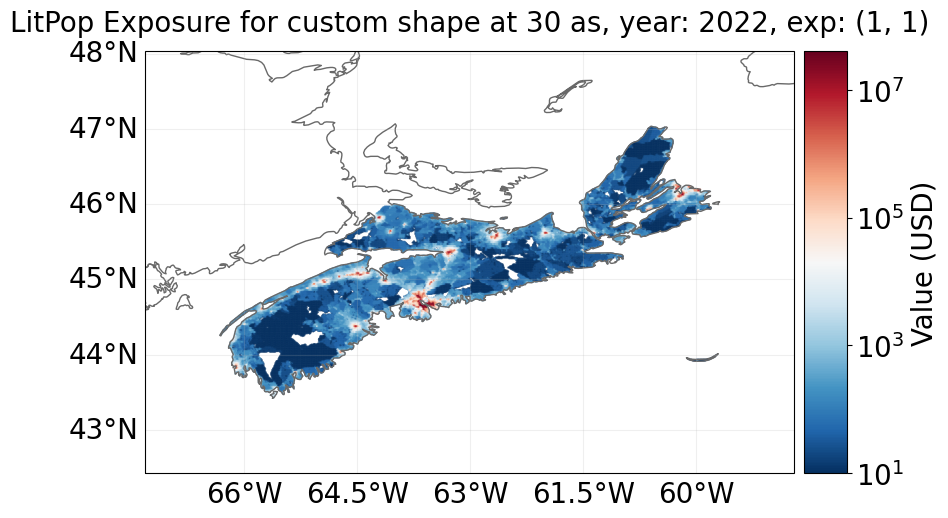

In [5]:
#Plot House Exposure Map
norm = colors.LogNorm(vmin=10, vmax=4.0e7)

exp_house.plot_hexbin(norm=norm, pop_name=False, cmap='RdBu_r', buffer=1)

In [6]:
#Save House Exposure File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_house.write_hdf5(results.joinpath('exp_house.h5'))

['British Columbia', 'Alberta', 'Saskatchewan', 'Manitoba', 'Ontario', 'Québec', 'New Brunswick', 'Yukon', 'Nunavut', 'Newfoundland and Labrador', 'Nova Scotia', 'Northwest Territories', 'Prince Edward Island']
Nova Scotia index: 10

 Runtime `from_population` : 9.83 sec.



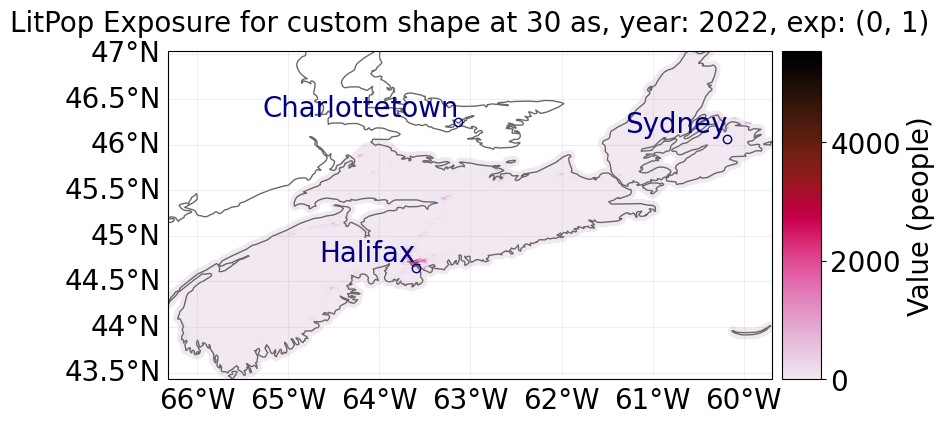

In [7]:
#Construct Exposure 2
#Population

import time
import climada.util.coordinates as u_coord
import climada.entity.exposures.litpop as lp

country_iso3a = 'CAN'
state_name = 'Nova Scotia'
reslution_arcsec = 200
"""First, we need to get the shape of Nova Scotia:"""
admin1_info, admin1_shapes = u_coord.get_admin1_info(country_iso3a)
admin1_info = admin1_info[country_iso3a]
admin1_shapes = admin1_shapes[country_iso3a]
admin1_names = [record['name'] for record in admin1_info]
print(admin1_names)
for idx, name in enumerate(admin1_names):
    if admin1_names[idx]==state_name:
        break
print('Nova Scotia index: ' + str(idx))

start = time.process_time()
exp_pop = LitPop.from_population(shape=admin1_shapes[idx], reference_year=2022)
print(f'\n Runtime `from_population` : {time.process_time() - start:1.2f} sec.\n')
exp_pop.plot_scatter();

<GeoAxesSubplot:title={'center':'LitPop Exposure for custom shape at 30 as, year: 2022, exp: (0, 1)'}>

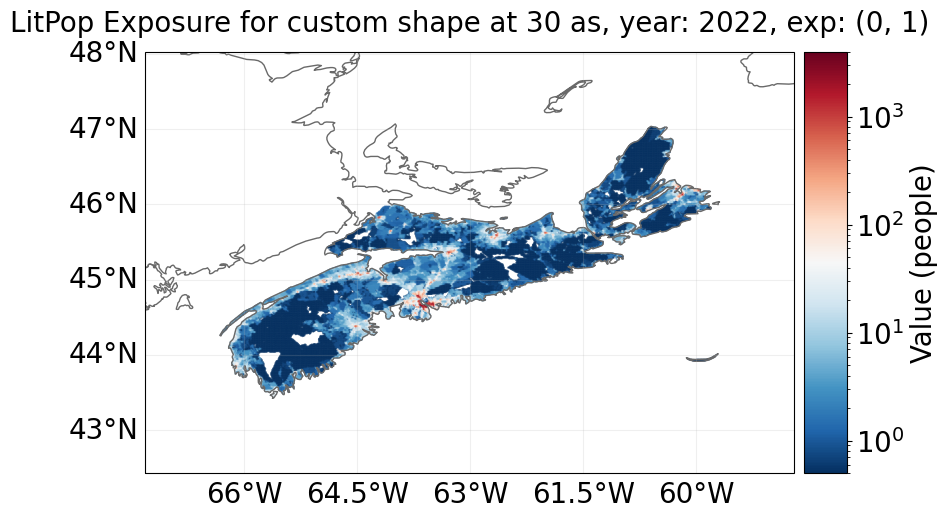

In [8]:
#Plot Population Exposure
norm = colors.LogNorm(vmin=0.5, vmax=4.0e3)

exp_pop.plot_hexbin(norm=norm, pop_name=False, cmap='RdBu_r', buffer=1)

In [9]:
#Save Population Exposure File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_pop.write_hdf5(results.joinpath('exp_pop.h5'))

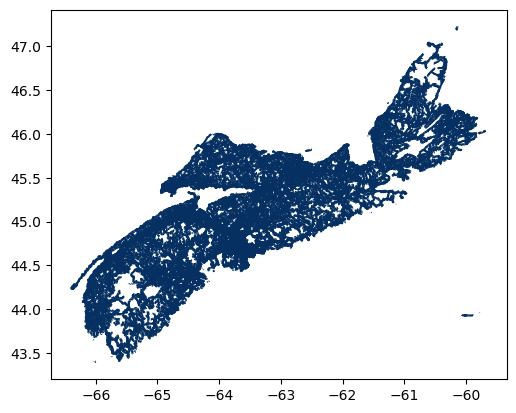

In [13]:
#Construct Exposure
#Roads

# Imports
import geopandas as gpd
import pandas as pd
from pathlib import Path

from climada.entity import Exposures
from climada.entity.impact_funcs.storm_europe import ImpfStormEurope
from climada.entity.impact_funcs import ImpactFuncSet
from climada.engine import Impact
from climada.hazard.storm_europe import StormEurope
import climada.util.lines_polys_handler as u_lp
from climada.util.constants import DEMO_DIR, WS_DEMO_NC
from climada.util.coordinates import Polygon, MultiPolygon, Point, box

def gdf_road():
    gdf_road = gpd.read_file(Path(DEMO_DIR,'hotosm_can_roads_lines.shp'))
    gdf_road = gdf_road.to_crs(epsg=4326)
    return gdf_road

exp_ns_road = Exposures(gdf_road())
exp_ns_road.gdf['impf_WS'] = 1
exp_ns_road.gdf['value'] = 1989
exp_ns_road.gdf.head()

exp_ns_road.gdf.plot('value', cmap='RdBu_r');

In [14]:
#Save Roads Exposure File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_ns_road.write_hdf5(results.joinpath('exp_road.h5'))

In [10]:
#Construct Exposure LOCAL
#Buildings

# reload required modules
import shapely
from climada_petals.entity.exposures.openstreetmap.osm_dataloader import OSMApiQuery
from climada import CONFIG

DATA_DIR = CONFIG.exposures.openstreetmap.local_data.dir()


In [11]:
## Area untuk GBAY
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_church1 = '["admin_level"]'
condition_builidng = '["building"]'

# Initialize OSMApiQuery instances
#ns_churchquery_bbox1 = OSMApiQuery(area_bbox, condition_church1)
ns_building_polygbay = OSMApiQuery(area_poly, condition_builidng)

In [12]:
## Area untuk GBAY
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_church1 = '["admin_level"]'
condition_voltage = '["voltage"]'

# Initialize OSMApiQuery instances
#ns_churchquery_bbox1 = OSMApiQuery(area_bbox, condition_church1)
ns_voltage_polygbay = OSMApiQuery(area_poly, condition_voltage)

In [13]:
## Area untuk GBAY
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_church1 = '["admin_level"]'
condition_highway = '[highway~"^(primary|secondary|tertiary)$"]'

# Initialize OSMApiQuery instances
#ns_churchquery_bbox1 = OSMApiQuery(area_bbox, condition_church1)
ns_highway_polygbay = OSMApiQuery(area_poly, condition_highway)

In [115]:
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349)])

# Two examples for query conditions:
condition_church1 = '["admin_level"]'
condition_builidng = '["building"]'

# Initialize OSMApiQuery instances
ns_churchquery_bbox1 = OSMApiQuery(area_bbox, condition_church1)
ns_building_poly = OSMApiQuery(area_poly, condition_builidng)

In [128]:
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-66.55527, 43.14342, -59.30262, 46.08577)
area_poly = shapely.geometry.Polygon([(-66.55527, 44.24979), (-65.63227, 43.14342), (-59.30262, 45.93810), (-60.51076, 47.50669), (-62.50055, 45.85288), (-63.67125, 46.08577), (-64.95091, 45.42384)])

# Two examples for query conditions:
condition_church = '["amenity"="place_of_worship"]'
condition_builidng = '["voltage"]'

# Initialize OSMApiQuery instances
ns_churchquery_bbox = OSMApiQuery(area_bbox, condition_church)
ns_voltagequery_poly = OSMApiQuery(area_poly, condition_builidng)

In [41]:
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-66.55527, 43.14342, -59.30262, 46.08577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.622156), (-63.521377, 44.656487), (-63.554452, 44.705349)])

# Two examples for query conditions:
condition_church = '["highway"]'
condition_highway = '["highway"]'

# Initialize OSMApiQuery instances
ns_churchquery_bbox = OSMApiQuery(area_bbox, condition_church)
ns_highwayquery_poly = OSMApiQuery(area_poly, condition_highway)

In [116]:
gdf_ns_churches = ns_churchquery_bbox1.get_data_overpass()

ValueError: Length of values (89) does not match length of index (69)

In [14]:
gdf_ns_buildinggbay = ns_building_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:710: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_rels)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:722: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results =  gdf_results.append(gdf_nodes)


In [15]:
gdf_ns_voltagegbay = ns_voltage_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)


In [16]:
gdf_ns_highwaygbay = ns_highway_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)


In [61]:
gdf_ns_building = ns_building_poly.get_data_overpass()

In [17]:
gdf_ns_buildinggbay

,osm_id,geometry,tags
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B..."
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
...,...,...,...
11137,1184377999,"POLYGON ((-63.55379 44.70196, -63.55382 44.701...",{'building': 'yes'}
11138,1189249682,"POLYGON ((-63.59256 44.69162, -63.59213 44.691...","{'addr:city': 'Dartmouth', 'addr:district': '6..."
11139,1194725392,"POLYGON ((-63.56899 44.64301, -63.56853 44.643...","{'building': 'yes', 'name': 'CUNARD'}"
11140,1197154503,"POLYGON ((-63.59088 44.67634, -63.59088 44.676...",{'building': 'yes'}


In [18]:
gdf_ns_voltagegbay

,osm_id,geometry,tags
0,82329702,"LINESTRING (-63.52504 44.65533, -63.52539 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No..."
1,83327265,"LINESTRING (-63.59448 44.67757, -63.59671 44.6...","{'cables': '6', 'circuits': '2', 'frequency': ..."
2,84172082,"POLYGON ((-63.59450 44.67639, -63.59435 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
3,84174998,"POLYGON ((-63.58997 44.67626, -63.58947 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
4,364023292,"LINESTRING (-63.52093 44.68183, -63.52120 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No..."
...,...,...,...
604,1189249034,"LINESTRING (-63.59241 44.69218, -63.59208 44.6...","{'cables': '3', 'communication': 'line', 'freq..."
605,1189249035,"LINESTRING (-63.59284 44.68766, -63.59462 44.6...","{'cables': '9', 'frequency': '60', 'operator':..."
606,1189249036,"LINESTRING (-63.58998 44.68275, -63.59144 44.6...","{'cables': '6', 'frequency': '60', 'operator':..."
607,1189252482,"LINESTRING (-63.58819 44.69261, -63.58795 44.6...","{'cables': '3', 'communication': 'line', 'freq..."


In [19]:
gdf_ns_highwaygbay

,osm_id,geometry,tags
0,3217710,"LINESTRING (-63.57765 44.65264, -63.57758 44.6...","{'clopin:id': 'cycleslow', 'clopin:route': 'cy..."
1,3494673,"LINESTRING (-63.57355 44.66728, -63.57324 44.6...",{'destination:backward': 'Windmill Road|Wyse R...
2,3494675,"LINESTRING (-63.55994 44.66835, -63.55982 44.6...",{'description': 'https://en.wikipedia.org/wiki...
3,4114478,"LINESTRING (-63.56615 44.67141, -63.56594 44.6...",{'description': 'https://en.wikipedia.org/wiki...
4,4114480,"LINESTRING (-63.56381 44.67063, -63.56390 44.6...","{'highway': 'tertiary', 'maxheight': '4.1', 'm..."
...,...,...,...
430,1197156860,"LINESTRING (-63.59874 44.68581, -63.59880 44.6...","{'highway': 'secondary', 'lane_markings': 'yes..."
431,1197156861,"LINESTRING (-63.59896 44.68678, -63.59910 44.6...","{'highway': 'secondary', 'lane_markings': 'yes..."
432,1197253018,"LINESTRING (-63.54982 44.68116, -63.54958 44.6...","{'NHS': 'yes', 'highway': 'secondary', 'lane_m..."
433,1197253019,"LINESTRING (-63.54710 44.68488, -63.54722 44.6...","{'NHS': 'yes', 'highway': 'secondary', 'lane_m..."


In [62]:
gdf_ns_building

,osm_id,geometry,tags
0,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
1,8794855,GEOMETRYCOLLECTION EMPTY,"{'building': 'residential', 'name': 'Banook Sh..."
2,11965182,GEOMETRYCOLLECTION EMPTY,"{'abbr_name': 'CBE', 'building': 'college', 'n..."
3,43003471,"POLYGON ((-63.55972 44.68781, -63.56026 44.687...","{'addr:city': 'Dartmouth', 'addr:housename': '..."
4,61922168,"POLYGON ((-63.56930 44.64255, -63.56945 44.642...","{'addr:city': 'Halifax', 'addr:housenumber': '..."
...,...,...,...
5529,1175763379,"POLYGON ((-63.54518 44.66390, -63.54504 44.664...","{'building': 'yes', 'source': 'HRM open Data H..."
5530,1175763384,"POLYGON ((-63.56221 44.66936, -63.56214 44.669...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
5531,1175763386,"POLYGON ((-63.55884 44.67200, -63.55878 44.672...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
5532,1184377999,"POLYGON ((-63.55379 44.70196, -63.55382 44.701...",{'building': 'yes'}


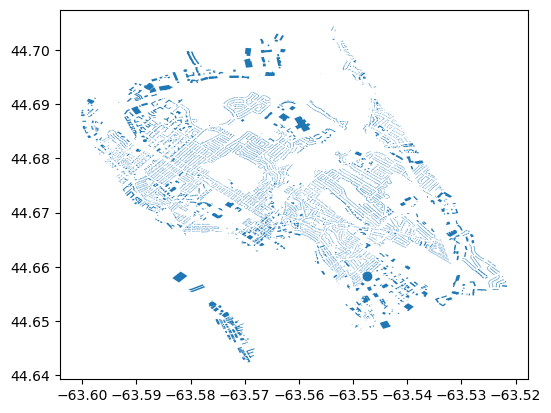

In [141]:
gdf_ns_buildinggbay.plot();

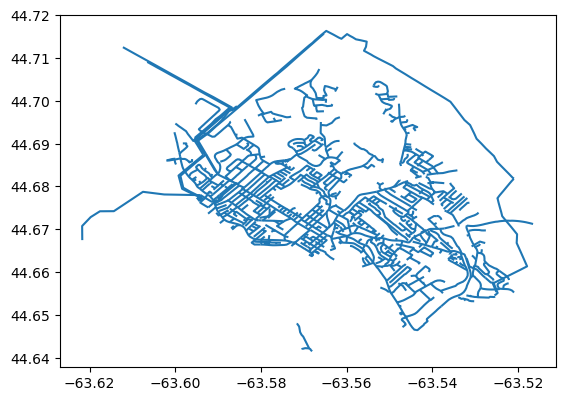

In [161]:
gdf_ns_voltagegbay.plot();

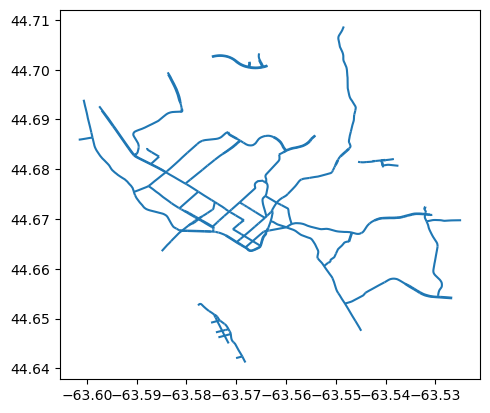

In [266]:
gdf_ns_highwaygbay.plot();

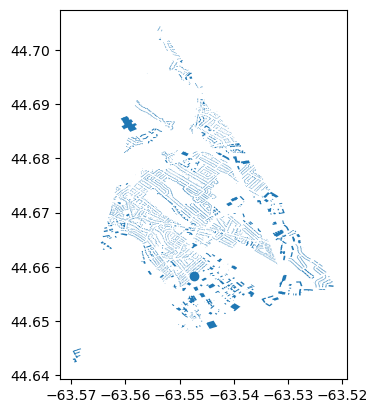

In [63]:
gdf_ns_building.plot();

In [24]:
# Imports
import geopandas as gpd
import pandas as pd
from pathlib import Path

from climada.entity import Exposures
from climada.entity.impact_funcs.storm_europe import ImpfStormEurope
from climada.entity.impact_funcs import ImpactFuncSet
from climada.engine import ImpactCalc
from climada.hazard.storm_europe import StormEurope
import climada.util.lines_polys_handler as u_lp
from climada.util.constants import DEMO_DIR, WS_DEMO_NC

In [20]:
def gdf_poly():
    gdf_polys = gpd.GeoDataFrame(gdf_ns_buildinggbay)
    gdf_polys = gdf_polys.set_crs(epsg=4326)
    return gdf_polys

In [21]:
def gdf_poly2():
    gdf_polys2 = gpd.GeoDataFrame(gdf_ns_voltagegbay)
    gdf_polys2 = gdf_polys2.set_crs(epsg=4326)
    return gdf_polys2

In [22]:
def gdf_poly3():
    gdf_polys3 = gpd.GeoDataFrame(gdf_ns_highwaygbay)
    gdf_polys3 = gdf_polys3.set_crs(epsg=4326)
    return gdf_polys3

In [69]:
def gdf_poly():
    gdf_polys = gpd.GeoDataFrame(gdf_ns_building)
    gdf_polys = gdf_polys.set_crs(epsg=4326)
    return gdf_polys

In [27]:
exp_polygbay = Exposures(gdf_poly())
exp_polygbay.gdf['impf_'] = 1
exp_polygbay.gdf.head()

,osm_id,geometry,tags,impf_
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B...",1
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1


In [25]:
exp_polygbay2 = Exposures(gdf_poly2())
exp_polygbay2.gdf['impf_'] = 1
exp_polygbay2.gdf.head()

,osm_id,geometry,tags,impf_
0,82329702,"LINESTRING (-63.52504 44.65533, -63.52539 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No...",1
1,83327265,"LINESTRING (-63.59448 44.67757, -63.59671 44.6...","{'cables': '6', 'circuits': '2', 'frequency': ...",1
2,84172082,"POLYGON ((-63.59450 44.67639, -63.59435 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,84174998,"POLYGON ((-63.58997 44.67626, -63.58947 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,364023292,"LINESTRING (-63.52093 44.68183, -63.52120 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No...",1


In [26]:
exp_polygbay3 = Exposures(gdf_poly3())
exp_polygbay3.gdf['impf_'] = 1
exp_polygbay3.gdf.head()

,osm_id,geometry,tags,impf_
0,3217710,"LINESTRING (-63.57765 44.65264, -63.57758 44.6...","{'clopin:id': 'cycleslow', 'clopin:route': 'cy...",1
1,3494673,"LINESTRING (-63.57355 44.66728, -63.57324 44.6...",{'destination:backward': 'Windmill Road|Wyse R...,1
2,3494675,"LINESTRING (-63.55994 44.66835, -63.55982 44.6...",{'description': 'https://en.wikipedia.org/wiki...,1
3,4114478,"LINESTRING (-63.56615 44.67141, -63.56594 44.6...",{'description': 'https://en.wikipedia.org/wiki...,1
4,4114480,"LINESTRING (-63.56381 44.67063, -63.56390 44.6...","{'highway': 'tertiary', 'maxheight': '4.1', 'm...",1


In [28]:
exp_poly = Exposures(gdf_poly())
exp_poly.gdf['impf_'] = 1
exp_poly.gdf.head()

,osm_id,geometry,tags,impf_
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B...",1
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1


In [ ]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay = u_lp.exp_geom_to_pnt(
    exp_polygbay, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=37100)
exp_pntgbay.gdf.head()

2023-08-12 19:41:58,826 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,831 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,836 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,840 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,845 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,850 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,854 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:41:58,860 - climada.util.lines_pol

In [ ]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pnt3 = u_lp.exp_geom_to_pnt(
    exp_poly, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=37100)
exp_pnt3.gdf.head()

2023-08-12 19:46:08,677 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,681 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,685 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,689 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,693 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,698 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,703 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:46:08,707 - climada.util.lines_pol

In [251]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay2 = u_lp.exp_geom_to_pnt(
    exp_polygbay2, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=37100)
exp_pntgbay2.gdf.head()

2023-08-12 19:50:14,515 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:50:14,519 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:50:14,523 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:50:14,526 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-12 19:50:14,530 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.


osm_id                                      geometry_orig  \
0 0  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  1  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  2  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  3  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  4  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   

                                                  tags  impf_  value  \
0 0  {'cables': '3', 'frequency': '60', 'name': 'No...      1  37100   
  1  {'cables': '3', 'frequency': '60', 'name': 'No...      1  37100   
  2  {'cables': '3', 'frequency': '60', 'name': 'No...      1  37100   
  3  {'cables': '3', 'frequency': '60', 'name': 'No...      1  37100   
  4  {'cables': '3', 'frequency': '60', 'name': 'No...      1  37100   

                       geometry   latitude  longitude  
0 0  POINT (-63.52504 44.65533)  44.655329 -63.525036  
  1  POINT (-63.51999 44.66025)  44.660246 -63.519994  
  2  POINT (-63.52028 44.66715)  44.667146 -63.520279  
  3  POINT (-63.52407 44.67457)  44.674571 -63.524073  
  4  POINT (-63.52091 44.68174)  44.681740 -63.520906

In [252]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay3 = u_lp.exp_geom_to_pnt(
    exp_polygbay3, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=37100)
exp_pntgbay3.gdf.head()

osm_id                                      geometry_orig  \
0 0  3217710  LINESTRING (-63.57765 44.65264, -63.57758 44.6...   
  1  3217710  LINESTRING (-63.57765 44.65264, -63.57758 44.6...   
1 0  3494673  LINESTRING (-63.57355 44.66728, -63.57324 44.6...   
  1  3494673  LINESTRING (-63.57355 44.66728, -63.57324 44.6...   
2 0  3494675  LINESTRING (-63.55994 44.66835, -63.55982 44.6...   

                                                  tags  impf_  value  \
0 0  {'clopin:id': 'cycleslow', 'clopin:route': 'cy...      1  37100   
  1  {'clopin:id': 'cycleslow', 'clopin:route': 'cy...      1  37100   
1 0  {'destination:backward': 'Windmill Road|Wyse R...      1  37100   
  1  {'destination:backward': 'Windmill Road|Wyse R...      1  37100   
2 0  {'description': 'https://en.wikipedia.org/wiki...      1  37100   

                       geometry   latitude  longitude  
0 0  POINT (-63.57765 44.65264)  44.652640 -63.577654  
  1  POINT (-63.57546 44.65153)  44.651531 -63.575462  
1 0  POINT (-63.57355 44.66728)  44.667285 -63.573549  
  1  POINT (-63.57208 44.66671)  44.666708 -63.572080  
2 0  POINT (-63.55994 44.66835)  44.668353 -63.559936

In [253]:
# Point-impactGBAY
imp_pntgbay = ImpactCalc(exp_pntgbay, IFs_TC_houses, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay = u_lp.impact_pnt_agg(imp_pntgbay, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [254]:
# Point-impactGBAY
imp_pntgbay45 = ImpactCalc(exp_pntgbay, IFs_TC_houses, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay45 = u_lp.impact_pnt_agg(imp_pntgbay45, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [255]:
# Point-impactGBAY
imp_pntgbay85 = ImpactCalc(exp_pntgbay, IFs_TC_houses, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay85 = u_lp.impact_pnt_agg(imp_pntgbay85, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [256]:
# Point-impactGBAY
imp_pntgbay2 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage2, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay2 = u_lp.impact_pnt_agg(imp_pntgbay2, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [257]:
# Point-impactGBAY
imp_pntgbay245 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage2, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay245 = u_lp.impact_pnt_agg(imp_pntgbay245, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [258]:
# Point-impactGBAY
imp_pntgbay285 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage2, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay285 = u_lp.impact_pnt_agg(imp_pntgbay285, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [259]:
# Point-impactGBAY
imp_pntgbay3 = ImpactCalc(exp_pntgbay3, IFs_TC_houses, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay3 = u_lp.impact_pnt_agg(imp_pntgbay3, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [260]:
# Point-impactGBAY
imp_pntgbay345 = ImpactCalc(exp_pntgbay3, IFs_TC_houses, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay345 = u_lp.impact_pnt_agg(imp_pntgbay345, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [261]:
# Point-impactGBAY
imp_pntgbay385 = ImpactCalc(exp_pntgbay3, IFs_TC_houses, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geomgbay385 = u_lp.impact_pnt_agg(imp_pntgbay385, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [262]:
# Point-impact
imp_pnt = ImpactCalc(exp_pnt3, IFs_TC_houses, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geom = u_lp.impact_pnt_agg(imp_pnt, exp_pnt3.gdf, agg_met=u_lp.AggMethod.SUM)

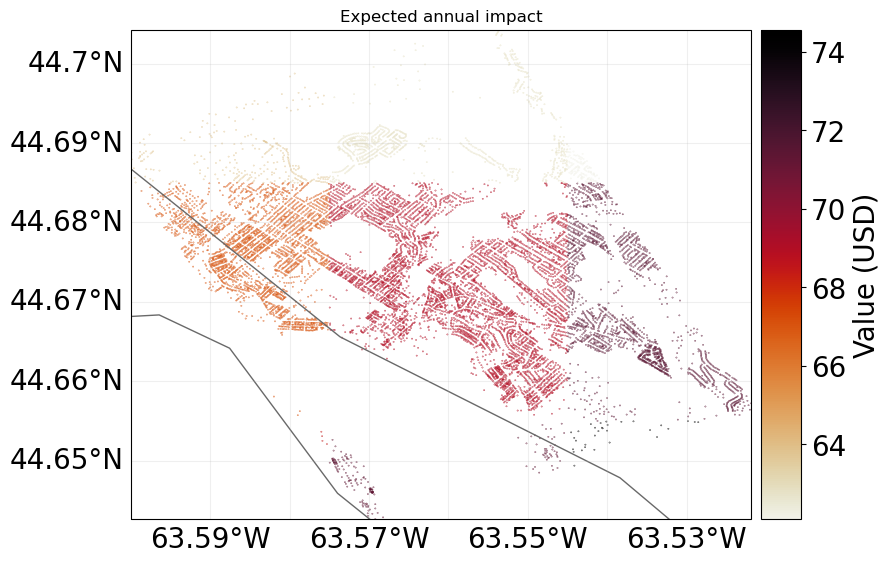

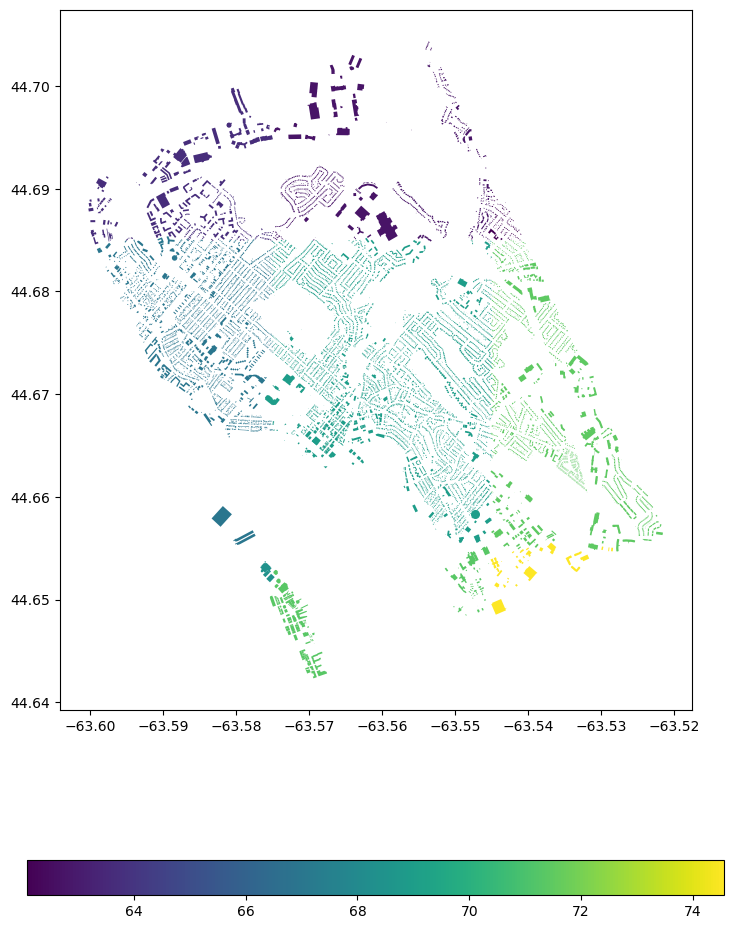

In [263]:
# Plot point-impacts and aggregated impacts
imp_pntgbay.plot_hexbin_eai_exposure(adapt_fontsize=True);
u_lp.plot_eai_exp_geom(imp_geomgbay, legend_kwds={'orientation': 'horizontal'}, markersize=30);

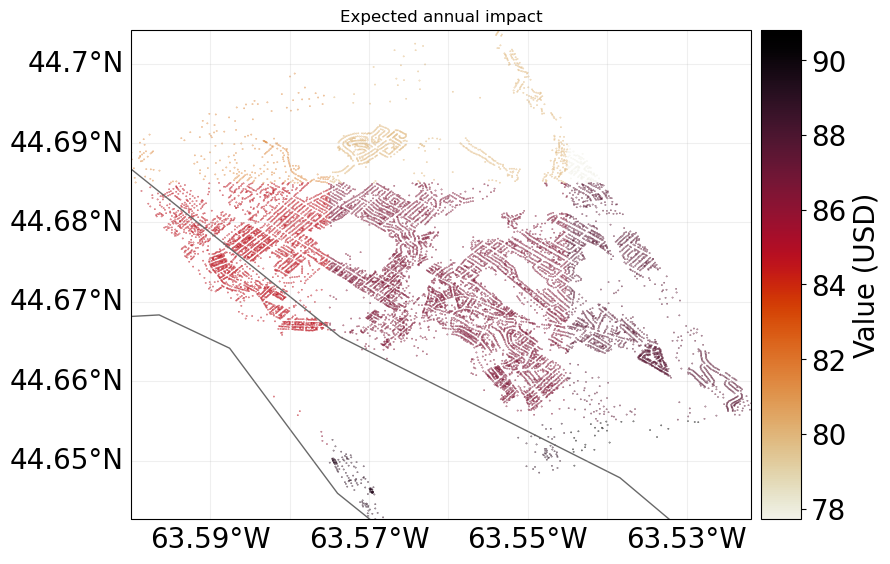

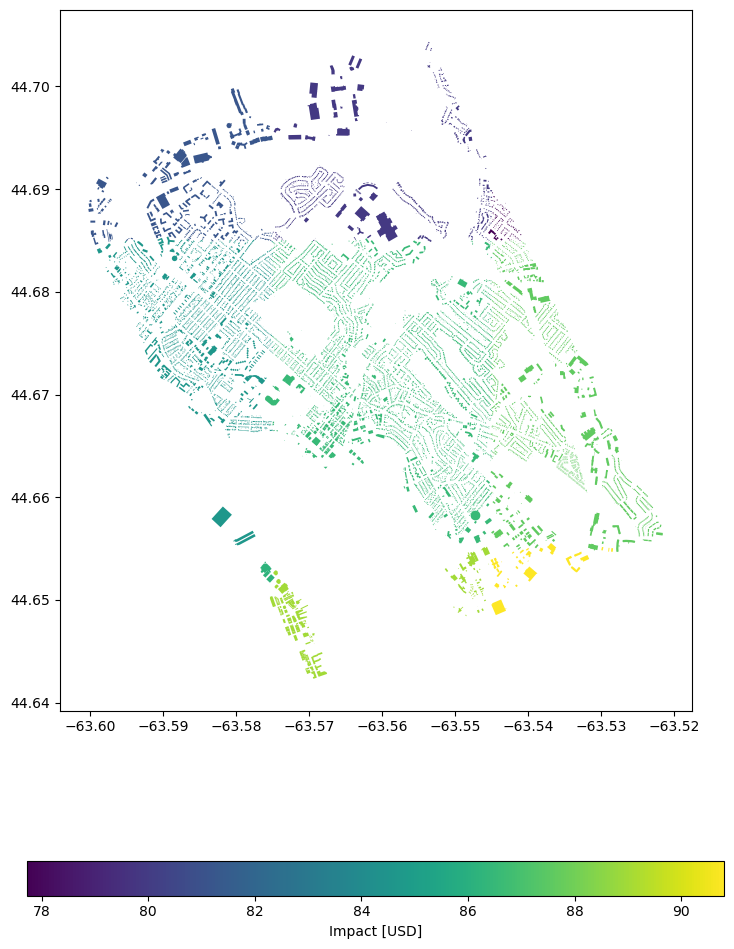

In [264]:
# Plot point-impacts and aggregated impacts
imp_pntgbay45.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay45);

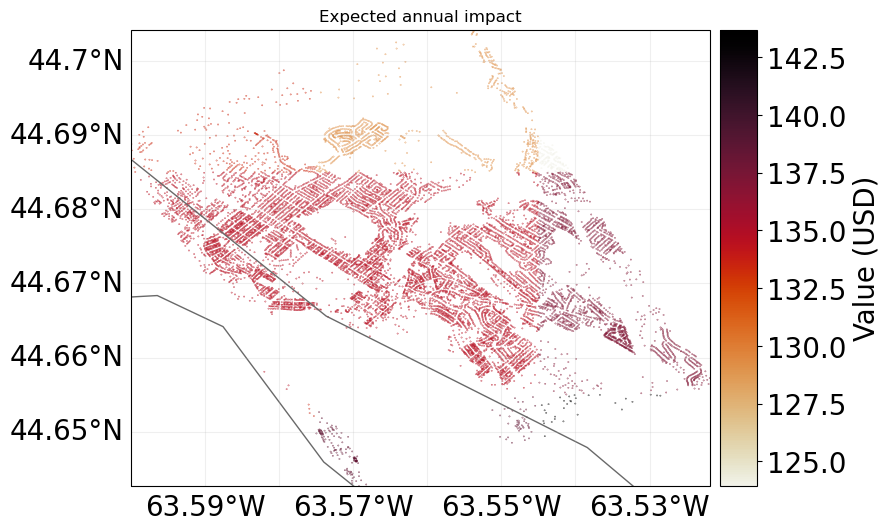

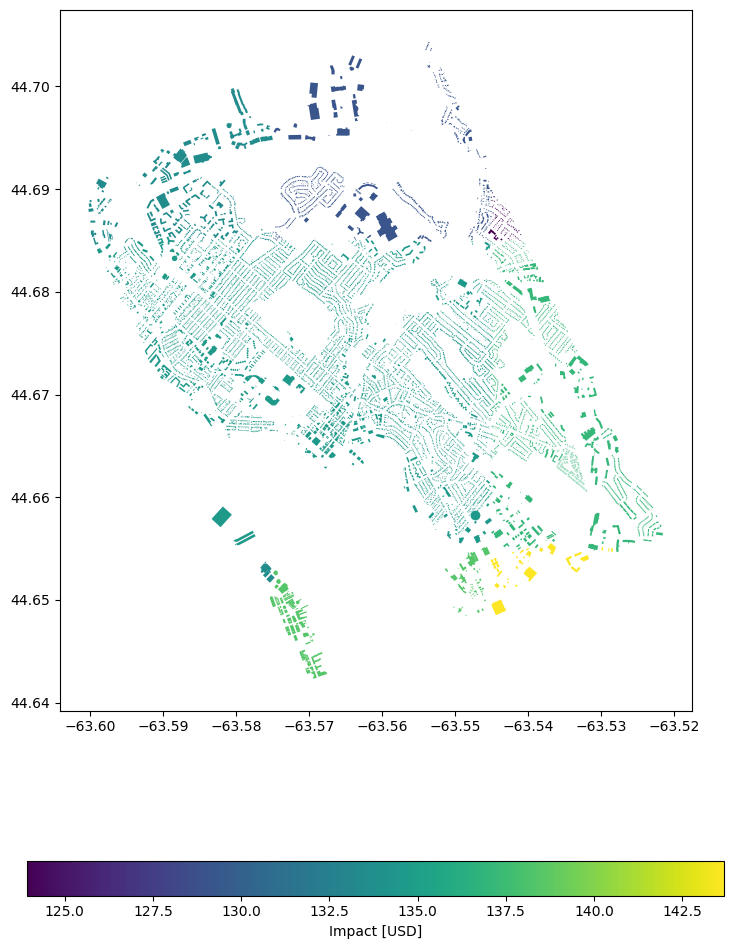

In [265]:
# Plot point-impacts and aggregated impacts
imp_pntgbay85.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay85);

In [204]:
imp_geomgbay85.write_excel('results/impt_pntgbay85_node.xlsx')
imp_geomgbay45.write_excel('results/impt_pntgbay45_node.xlsx')
imp_geomgbay.write_excel('results/impt_pntgbay_node.xlsx')

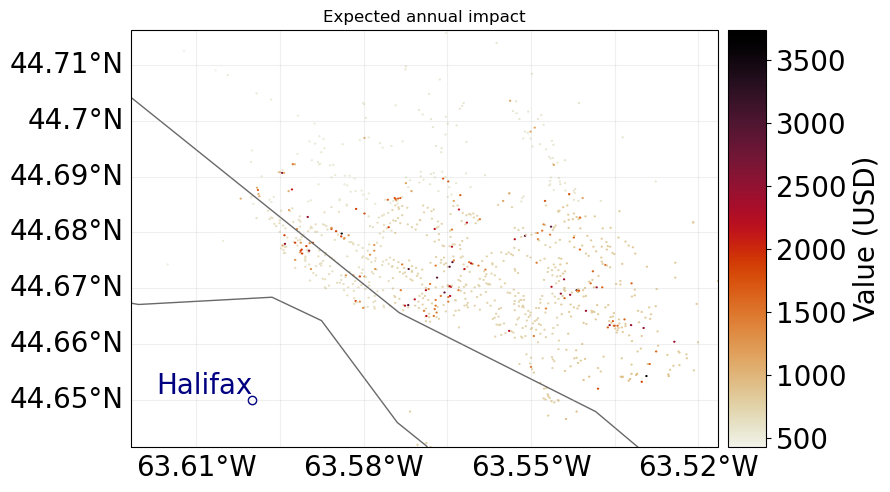

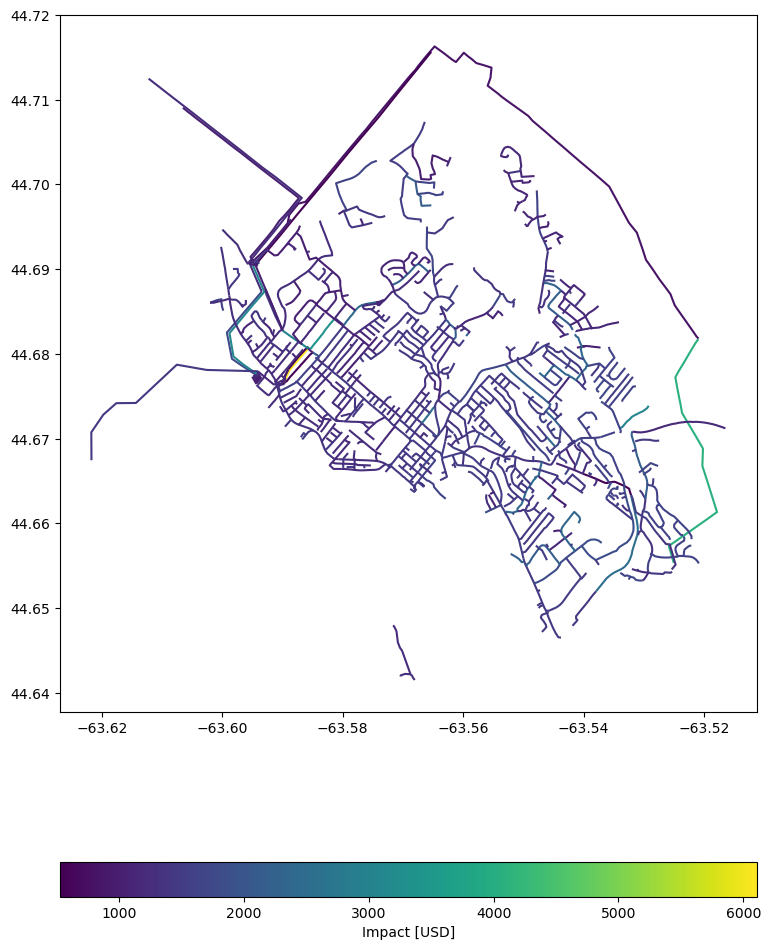

In [230]:
# Plot point-impacts and aggregated impacts
imp_pntgbay2.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay2);

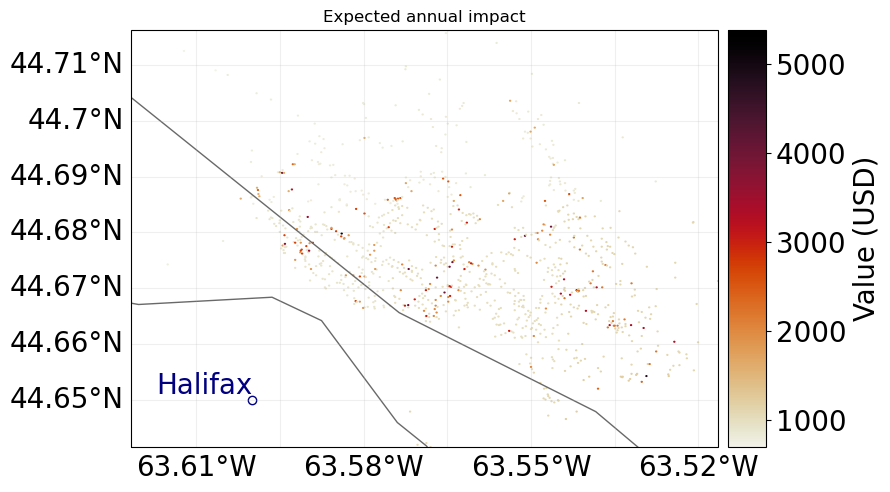

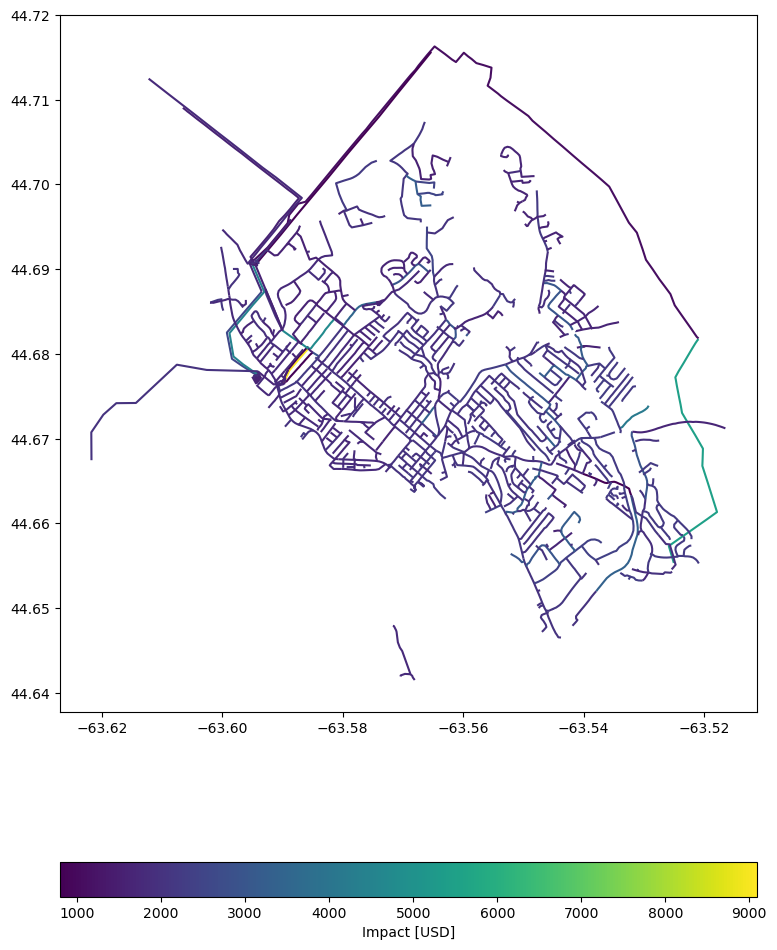

In [231]:
# Plot point-impacts and aggregated impacts
imp_pntgbay245.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay245);

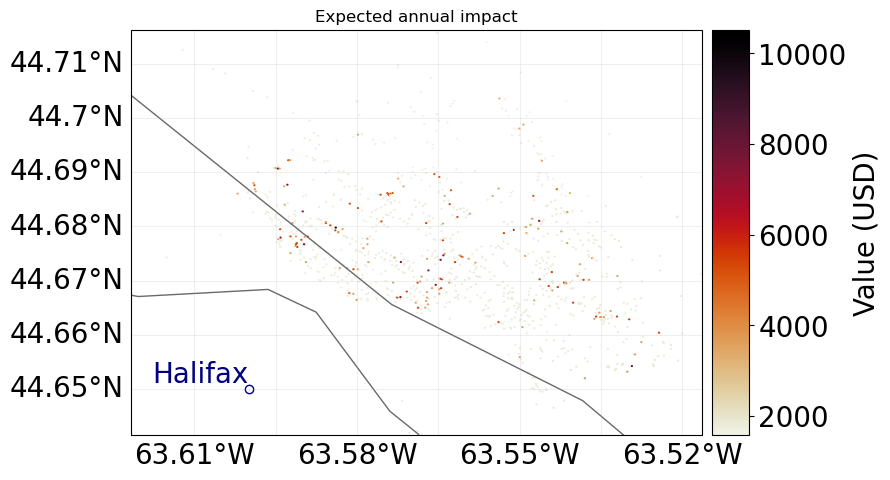

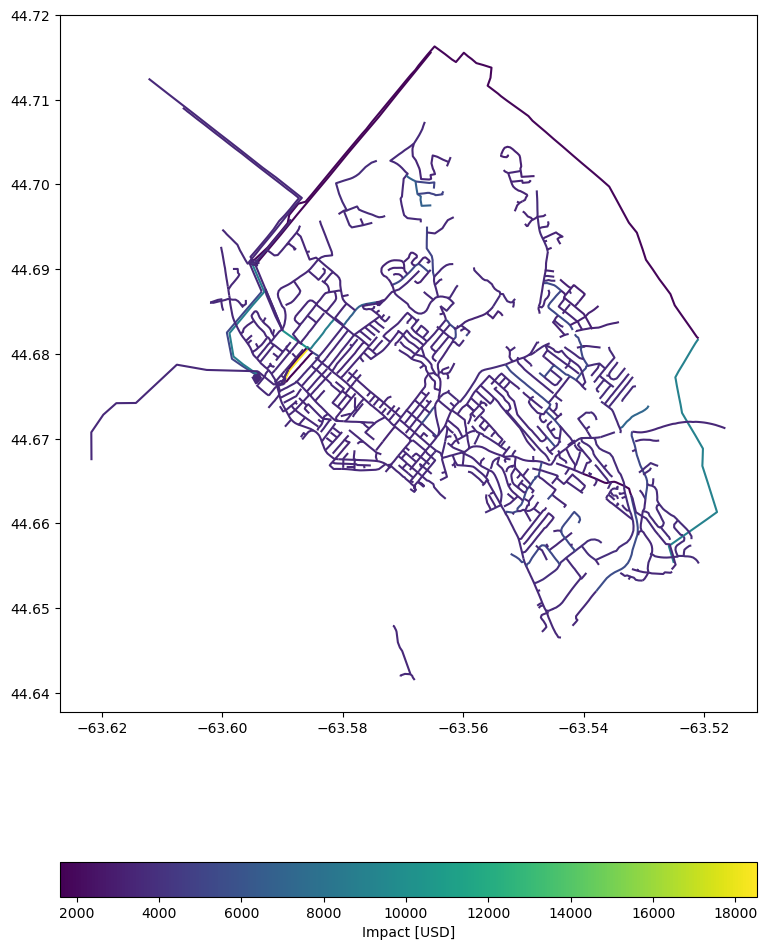

In [232]:
# Plot point-impacts and aggregated impacts
imp_pntgbay285.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay285);

In [233]:
imp_geomgbay285.write_excel('results/impt_pntgbay285_upgrade.xlsx')
imp_geomgbay245.write_excel('results/impt_pntgbay245_upgrade.xlsx')
imp_geomgbay2.write_excel('results/impt_pntgbay2_upgrade.xlsx')

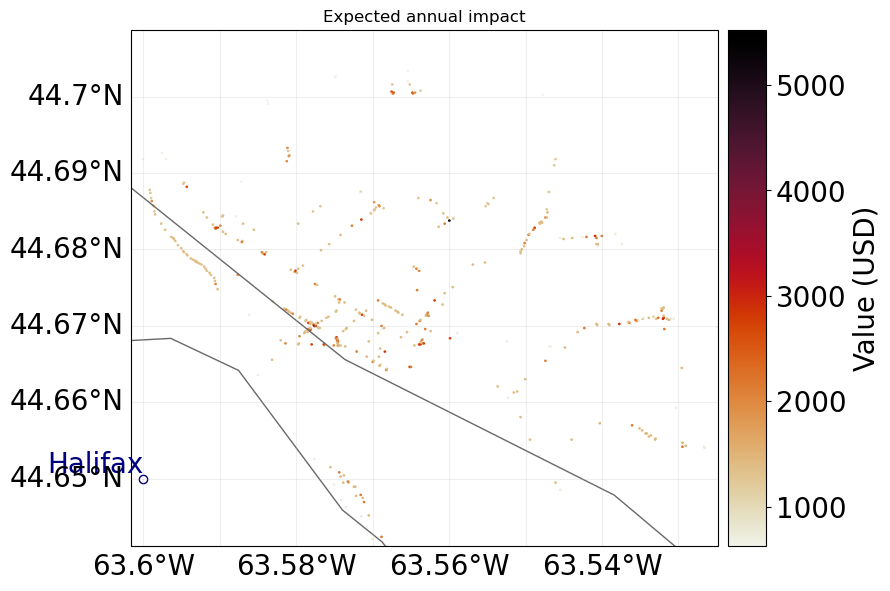

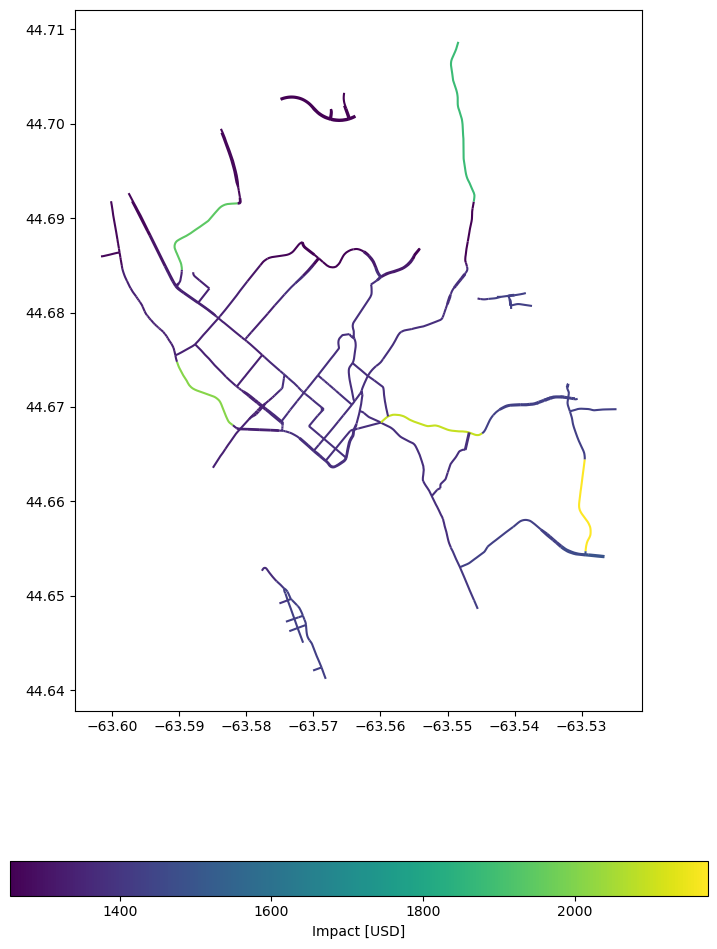

In [234]:
# Plot point-impacts and aggregated impacts
imp_pntgbay3.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay3);

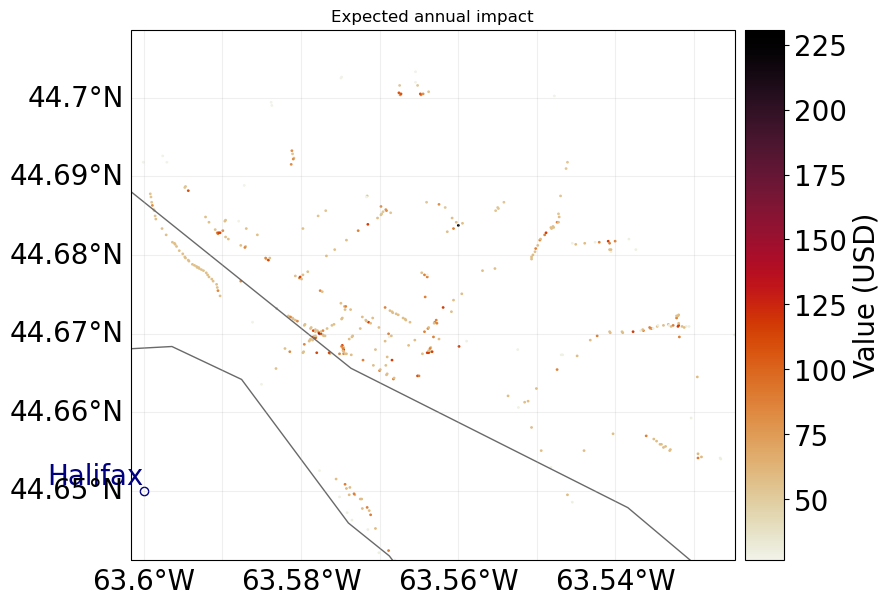

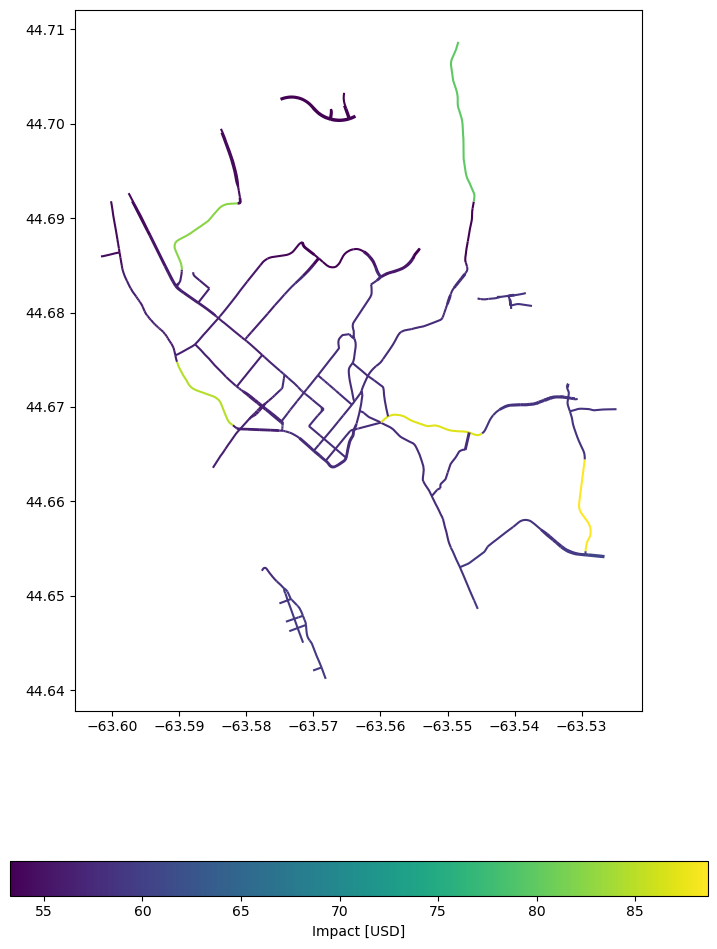

In [183]:
# Plot point-impacts and aggregated impacts
imp_pntgbay345.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay345);

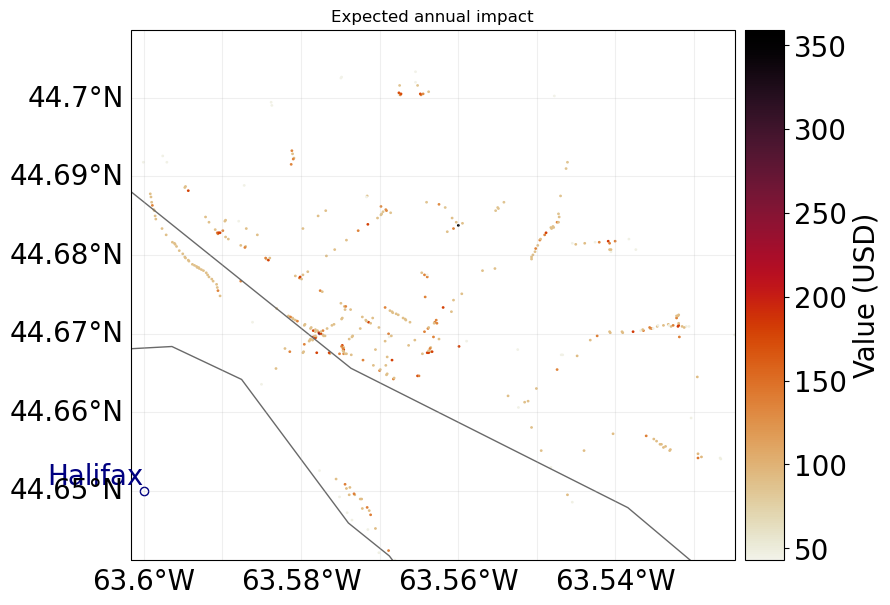

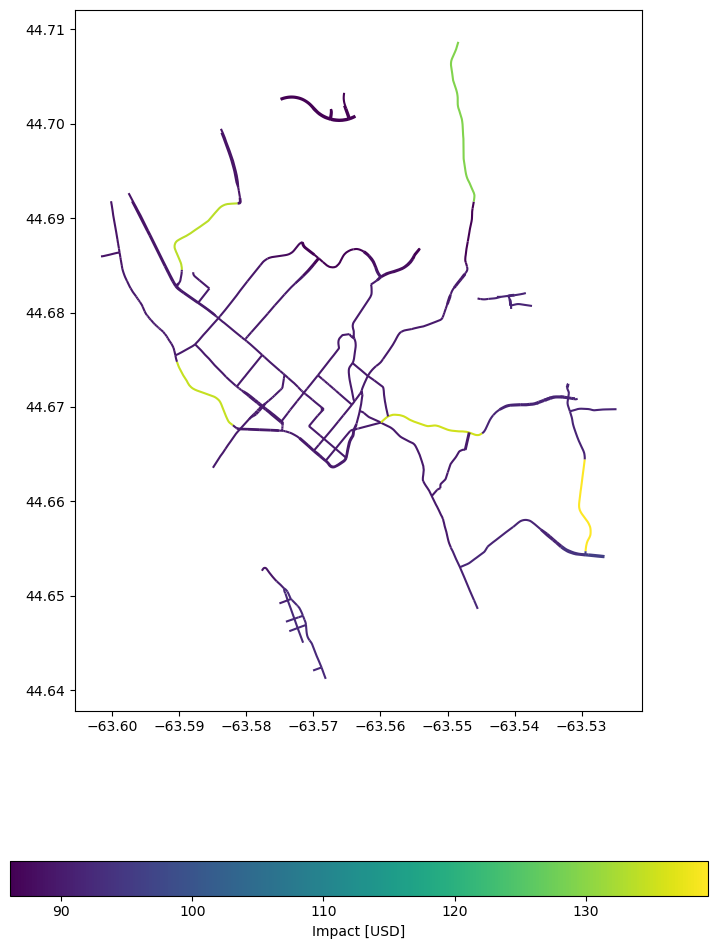

In [184]:
# Plot point-impacts and aggregated impacts
imp_pntgbay385.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay385);

In [146]:
imp_geomgbay385.write_excel('results/impt_pntgbay385.xlsx')
imp_geomgbay345.write_excel('results/impt_pntgbay345.xlsx')
imp_geomgbay3.write_excel('results/impt_pnt3gbay.xlsx')

Expected average annual impact (houses TC): 7.610e+05 USD
Damage with 100-year return period: 4.617e+07 USD


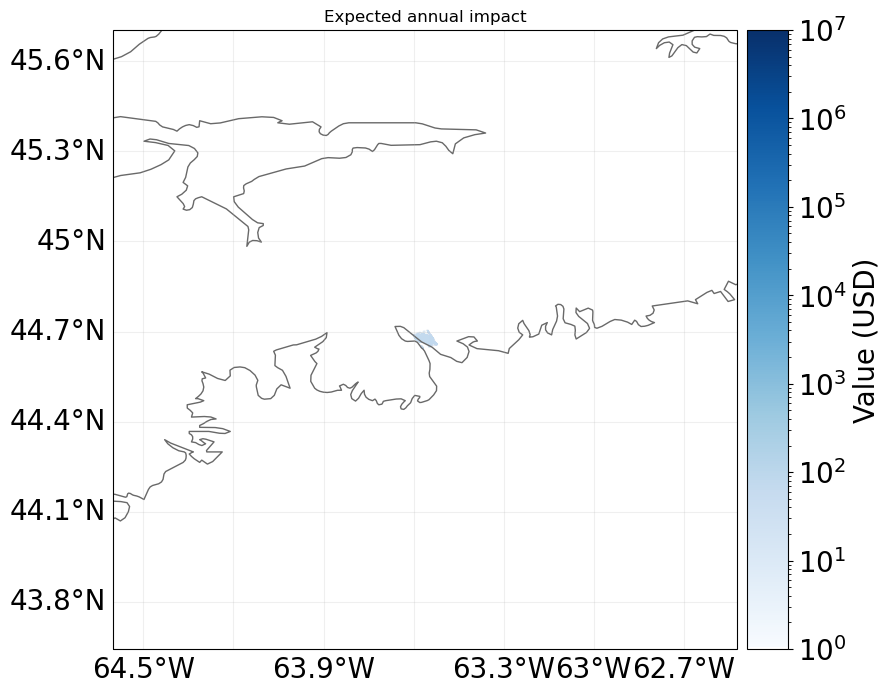

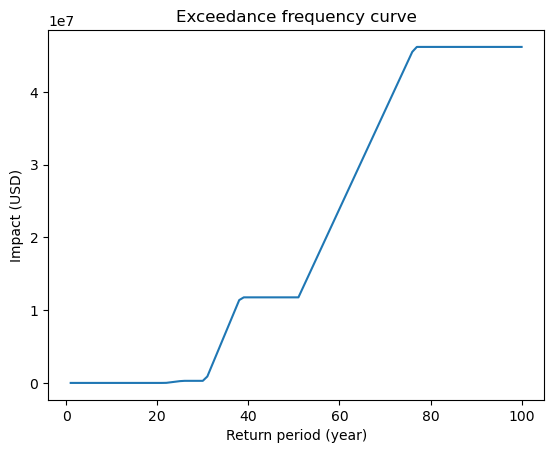

In [266]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC = imp_geomgbay.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 9.536e+05 USD
Damage with 100-year return period: 5.626e+07 USD


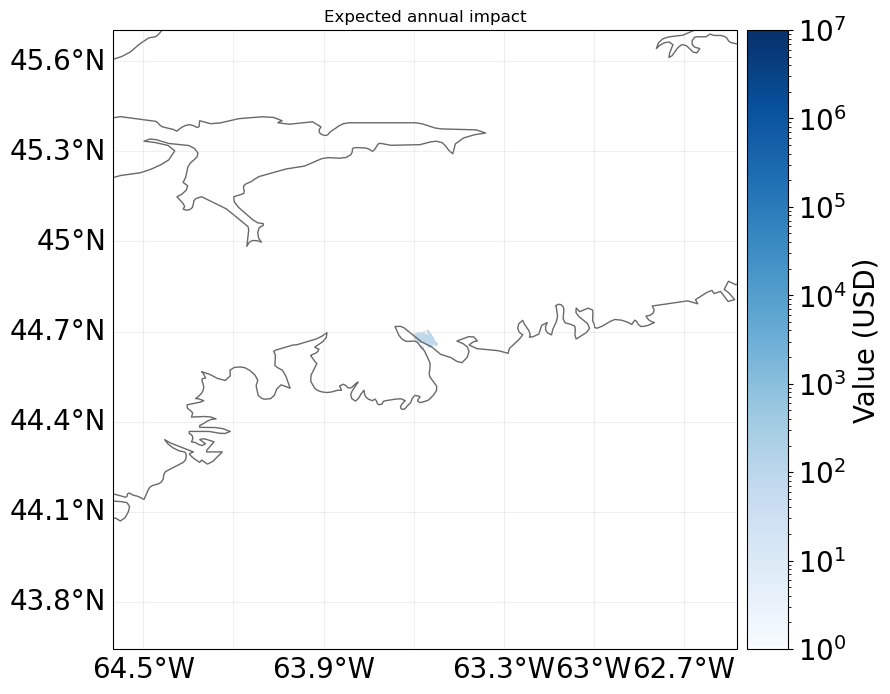

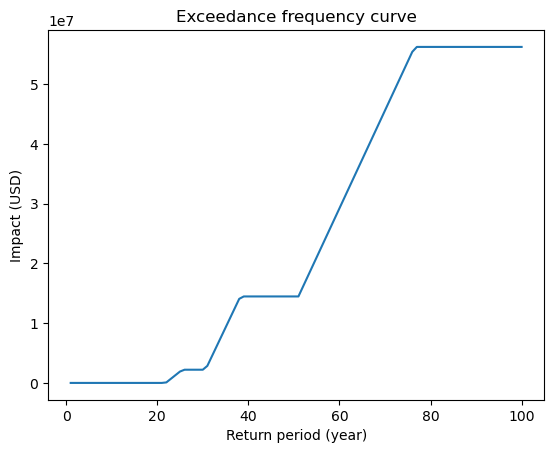

In [267]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay45.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_45 = imp_geomgbay45.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay45.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay45.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.499e+06 USD
Damage with 100-year return period: 8.315e+07 USD


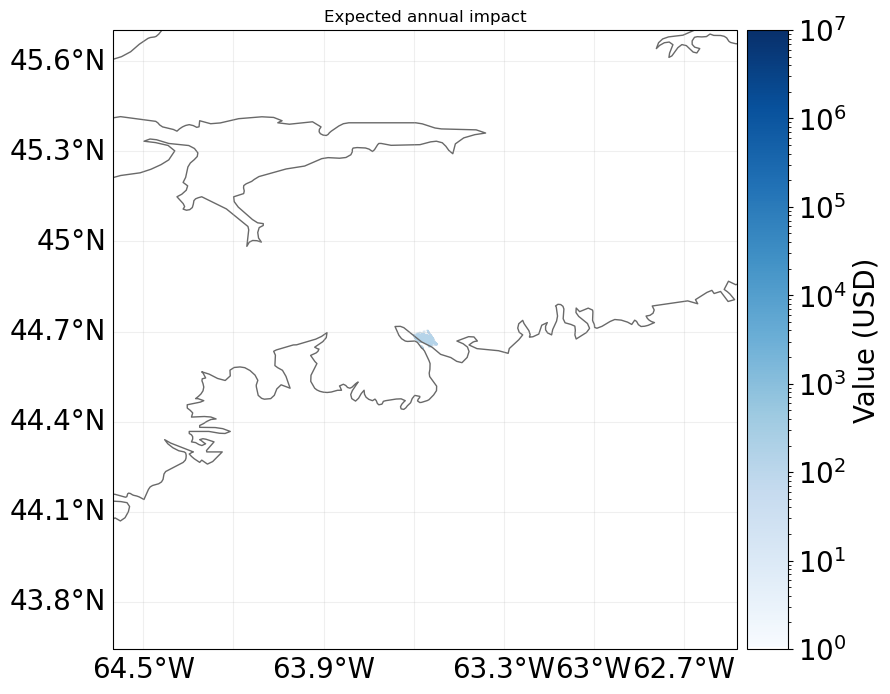

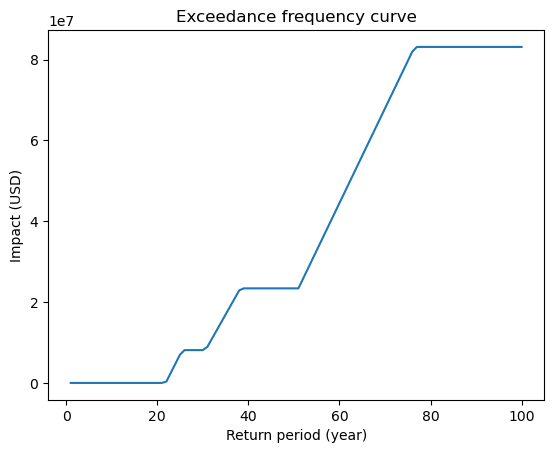

In [268]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay85.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_85 = imp_geomgbay85.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay85.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay85.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 8.679e+04 USD
Damage with 100-year return period: 6.639e+06 USD


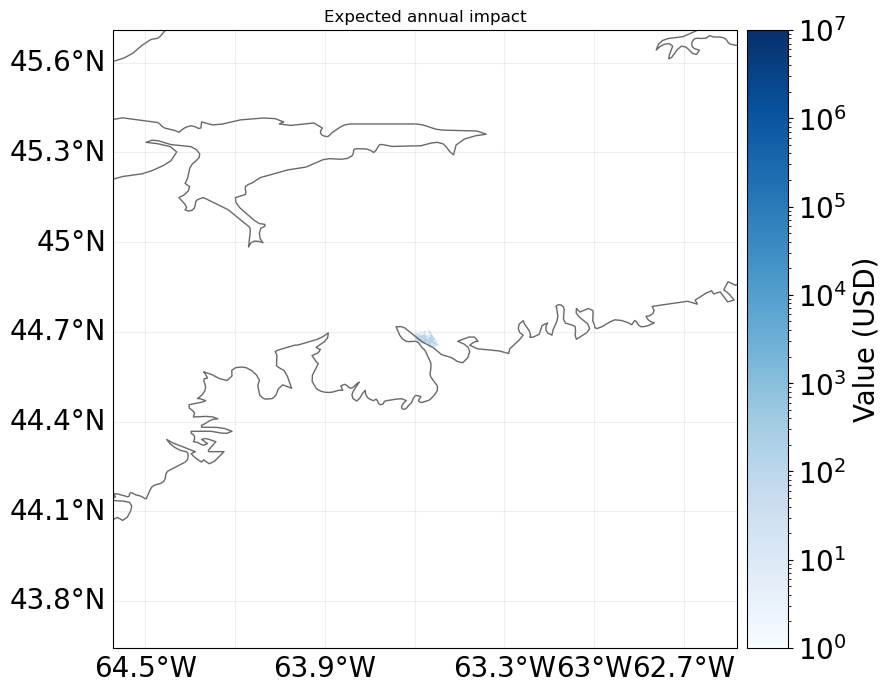

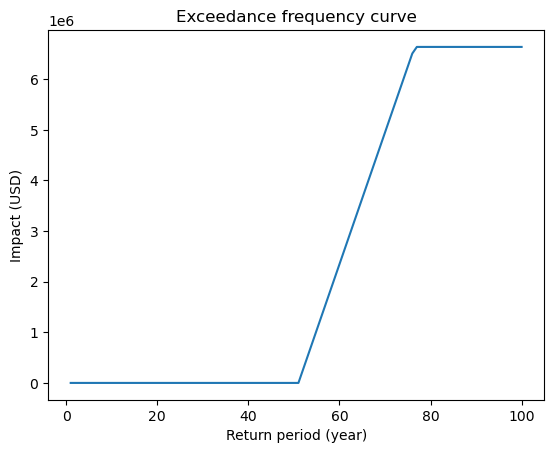

In [269]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay2.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC = imp_geomgbay2.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay2.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay2.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.216e+05 USD
Damage with 100-year return period: 9.305e+06 USD


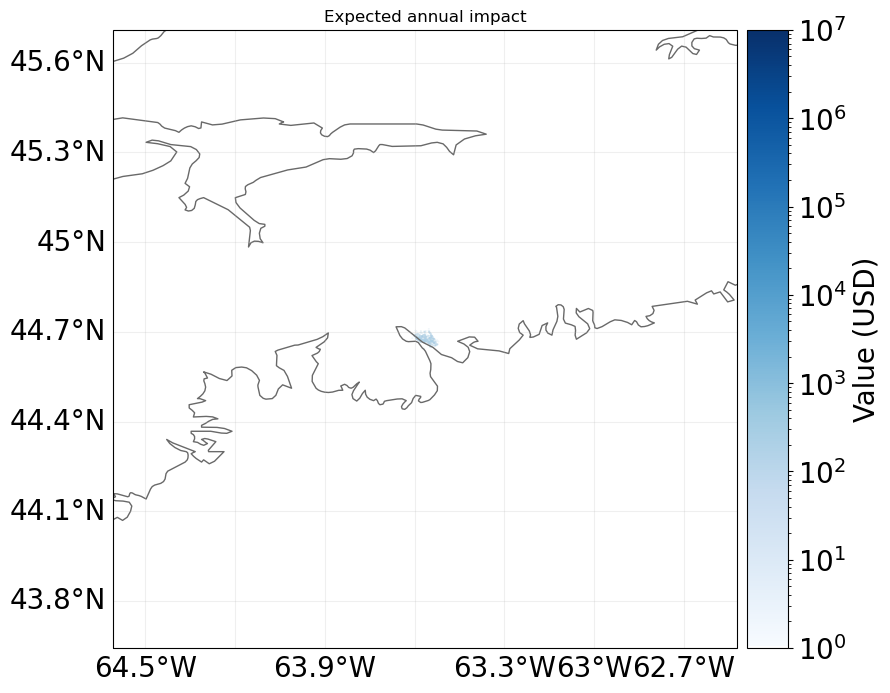

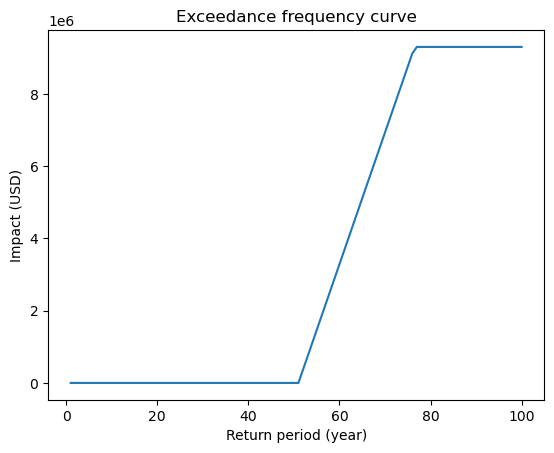

In [270]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay245.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_45 = imp_geomgbay245.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay245.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay245.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 2.227e+06 USD
Damage with 100-year return period: 1.620e+08 USD


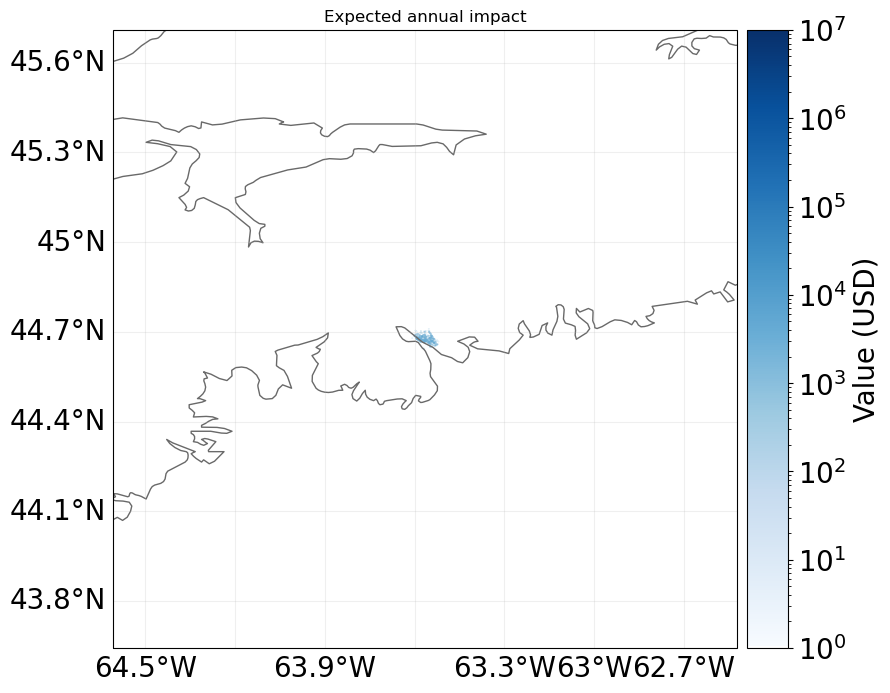

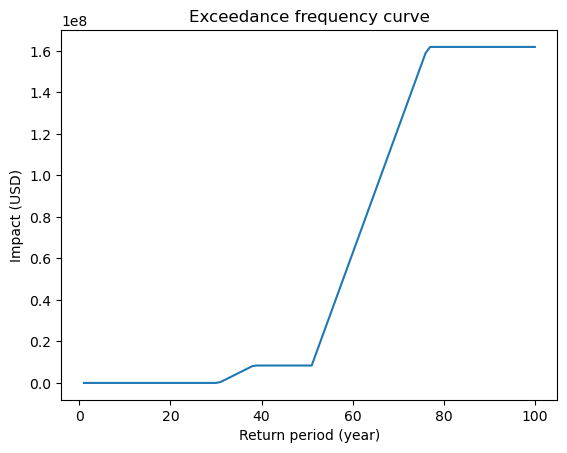

In [245]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay285.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_85 = imp_geomgbay285.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay285.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay285.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 5.957e+04 USD
Damage with 100-year return period: 3.595e+06 USD


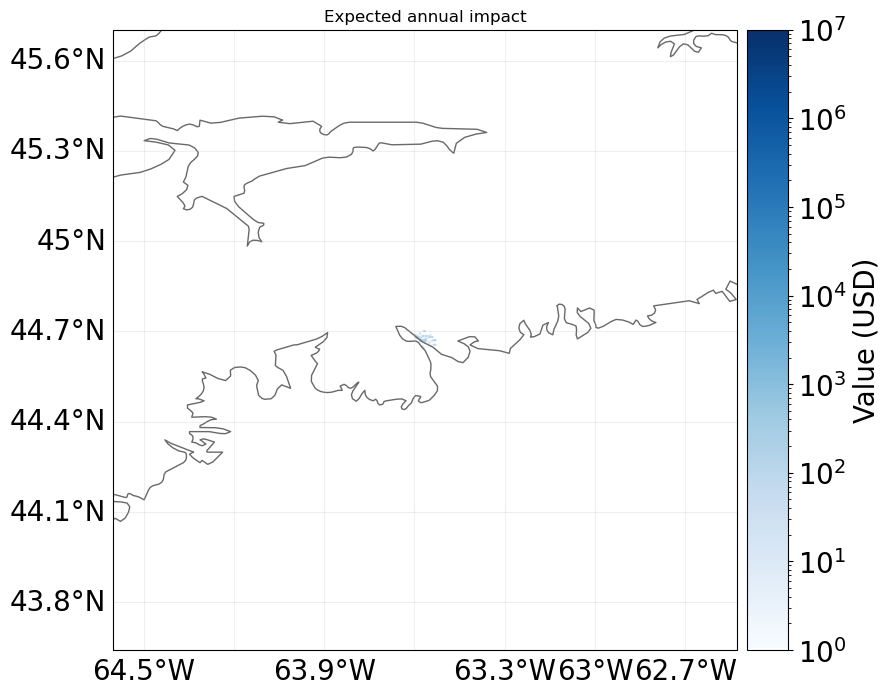

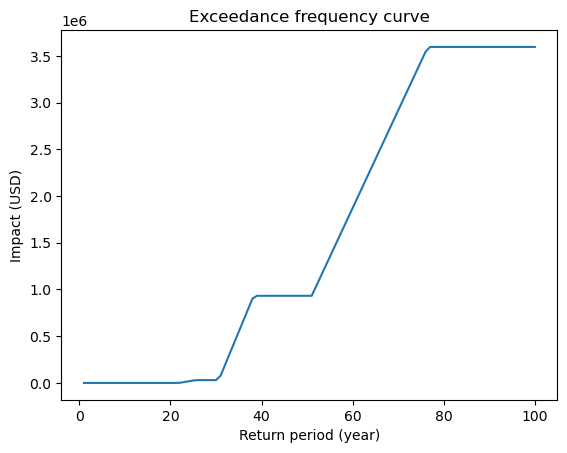

In [271]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay3.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC = imp_geomgbay3.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay3.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay3.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 7.474e+04 USD
Damage with 100-year return period: 4.386e+06 USD


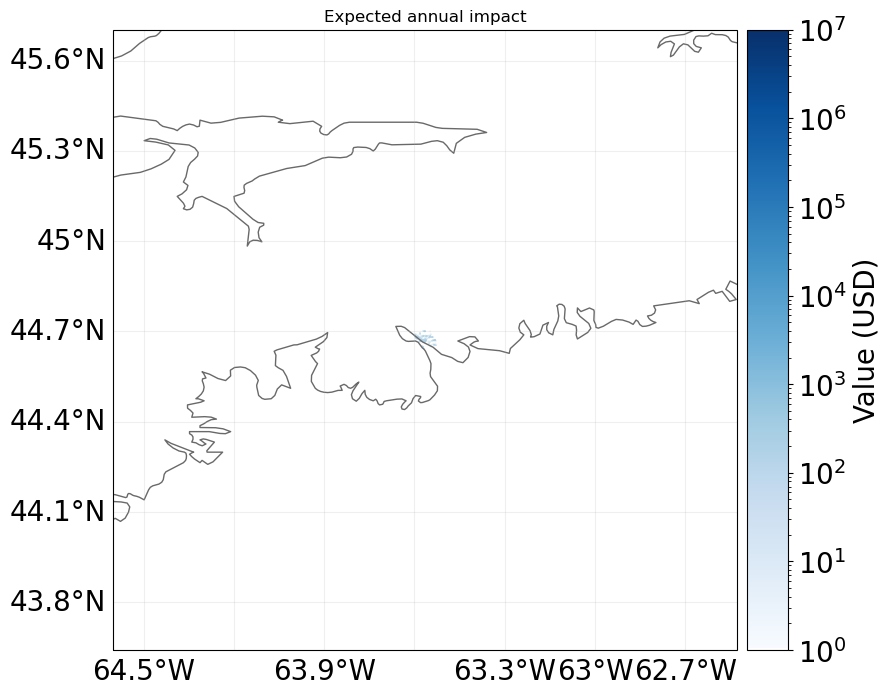

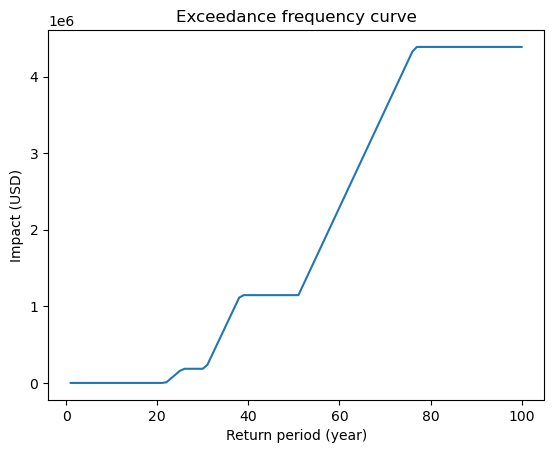

In [272]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay345.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_45 = imp_geomgbay345.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay345.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay345.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.179e+06 USD
Damage with 100-year return period: 6.497e+07 USD


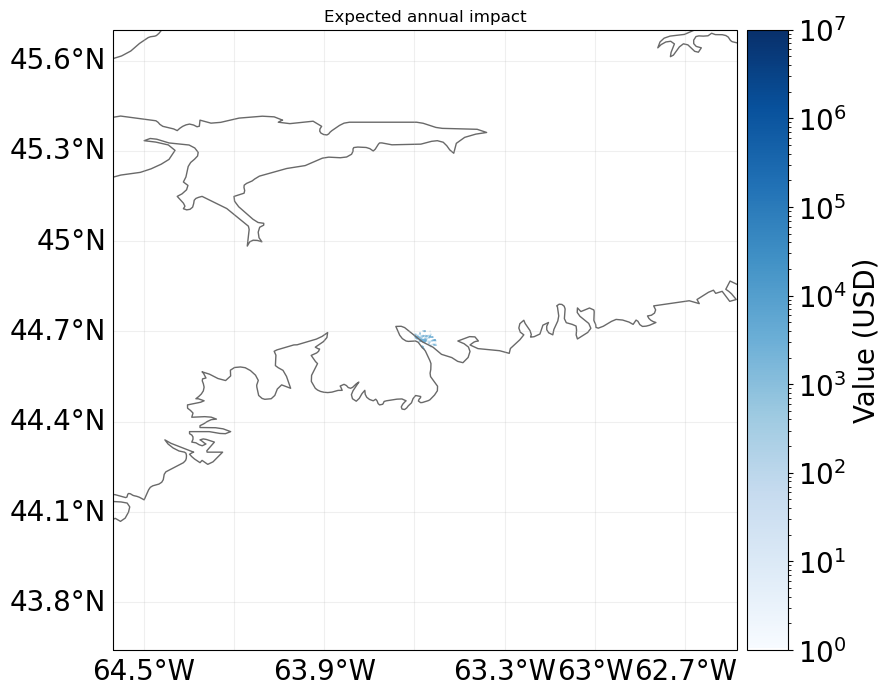

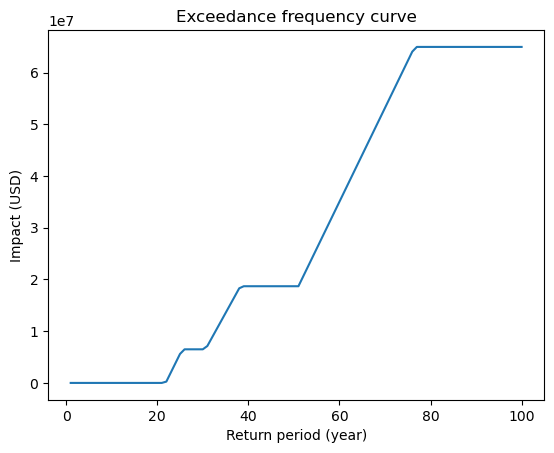

In [248]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay385.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_85 = imp_geomgbay385.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay385.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay385.calc_freq_curve(100).impact))

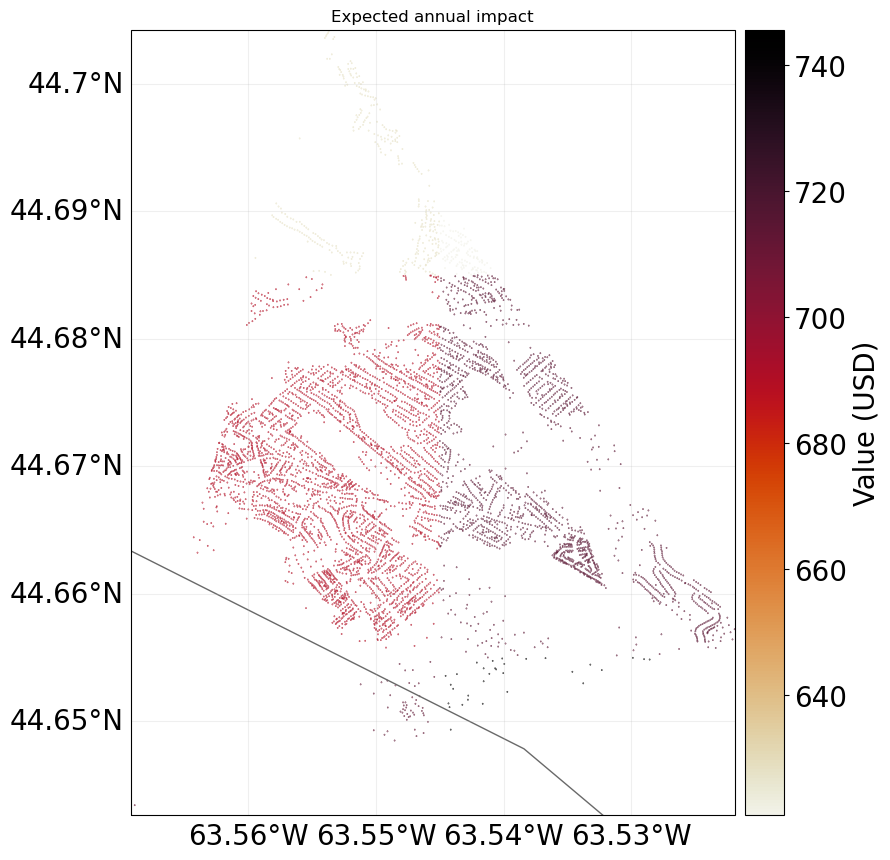

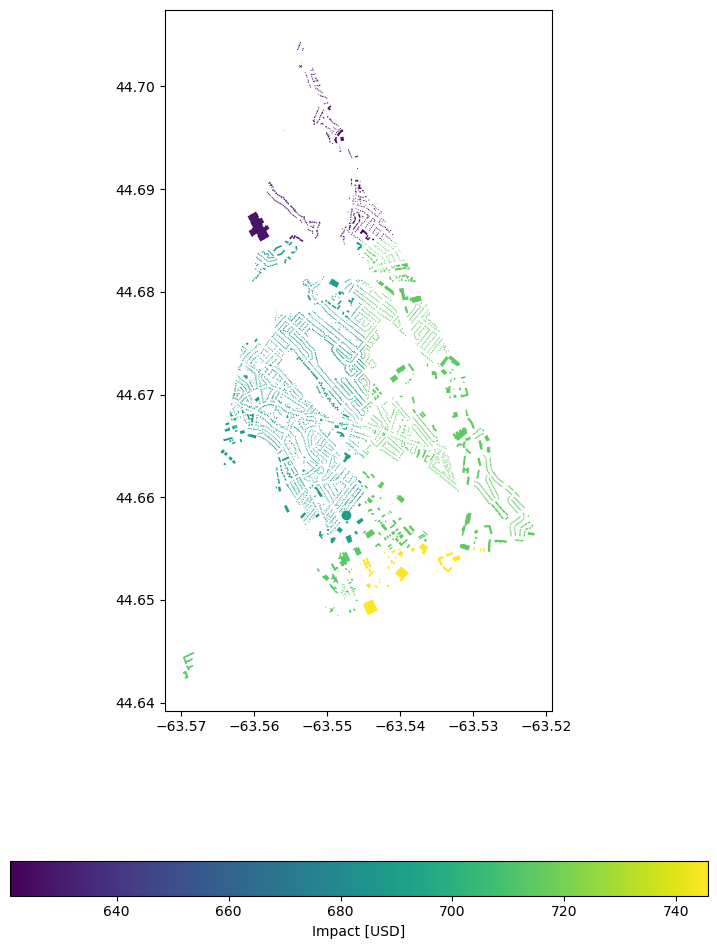

In [111]:
# Plot point-impacts and aggregated impacts
imp_pnt.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geom);

In [230]:
#Plot railways and boundary

import pandas as pd
import geopandas as gpd

gdf1 = imp_pntgbay
gdf2 = gpd.read_file(Path(DEMO_DIR,'Community_Boundaries.shp'))

#gdf_1 = gdf1.to_crs(epsg=4326)
gdf_2 = gdf2.to_crs(epsg=4326)

gdf = gpd.GeoDataFrame(pd.concat([gdf_1, gdf_2]))
gdf.plot(cmap='magma');

ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

In [153]:
#Save Exposure File GBAY

import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_polygbay.write_hdf5(results.joinpath('exp_buildinggbay.h5'))

In [108]:
import os
from climada.util import save, load
from climada.engine import Impact
imp = Impact()
### Uncomment this to save - saves by default to ./results/
save('imp_pnt.p', imp)
### Uncomment this to read the saved data:
# abs_path = os.path.join(os.getcwd(), 'results/impact_puerto_rico_tc.p')
# data = load(abs_path)

#Save Roads Exposure File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_pnt3.write_hdf5(results.joinpath('exp_pnt3.h5'))

AttributeError: 'Exposures' object has no attribute 'save_tiff'

In [73]:
from datetime import datetime
from cartopy import crs as ccrs

from climada.util.config import CONFIG
from climada.engine.forecast import Forecast
from climada.hazard.storm_europe import StormEurope, generate_WS_forecast_hazard
from climada.entity.impact_funcs.storm_europe import ImpfStormEurope
from climada.entity import ImpactFuncSet
from climada.entity import LitPop

In [83]:
%matplotlib inline
# 1: tracks retrieval
from climada.hazard import TCTracks

tr_usax = TCTracks.from_ibtracs_netcdf(provider='usa', storm_id=['2003268N28298']) # CAN

2023-07-07 15:44:52,152 - climada.hazard.tc_tracks - WARNING - The cached IBTrACS data set dates from 2022-05-03 17:22:57 (older than 180 days). Very likely, a more recent version is available. Consider manually removing the file C:\Users\PLN\climada\data\IBTrACS.ALL.v04r00.nc and re-running this function, which will download the most recent version of the IBTrACS data set from the official URL.


In [84]:
# 2: wind gusts computation
from climada.hazard import TropCyclone, Centroids

# define centroids raster
min_lat, max_lat, min_lon, max_lon = 43.3, 47.1, -66.5, -59.5
cent_nsx = Centroids.from_pnt_bounds((min_lon, min_lat, max_lon, max_lat), res=0.03)
cent_nsx.set_dist_coast(signed=True, precomputed=True)
cent_nsx.check()

tc_nsx = TropCyclone.from_tracks(tr_usax, centroids=cent_nsx, ignore_distance_to_coast=False)

In [104]:
run_datetime=datetime(2022,7,10)
#create and calculate Forecast
CH_WS_forecast = Forecast({run_datetime: tc_nsx}, exp_house, IFs_TC_houses)
CH_WS_forecast.calc()

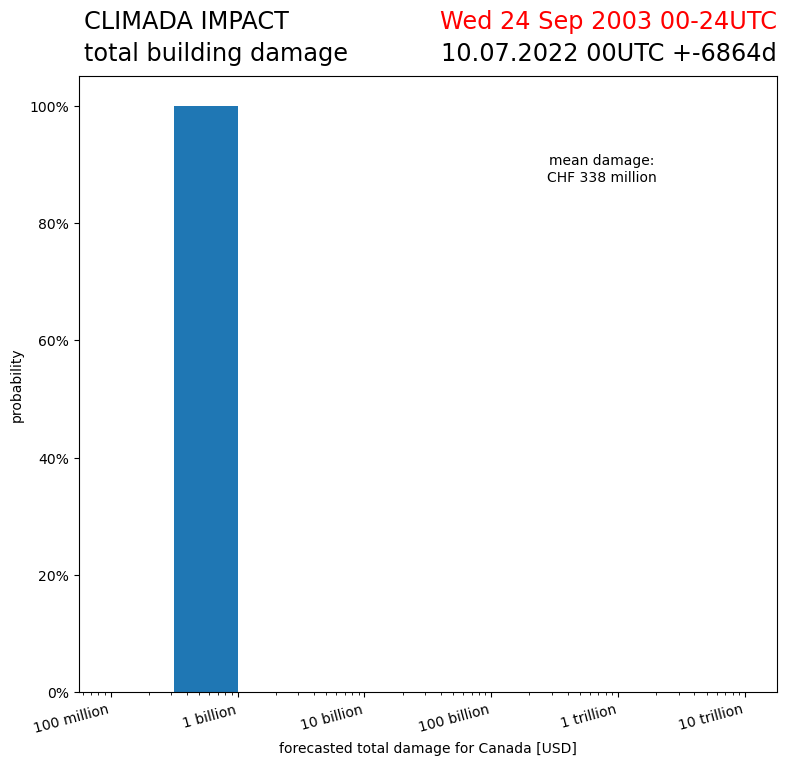

In [105]:
CH_WS_forecast.plot_hist(save_fig=False,close_fig=False);

In [59]:
# Point-impact
imp_pnt2 = ImpactCalc(exp_pnt3, IFs_TS_houses, hazard=ts_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf and not the exposures)
imp_geom = u_lp.impact_pnt_agg(imp_pnt, exp_pnt3.gdf, agg_met=u_lp.AggMethod.SUM)

AttributeError: 'list' object has no attribute 'calc_mdr'

In [ ]:

from climada.entity.exposures import Exposures

# gdf needs to be in a projected CRS (lat/lon) to allow for constructing metre-based grids
gdf_ns_building = gdf_ns_building.set_crs(epsg=4326)

exp_buildings_zrh = Exposures()
# one point per 50m2, 5400$/m2 assumed value, all points same value ('cnst'):
exp_buildings_zrh.set_from_polygons(gdf_ns_building, m2_per_point=50, m2_value=5400, disagg_values='cnst')


AttributeError: 'Exposures' object has no attribute 'set_from_polygons'

In [135]:
from climada.entity.exposures import Exposures
from shapely.geometry import Polygon, Polygon, MultiPolygon, Point, box

# gdf needs to be in a projected CRS (lat/lon) to allow for constructing metre-based grids
gdf_ns_buildings = gdf_ns_buildings.set_crs(epsg=4326)

exp_power = Exposures((gdf_ns_buildings))
exp_power.gdf['impf_WS'] = 1
exp_power.gdf['value'] = 1
exp_power.gdf.head()



# Disaggregate exposure to 10'000 metre grid, each point gets average value within polygon.
exp_pnt = u_lp.exp_geom_to_pnt(
   exp_power, res=100, to_meters=True,
    disagg_met=u_lp.DisaggMethod.DIV, disagg_val=None
)
exp_pnt.gdf.head()

2022-11-05 12:55:55,525 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,534 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,545 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,556 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,560 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,566 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,573 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2022-11-05 12:55:55,580 - climada.util.lines_pol

osm_id                                      geometry_orig  \
1 0  67417784  LINESTRING (-64.65869 44.31277, -64.65730 44.3...   
  1  67417784  LINESTRING (-64.65869 44.31277, -64.65730 44.3...   
  2  67417784  LINESTRING (-64.65869 44.31277, -64.65730 44.3...   
  3  67417784  LINESTRING (-64.65869 44.31277, -64.65730 44.3...   
  4  67417784  LINESTRING (-64.65869 44.31277, -64.65730 44.3...   

                                                  tags  impf_WS     value  \
1 0  {'frequency': '60', 'operator': 'Emera', 'oper...        1  0.012346   
  1  {'frequency': '60', 'operator': 'Emera', 'oper...        1  0.012346   
  2  {'frequency': '60', 'operator': 'Emera', 'oper...        1  0.012346   
  3  {'frequency': '60', 'operator': 'Emera', 'oper...        1  0.012346   
  4  {'frequency': '60', 'operator': 'Emera', 'oper...        1  0.012346   

                       geometry   latitude  longitude  
1 0  POINT (-64.65869 44.31277)  44.312772 -64.658693  
  1  POINT (-64.65757 44.31328)  44.313277 -64.657575  
  2  POINT (-64.65645 44.31376)  44.313763 -64.656448  
  3  POINT (-64.65532 44.31424)  44.314241 -64.655317  
  4  POINT (-64.65418 44.31471)  44.314705 -64.654182

In [136]:
#Save Power Exposure File

import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
exp_power.write_hdf5(results.joinpath('exp_power.h5'))

2022-11-05 12:56:05,539 - climada.entity.exposures.base - INFO - Writing C:\Users\PLN\climada_workspace\climada_python\ECA_Vancouverisland\Codes\results\exp_power.h5


In [34]:
#Simulate Hazard

#Define paths and file names

# Wind
fl_HAZ_tc = fl_HAZ_tc_cc0 # This path is defined in Configuration.py, indicating the wind hazard under current climate scenario. Please change the path there

fl_HAZ_tc_45 = os.path.join(project_folder, 'HAZ_tc_cc45_mix50_wof_' + country + file_identifier + '.hdf5')

fl_HAZ_tc_85 = os.path.join(project_folder, 'HAZ_tc_cc85_mix50_wof_' + country + file_identifier + '.hdf5')


# Surge
fl_HAZ_ts = os.path.join(project_folder, 'HAZ_ts_mix50_CDEM_' + country + file_identifier + '.hdf5')

fl_HAZ_ts_45 = os.path.join(project_folder, 'HAZ_ts_cc45_mix50_CDEM_' + country + file_identifier + '.hdf5')

fl_HAZ_ts_85 = os.path.join(project_folder, 'HAZ_ts_cc85_mix50_CDEM_' + country + file_identifier + '.hdf5')

2023-08-11 20:48:18,577 - climada.hazard.tc_tracks - WARNING - The cached IBTrACS data set dates from 2022-05-03 17:22:57 (older than 180 days). Very likely, a more recent version is available. Consider manually removing the file C:\Users\PLN\climada\data\IBTrACS.ALL.v04r00.nc and re-running this function, which will download the most recent version of the IBTrACS data set from the official URL.


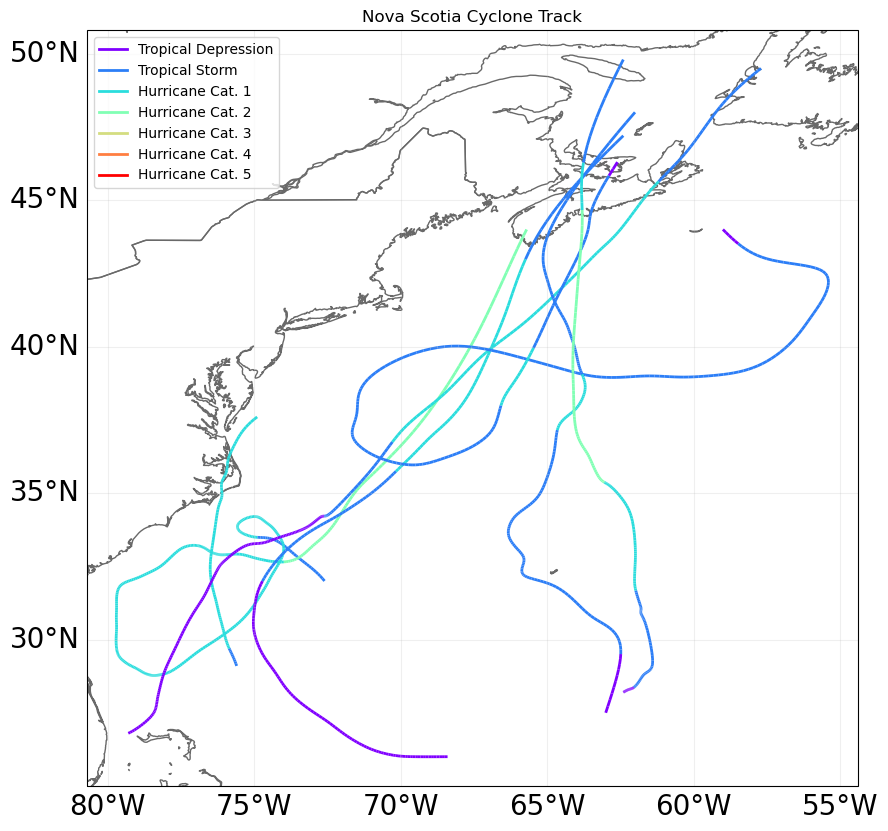

In [35]:
#Wind of tropical cyclones

%matplotlib inline
# 1: tracks retrieval
from climada.hazard import TCTracks

tr_usa = TCTracks.from_ibtracs_netcdf(provider='usa', storm_id=['2003268N28298', '1991302N44301', '2001284N28297', '1971223N27280', '1975205N26292', '1963291N26288', '1953223N23286']) # CAN  
tr_usa.equal_timestep(0.5)
ax = tr_usa.plot()
ax.get_legend()._loc = 2 # correct legend location
ax.set_title('Nova Scotia Cyclone Track'); # set title

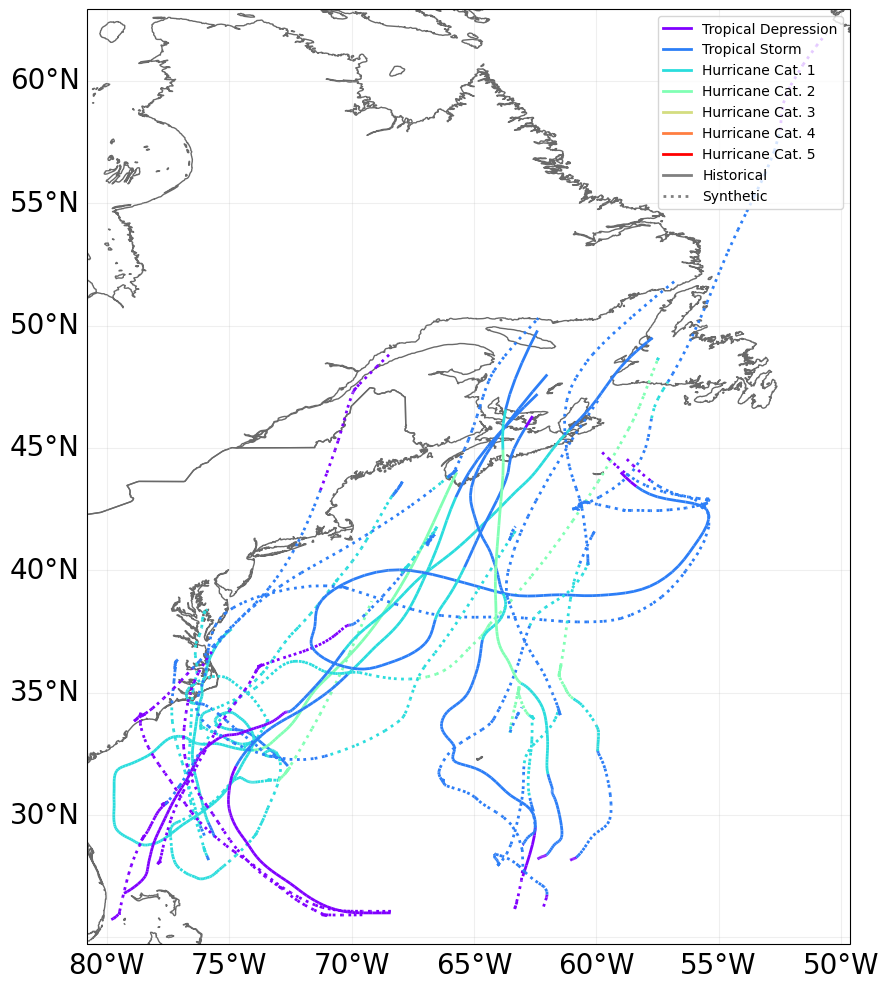

In [36]:
#Generate Probabilistic Events

# here we use tr_irma retrieved from IBTrACS with the function above
# select number of synthetic tracks (nb_synth_tracks) to generate per present tracks.
tr_usa.equal_timestep()
tr_usa.calc_perturbed_trajectories(nb_synth_tracks=2, max_shift_ini=1.5, max_dspeed_rel=1.5)
tr_usa.plot();
# see more configutration options (e.g. amplitude of max random starting point shift in decimal degree; max_shift_ini)

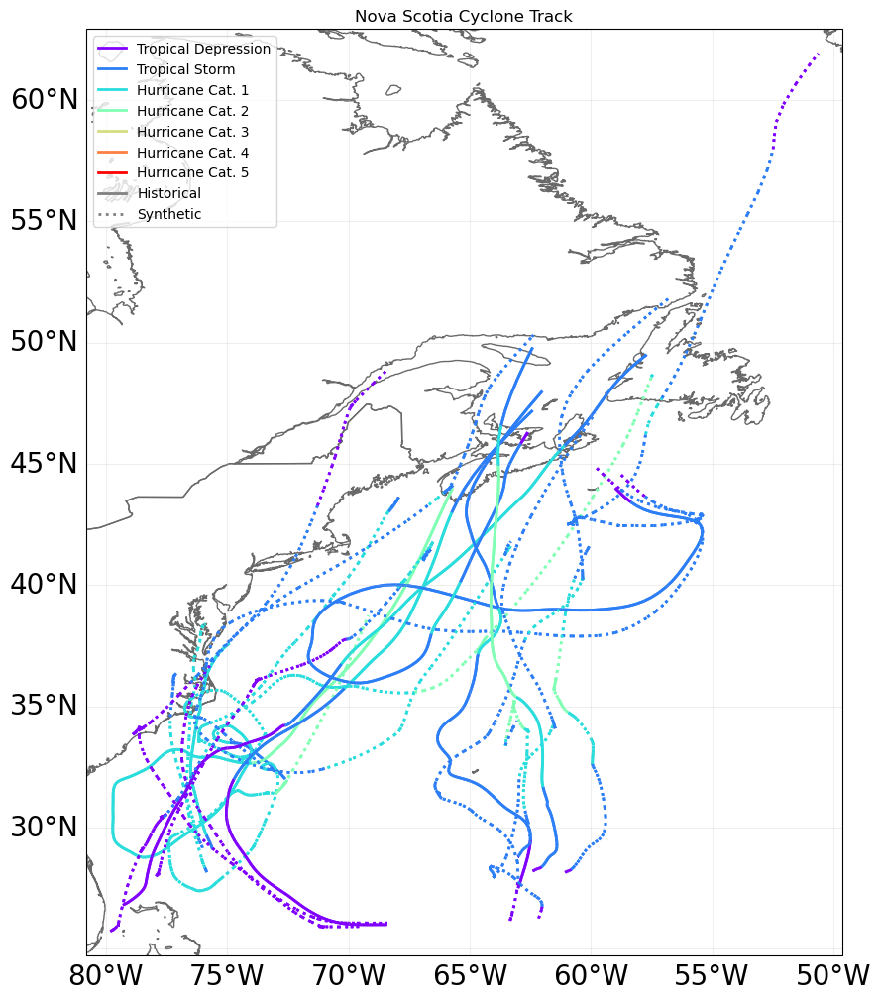

In [37]:
#tracks retrieval
from climada.hazard import TCTracks

tr_usa.append(tr_usa.data) # put both tracks together
ax = tr_usa.plot()
ax.get_legend()._loc = 2 # correct legend location
ax.set_title('Nova Scotia Cyclone Track'); # set title

In [38]:
# 2: wind gusts computation
from climada.hazard import TropCyclone, Centroids

# define centroids raster
min_lat, max_lat, min_lon, max_lon = 43.3, 47.1, -66.5, -59.5
cent_ns = Centroids.from_pnt_bounds((min_lon, min_lat, max_lon, max_lat), res=0.03)
cent_ns.set_dist_coast(signed=True, precomputed=True)
cent_ns.check()

tc_ns = TropCyclone.from_tracks(tr_usa, centroids=cent_ns, ignore_distance_to_coast=False)

In [23]:
# 3: surge computation
from climada_petals.hazard import TCSurgeBathtub
from climada.util.constants import DEMO_DIR

# If you have the global SRTM15+V2.0 elevation data set, you can replace the following
# sample DEM data set by your SRTM15+V2.0.tiff:
topo_path = DEMO_DIR.joinpath('SRTM15+V2.tif')
ts_ns = TCSurgeBathtub.from_tc_winds(tc_ns, topo_path)

<GeoAxesSubplot:>

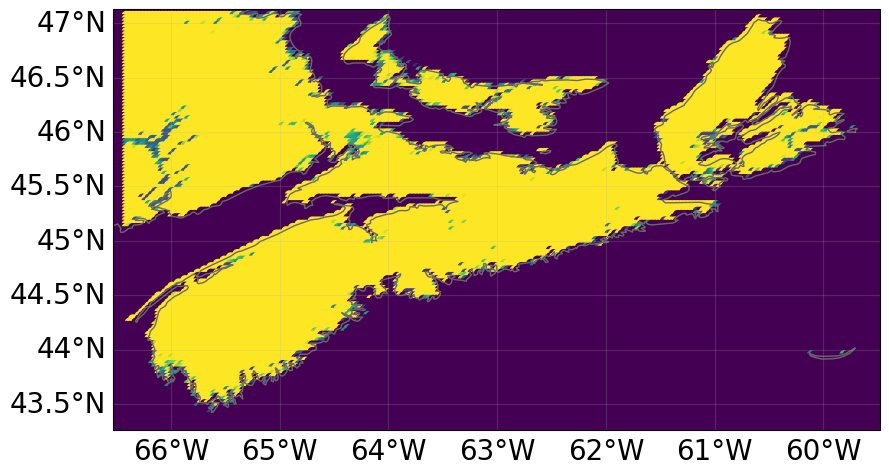

In [24]:
# plot elevation of the raster
ts_ns.centroids.set_elevation(topo_path)
ts_ns.centroids.plot(c=ts_ns.centroids.elevation, vmin=-2.0, vmax=10)

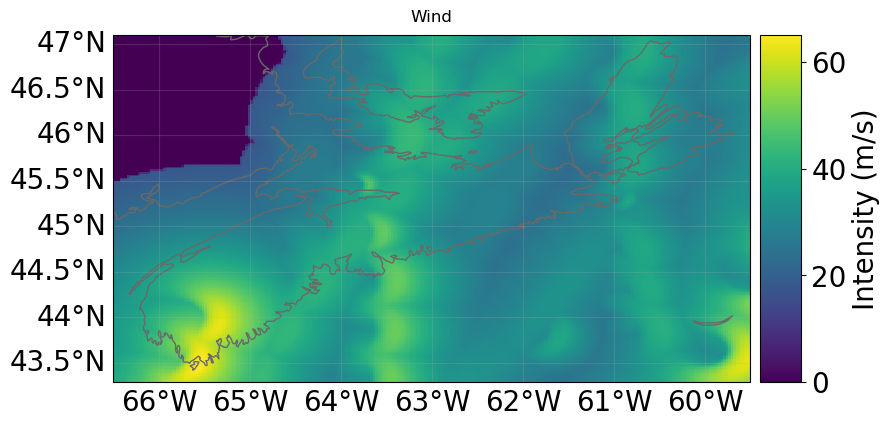

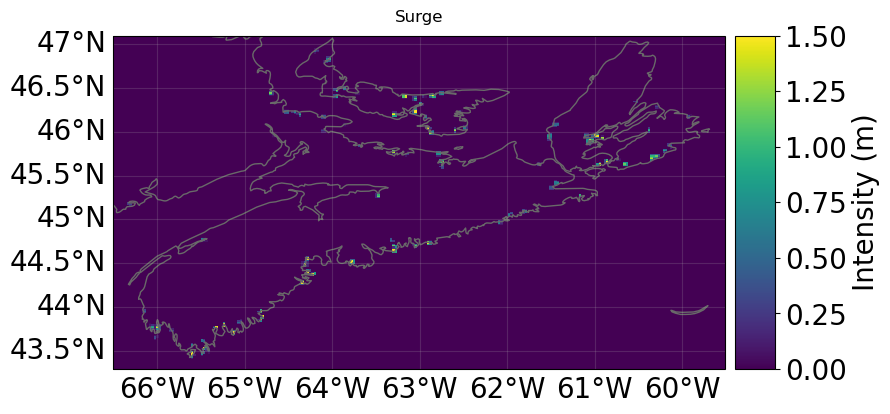

In [25]:
# plot wind and surge cyclone
norm = colors.LogNorm(vmin=1, vmax=5.0e7)

ax = tc_ns.plot_intensity(event=0, adapt_fontsize=True)
ax.set_title('Wind')
ax = ts_ns.plot_intensity(event=0, vmax=1.5, adapt_fontsize=True)
ax.set_title('Surge');

In [432]:
tr_usa.data[-1] # last synthetic track. notice the value of orig_event_flag and name

<xarray.Dataset>
Dimensions:                 (time: 121)
Coordinates:
  * time                    (time) datetime64[ns] 2003-09-24T12:00:00 ... 200...
    lon                     (time) float64 -62.05 -62.01 -61.98 ... -60.6 -60.2
    lat                     (time) float64 27.81 27.83 27.85 ... 48.29 48.94
Data variables:
    time_step               (time) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    radius_max_wind         (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    radius_oci              (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    max_sustained_wind      (time) float64 25.0 25.67 26.33 ... 63.57 60.24 56.9
    central_pressure        (time) float64 1.009e+03 1.009e+03 ... 991.3 993.6
    environmental_pressure  (time) float64 1.012e+03 1.012e+03 ... 1.005e+03
    basin                   (time) <U2 'NA' 'NA' 'NA' 'NA' ... 'NA' 'NA' 'NA'
    on_land                 (time) bool False False False ... False False False
    dist_since_lf           (time) float64 nan nan nan nan ... nan nan nan nan
Attributes:
    max_sustained_wind_unit:  kn
    central_pressure_unit:    mb
    name:                     JUAN_gen2
    sid:                      2003268N28298_gen2
    orig_event_flag:          False
    data_provider:            ibtracs_usa
    id_no:                    2003268028298.02
    category:                 2

In [289]:
# This functionality is part of climada_petals, uncomment to execute
from climada_petals.hazard import TCForecast

tc_fcast = TCForecast()
tc_fcast.fetch_ecmwf()

print(tc_fcast.data[0])

2022-11-05 15:54:34,279 - climada_petals.hazard.tc_tracks_forecast - INFO - Fetching BUFR tracks:


Processing: 100%|██████████████████████████████████████████████████████████████████| 42/42 [00:08<00:00,  4.96 files/s]

<xarray.Dataset>
Dimensions:                 (time: 10)
Coordinates:
  * time                    (time) datetime64[ns] 2022-10-25T12:00:00 ... 202...
    lat                     (time) float64 -15.3 -15.5 -15.6 ... -16.1 -15.9
    lon                     (time) float64 -176.7 -177.8 ... -174.4 -174.6
Data variables:
    max_sustained_wind      (time) float64 13.9 14.9 13.4 ... 14.4 17.0 13.9
    central_pressure        (time) float64 1.007e+03 1.006e+03 ... 1.006e+03
    time_step               (time) int32 180 6 6 6 6 6 6 6 6 6
    radius_max_wind         (time) float64 nan nan nan nan ... nan nan nan nan
    environmental_pressure  (time) float64 1.01e+03 1.01e+03 ... 1.01e+03
    basin                   (time) <U2 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P'
Attributes:
    max_sustained_wind_unit:  m/s
    central_pressure_unit:    mb
    name:                     73P
    sid:                      73P
    orig_event_flag:          False
    data_provider:            ECMWF
    id_no:    

2023-07-07 12:35:01,550 - climada.hazard.base - WARNING - Exceedance intenstiy values below 0 are set to 0.                    Reason: no negative intensity values were found in hazard.


(array([[<GeoAxesSubplot:title={'center':'Return period: 10 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 25 years'}>],
        [<GeoAxesSubplot:title={'center':'Return period: 50 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 100 years'}>]],
       dtype=object),
 array([[ 0.        ,  0.        ,  0.        , ...,  6.9452625 ,
          7.27881381,  7.63978791],
        [ 0.        ,  0.        ,  0.        , ..., 24.76042556,
         24.73575487, 24.70904112],
        [ 0.        ,  0.        ,  0.        , ..., 38.23707617,
         37.94142099, 37.6214327 ],
        [ 0.        ,  0.        ,  0.        , ..., 51.71372678,
         51.14708711, 50.53382429]]))

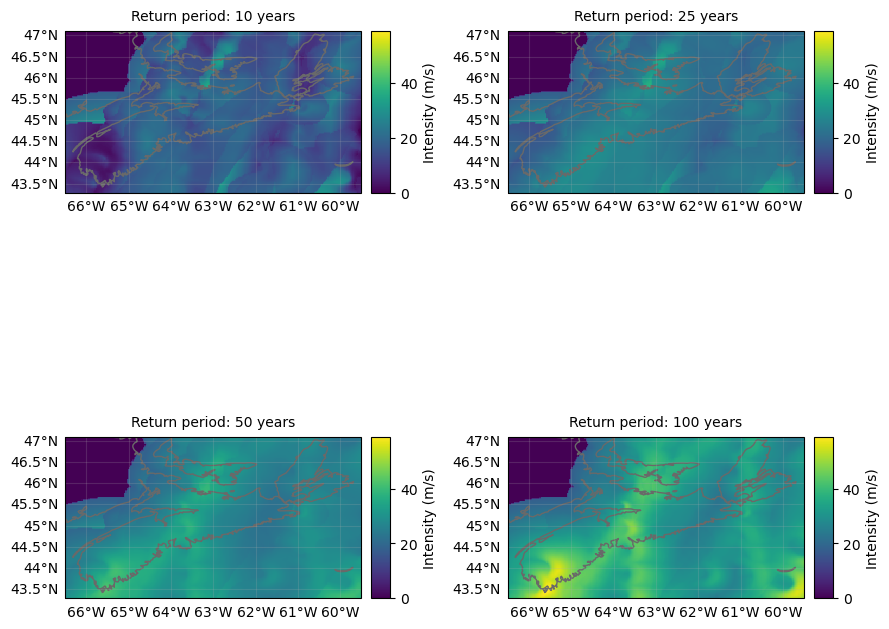

In [20]:
tc_ns.plot_rp_intensity(return_periods = [10, 25, 50, 100])

(array([[<GeoAxesSubplot:title={'center':'Return period: 10 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 25 years'}>],
        [<GeoAxesSubplot:title={'center':'Return period: 50 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 100 years'}>]],
       dtype=object),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]))

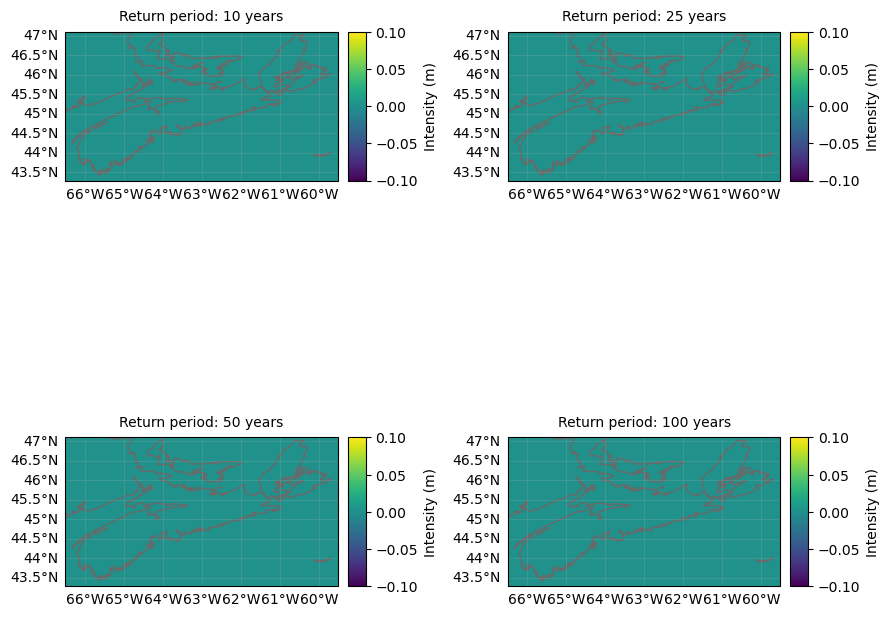

In [23]:
ts_ns.plot_rp_intensity(return_periods = [10, 25, 50, 100])

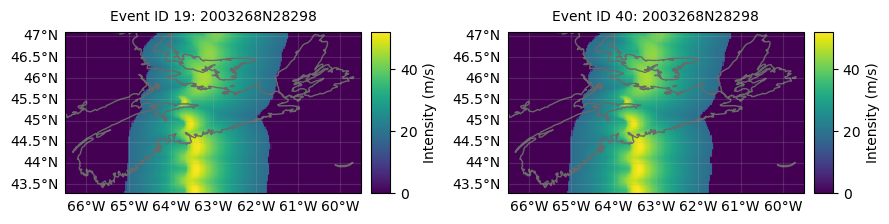

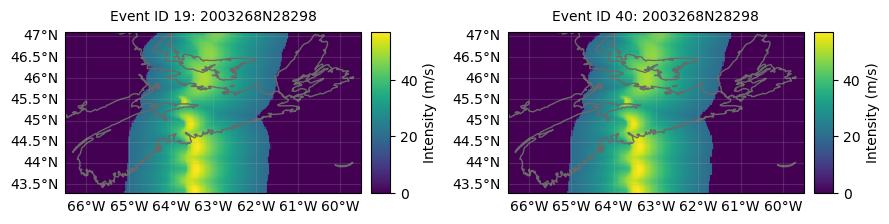

In [39]:
#Implementing Climate Change Cyclone

# an event-like in 2055 under RCP 4.5:
tc_usa = TropCyclone.from_tracks(tr_usa, centroids=cent_ns)
HAZ_tc_cc45 = tc_usa.apply_climate_scenario_knu(ref_year=2055, rcp_scenario=45)
HAZ_tc_cc45.plot_intensity('2003268N28298');

# an event-like in 2055 under RCP 8.5:
tc_usa = TropCyclone.from_tracks(tr_usa, centroids=cent_ns)
HAZ_tc_cc85 = tc_usa.apply_climate_scenario_knu(ref_year=2100, rcp_scenario=85)
HAZ_tc_cc85.plot_intensity('2003268N28298');


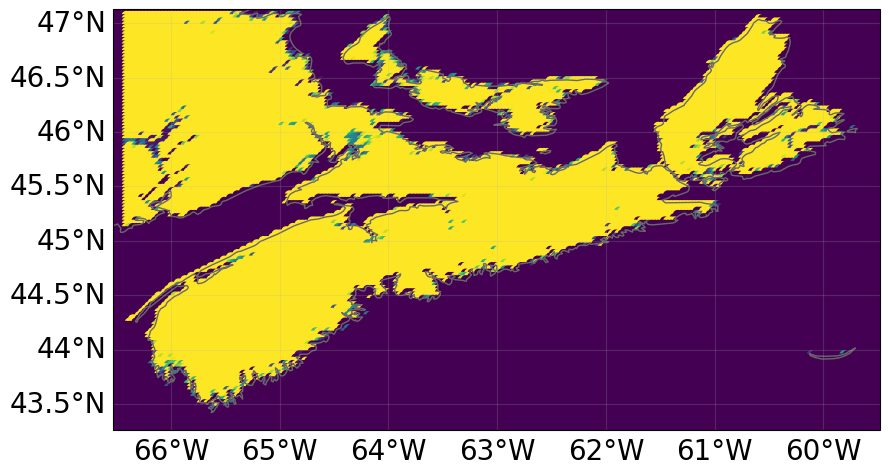

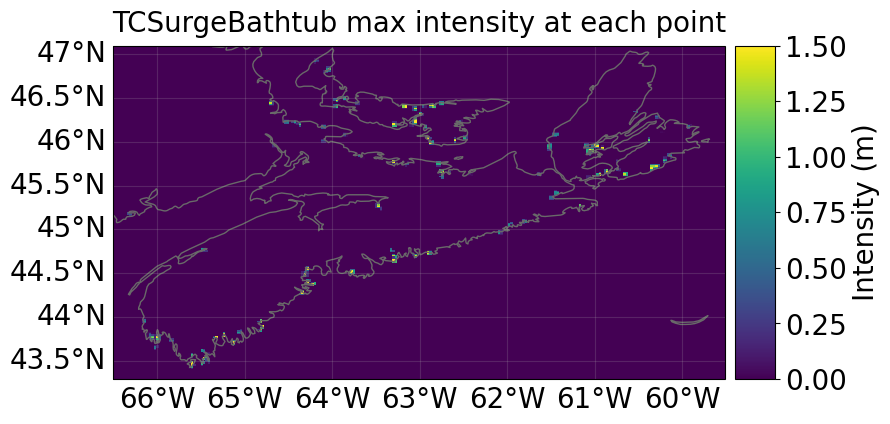

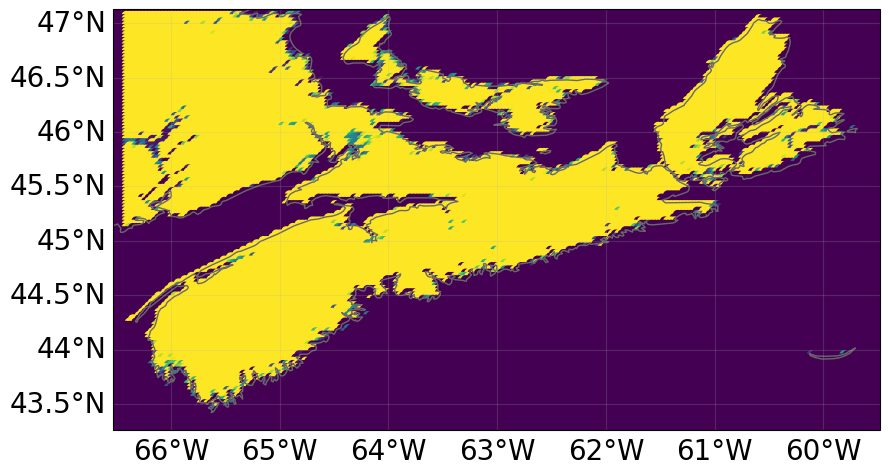

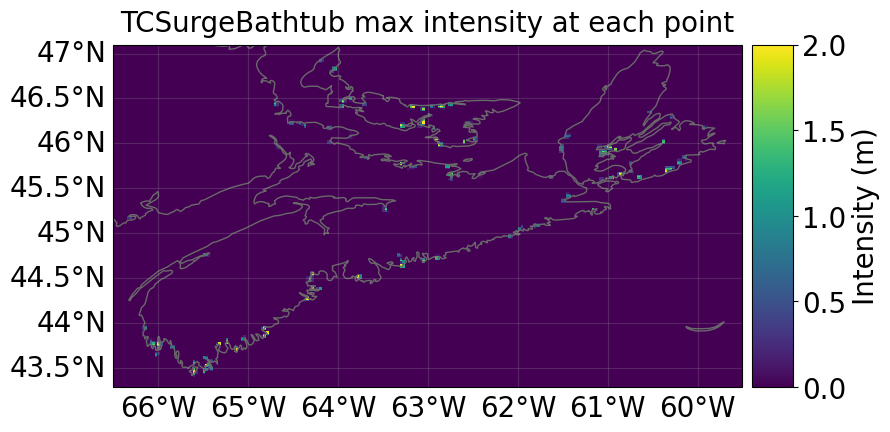

In [27]:
#Implementing Climate Change Surge

norm = colors.LogNorm(vmin=0.5, vmax=50)

# an event-like in 2055 under RCP 4.5:
HAZ_ts_cc45 = TCSurgeBathtub.from_tc_winds(HAZ_tc_cc45, topo_path, inland_decay_rate=0.2, add_sea_level_rise=0.2)
# plot elevation of the raster
HAZ_ts_cc45.centroids.set_elevation(topo_path)
HAZ_ts_cc45.centroids.plot(c=ts_ns.centroids.elevation, vmin=1, vmax=10)
HAZ_ts_cc45.plot_intensity(event=0, vmax=1.5);

# an event-like in 2100 under RCP 8.5:
HAZ_ts_cc85 = TCSurgeBathtub.from_tc_winds(HAZ_tc_cc85, topo_path, inland_decay_rate=0.3, add_sea_level_rise=0.3)
# plot elevation of the raster
HAZ_ts_cc85.centroids.set_elevation(topo_path)
HAZ_ts_cc85.centroids.plot(c=ts_ns.centroids.elevation, vmin=1, vmax=10)
HAZ_ts_cc85.plot_intensity(event=0, vmax=2.0);


In [40]:
#Create Impact Function
#Wind Impact Function

import numpy as np
from matplotlib import colors
from Configuration import *
import os

from climada.entity import IFTropCyclone, ImpactFuncSet, ImpactFunc

In [41]:
# Impact function wind-houses

IFs_TC_houses = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0.05, 0.20, 0.45, 0.65, 0.78])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_houses.append(if_tc)


# Impact function wind-people

IFs_TC_people = ImpactFuncSet()

if_tc_people = IFTropCyclone()
if_tc_people.haz_type = 'TC'
if_tc_people.id = 1
if_tc_people.intensity_unit = 'm/s'

if_tc_people.intensity = np.arange(0, 100, 0.5)
if_tc_people.paa = np.ones(if_tc_people.intensity.size)
if_tc_people.mdd = np.zeros(if_tc_people.intensity.size)
for idx in range(if_tc_people.mdd.size):
    if if_tc_people.intensity[idx] >= storm_threshold:
        if_tc_people.mdd[idx] = 1

if_tc_people.check()

IFs_TC_people.append(if_tc_people)

In [186]:
# Impact function surge-road

IFs_TC_road = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TS'
if_tc.id = 1
if_tc.intensity_unit = 'm'
if_tc.intensity = np.array([0, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 5.25, 5.5, 5.75, 6])
if_tc.mdd = np.array([0, 0.02, 0.08, 0.1, 0.13, 0.15, 0.2, 0.3, 0.55, 0.63, 0.75, 0.8, 0.88, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
if_tc.paa = np.ones(25)
if_tc.check()

IFs_TC_road.append(if_tc)

In [190]:
# Impact function surge-MV line

IFs_TC_voltage = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TS'
if_tc.id = 1
if_tc.intensity_unit = 'm'
if_tc.intensity = np.array([0, 1, 2, 3, 4, 5, 6])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0, 0])
if_tc.paa = np.ones(7)
if_tc.check()

IFs_TC_voltage.append(if_tc)

In [200]:
# Impact function wind-MV line

IFs_TC_voltage2 = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0.35, 0.7, 1, 1])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_voltage2.append(if_tc)

In [202]:
# Impact function wind-road

IFs_TC_roadwind = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_roadwind.append(if_tc)

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

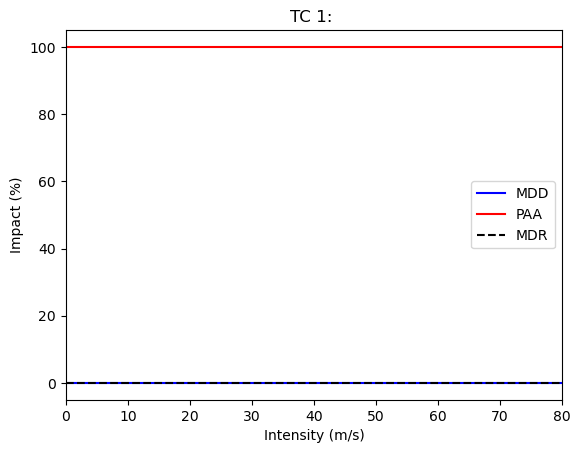

In [203]:
IFs_TC_roadwind.plot()

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

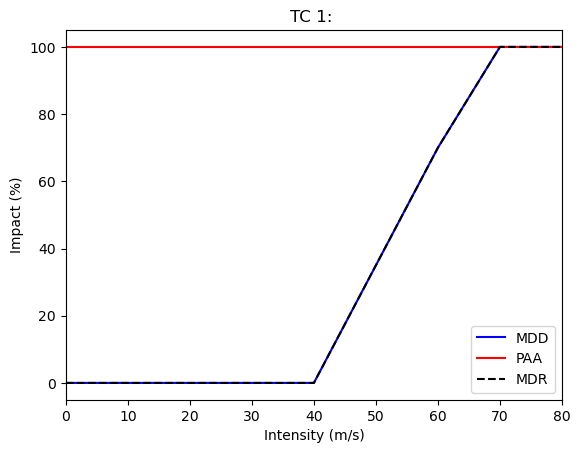

In [201]:
IFs_TC_voltage2.plot()

<AxesSubplot:title={'center':'TS 1: '}, xlabel='Intensity (m)', ylabel='Impact (%)'>

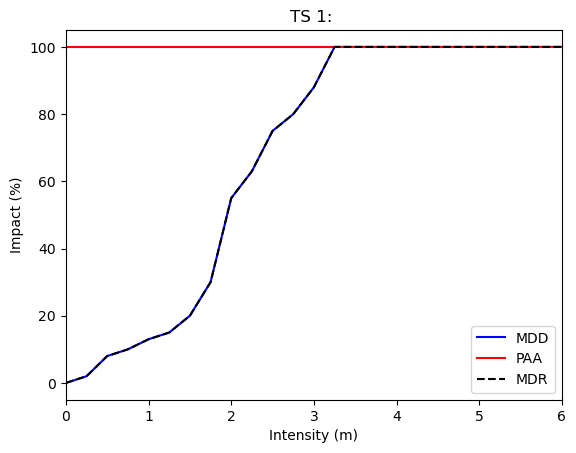

In [187]:
IFs_TC_road.plot()

<AxesSubplot:title={'center':'TS 1: '}, xlabel='Intensity (m)', ylabel='Impact (%)'>

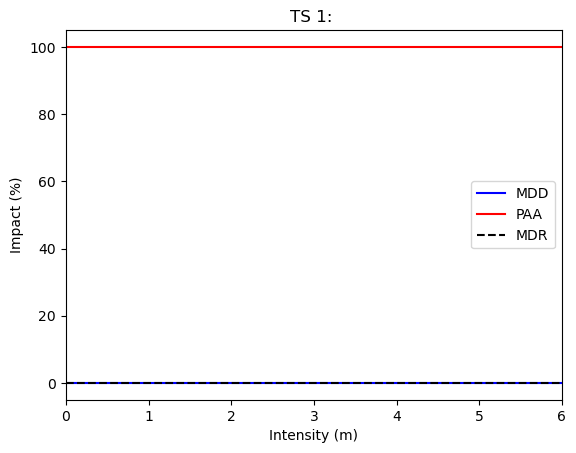

In [191]:
IFs_TC_voltage.plot()

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

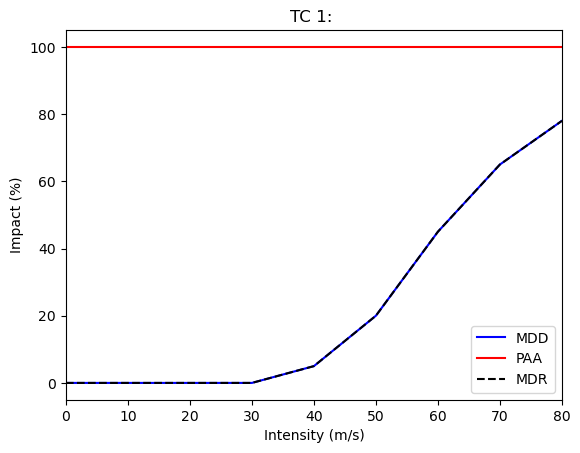

In [42]:
IFs_TC_houses.plot()

<AxesSubplot:title={'center':'TC 1: Emanuel 2011'}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

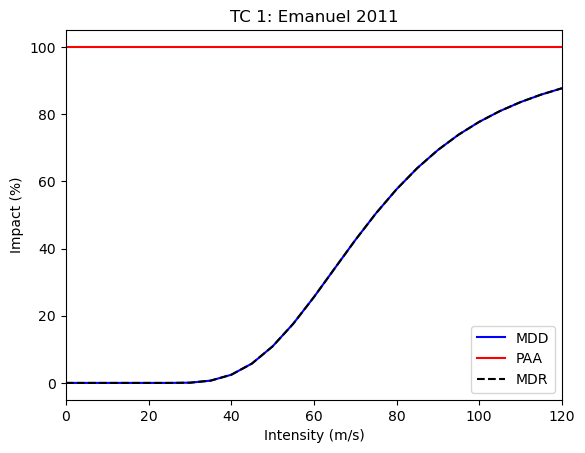

In [31]:
#calibrated impact functions from Emanuel (2011)
# Impact function wind-houses

from climada.entity import ImpactFuncSet, ImpfTropCyclone
# impact function TC
impf_tc = ImpfTropCyclone.from_emanuel_usa()

# add the impact function to an Impact function set
IFs_TC_houses_2 = ImpactFuncSet()
IFs_TC_houses_2.append(impf_tc)
IFs_TC_houses_2.check()

IFs_TC_houses_2.plot()

In [32]:
#check Impact function wind-houses
# Get the hazard type and hazard id
[haz_type] = IFs_TC_houses_2.get_hazard_types()
[haz_id] = IFs_TC_houses_2.get_ids()[haz_type]
print(f"hazard type: {haz_type}, hazard id: {haz_id}")

hazard type: TC, hazard id: 1


In [33]:
# Exposures: rename column and assign id
exp_house.gdf.rename(columns={"impf_": "impf_" + haz_type}, inplace=True)
exp_house.gdf['impf_' + haz_type] = haz_id
exp_house.check()
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_TC
1485,24.316869,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,24.316867,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,24.316867,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,24.316867,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,24.320664,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


In [34]:
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_TC
1485,24.316869,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,24.316867,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,24.316867,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,24.316867,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,24.320664,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

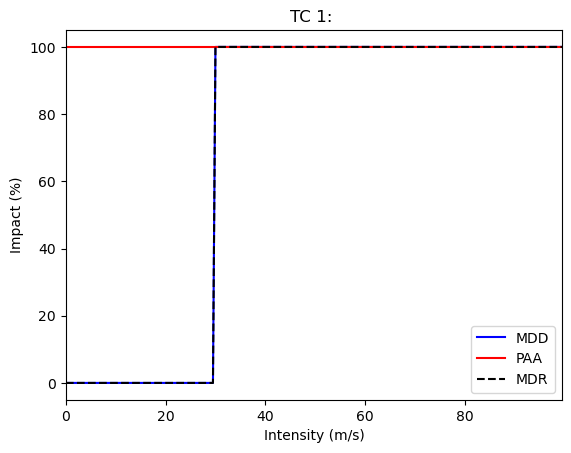

In [43]:
IFs_TC_people.plot()

In [3]:
#Surge Impact Function
import numpy as np
from matplotlib import colors
from Configuration import *
import os

from climada.entity import IFTropCyclone, ImpactFuncSet, ImpactFunc
from climada.entity import ImpactFuncSet, ImpfTropCyclone

# Impact function surge-houses
IFs_TS_houses = ImpactFuncSet()

if_ts = ImpactFunc()
if_ts.id = 2
if_ts.haz_type = 'TS'
if_ts.intensity_unit = 'm'
if_ts.intensity = np.array([0, 0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0, 6.0])
if_ts.mdd = np.array([0, 0.33, 0.49, 0.62, 0.72, 0.87, 0.93, 0.98, 1.0])
if_ts.paa = np.ones(9)
if_ts.check()

IFs_TS_houses.append(if_ts)

## Impact function surge-people

IFs_TS_people = ImpactFuncSet()

if_ts_people = ImpactFunc()
if_ts_people.haz_type = 'TS'
if_ts_people.id = 2
if_ts_people.intensity_unit = 'm'

if_ts_people.intensity = np.arange(0, 10, 0.05)
if_ts_people.paa = np.ones(if_ts_people.intensity.size)
if_ts_people.mdd = np.zeros(if_ts_people.intensity.size)
for idx in range(if_ts_people.mdd.size):
    if if_ts_people.intensity[idx] >= surge_threshold:
        if_ts_people.mdd[idx] = 1

if_ts_people.check()

IFs_TS_people.append(if_ts_people)

In [30]:
if_ts.check()

In [61]:
# Get the hazard type and hazard id
[haz_type] = IFs_TS_houses.get_hazard_types()
[haz_id] = IFs_TS_houses.get_ids()[haz_type]
print(f"hazard type: {haz_type}, hazard id: {haz_id}")

hazard type: TS, hazard id: 2


In [62]:
# Exposures: rename column and assign id
exp_house.gdf.rename(columns={"impf_": "impf_"}, inplace=True)
exp_house.gdf['impf_'] = haz_id
exp_house.check()
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_,centr_TCSurgeBathtub
1485,22.595200,POINT (-60.60417 47.02917),47.029167,-60.604167,124,2,665
1486,22.595199,POINT (-60.59583 47.02917),47.029167,-60.595833,124,2,665
1487,22.595199,POINT (-60.58750 47.02917),47.029167,-60.587500,124,2,665
1488,22.595199,POINT (-60.57917 47.02917),47.029167,-60.579167,124,2,665
2282,22.598727,POINT (-60.61250 47.02083),47.020833,-60.612500,124,2,898


In [63]:
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_,centr_TCSurgeBathtub
1485,22.595200,POINT (-60.60417 47.02917),47.029167,-60.604167,124,2,665
1486,22.595199,POINT (-60.59583 47.02917),47.029167,-60.595833,124,2,665
1487,22.595199,POINT (-60.58750 47.02917),47.029167,-60.587500,124,2,665
1488,22.595199,POINT (-60.57917 47.02917),47.029167,-60.579167,124,2,665
2282,22.598727,POINT (-60.61250 47.02083),47.020833,-60.612500,124,2,898


In [44]:
##Calculate Impact

from climada.engine import Impact

In [33]:
# Surge-houses
IMP_houses_TS = Impact()
IMP_houses_TS.calc(exp_house, IFs_TS_houses, ts_ns, save_mat=False)


2023-07-07 12:56:49,712 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.


AttributeError: 'list' object has no attribute 'calc_mdr'

In [45]:
# Wind-houses
IMP_houses_TC = Impact()
IMP_houses_TC.calc(exp_house, IFs_TC_houses, tc_ns)

IMP_houses_TC_45 = Impact()
IMP_houses_TC_45.calc(exp_house, IFs_TC_houses, HAZ_tc_cc45)

IMP_houses_TC_85 = Impact()
IMP_houses_TC_85.calc(exp_house, IFs_TC_houses, HAZ_tc_cc85)

2023-08-11 20:59:01,299 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-08-11 20:59:01,499 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-08-11 20:59:01,589 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.


Expected average annual impact (houses TC): 7.441e+06 USD
Damage with 100-year return period: 3.870e+08 USD


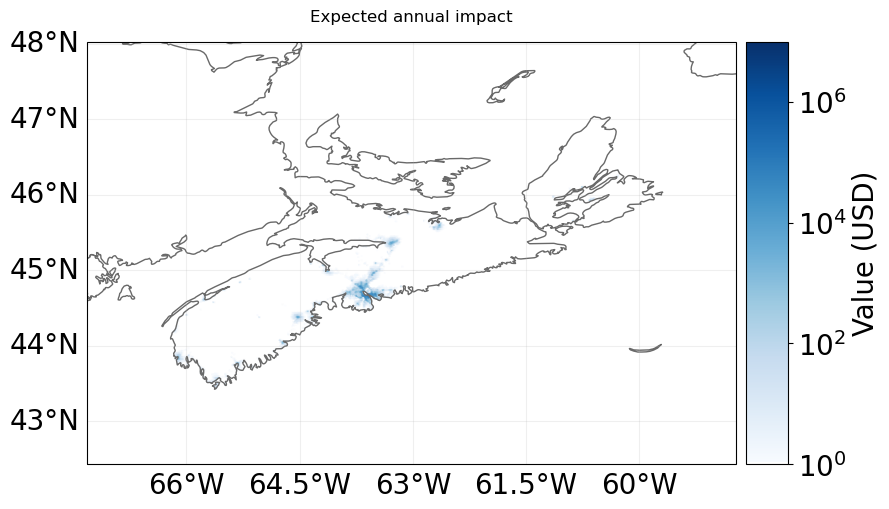

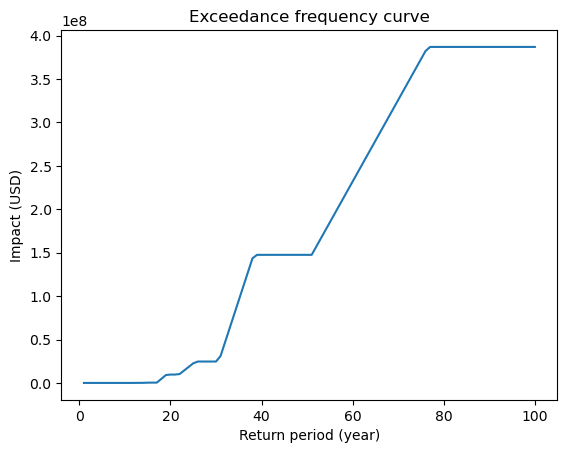

In [39]:
#Impact Map and Return Period Graph
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
IMP_houses_TC.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC = IMP_houses_TC.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(IMP_houses_TC.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(IMP_houses_TC.calc_freq_curve(100).impact))

In [148]:
IMP_houses_TC.write_excel('results/impt_house_TC.xlsx')

In [41]:
# Compute impact Emanuela
from climada.engine import Impact
imp2 = Impact()
imp2.calc(exp_house, IFs_TC_houses_2, tc_ns, save_mat=False) #Do not save the results geographically resolved (only aggregate values)

2023-08-06 23:50:56,245 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.


In [42]:
exp_house.gdf

,value,geometry,latitude,longitude,region_id,impf_TC,centr_TC
1485,24.316869,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1,665
1486,24.316867,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1,665
1487,24.316867,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1,665
1488,24.316867,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1,665
2282,24.320664,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1,898
...,...,...,...,...,...,...,...
344821,6298.594283,POINT (-65.62083 43.43750),43.437500,-65.620833,124,1,28577
344822,2757.021778,POINT (-65.61250 43.43750),43.437500,-65.612500,124,1,28578
344823,2811.651494,POINT (-65.60417 43.43750),43.437500,-65.604167,124,1,28578
345619,2478.379080,POINT (-65.62083 43.42917),43.429167,-65.620833,124,1,28577


In [43]:
print(f"Aggregated average annual impact: {round(imp2.aai_agg,0)} $")

Aggregated average annual impact: 3283908.0 $


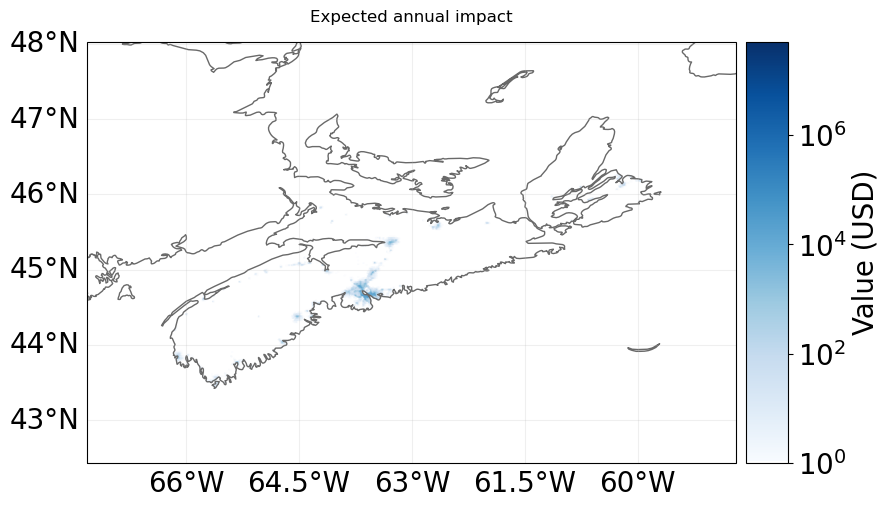

In [44]:
norm = colors.LogNorm(vmin=1, vmax=5.0e7)
imp2.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=False, adapt_fontsize=True);

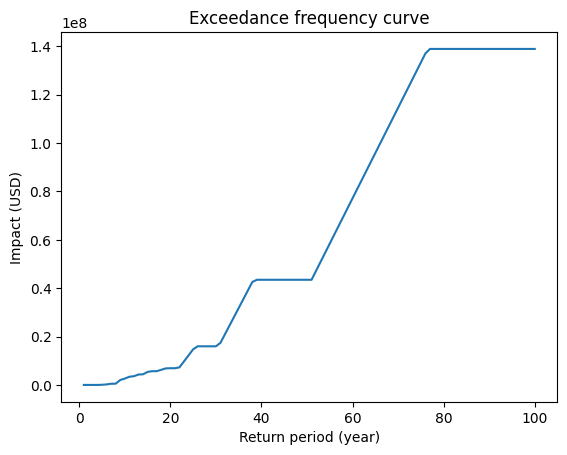

In [36]:
# Compute exceedance frequency curve
freq_curve = imp2.calc_freq_curve(np.linspace(1, 100, 100))
freq_curve.plot();

Expected average annual impact (houses TC): 1.896e+07 USD
Damage with 100-year return period: 4.804e+08 USD


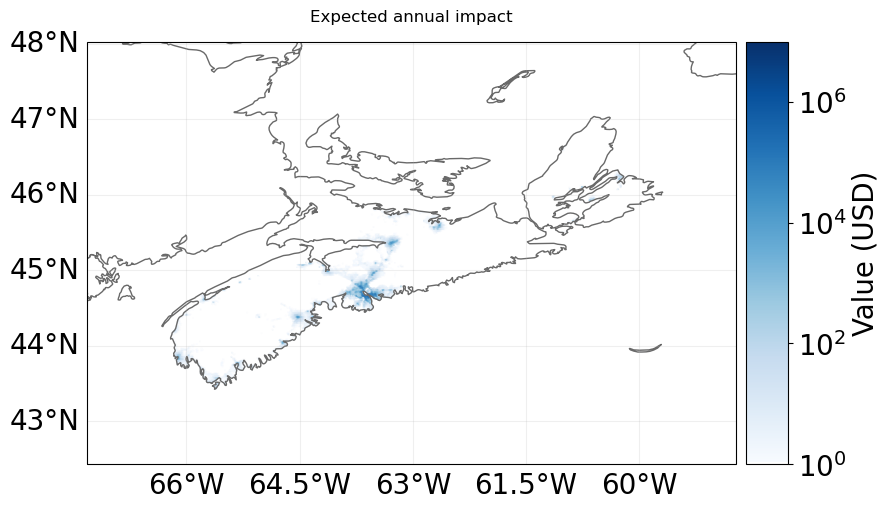

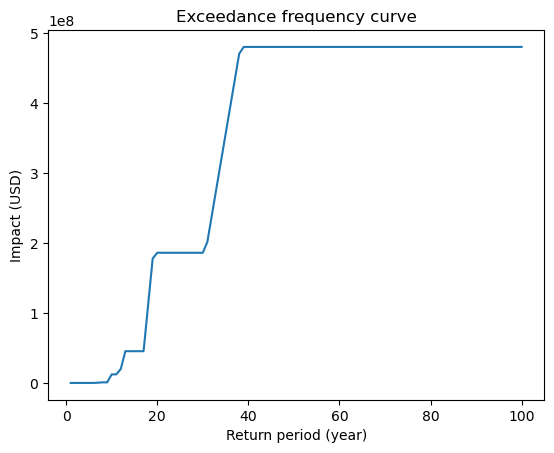

In [36]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
IMP_houses_TC_45.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_45 = IMP_houses_TC_45.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(IMP_houses_TC_45.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(IMP_houses_TC_45.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.567e+07 USD
Damage with 100-year return period: 7.337e+08 USD


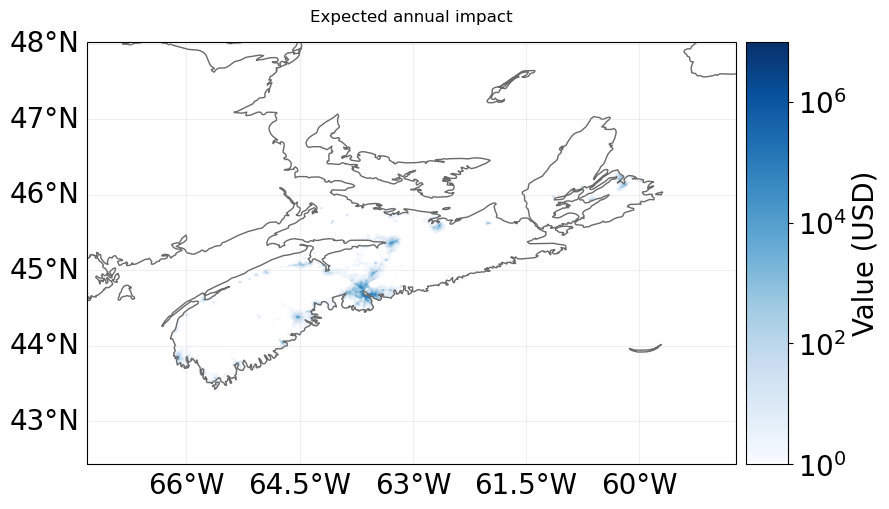

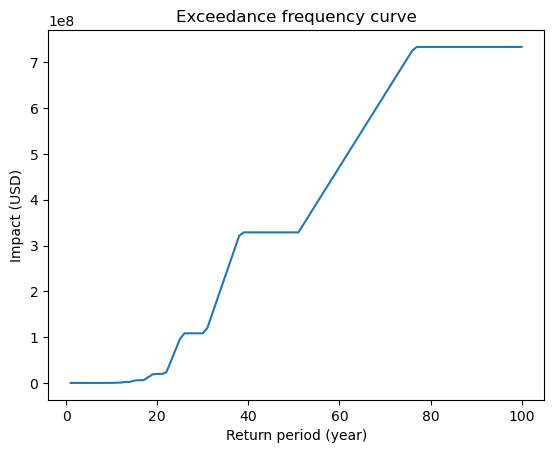

In [45]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
IMP_houses_TC_85.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC_85 = IMP_houses_TC_85.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(IMP_houses_TC_85.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(IMP_houses_TC_85.calc_freq_curve(100).impact))

In [46]:
##Calculate Impact on People

from climada.engine import Impact

In [47]:
## Calculate impact
# Wind-people

IMP_people_TC = Impact()
IMP_people_TC.calc(exp_pop, IFs_TC_people, tc_ns)

IMP_people_TC_45 = Impact()
IMP_people_TC_45.calc(exp_pop, IFs_TC_people, HAZ_tc_cc45)

IMP_people_TC_85 = Impact()
IMP_people_TC_85.calc(exp_pop, IFs_TC_people, HAZ_tc_cc85)

2023-08-06 23:51:34,745 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-08-06 23:51:34,787 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-08-06 23:51:34,829 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.


Expected average annual impact (houses TC): 1.333e+02 people
Damage with 100-year return period: 1.020e+04 people


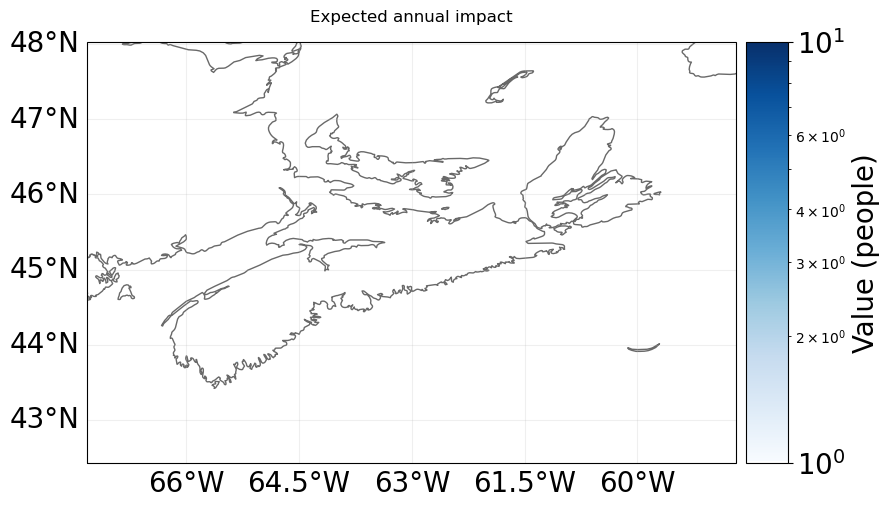

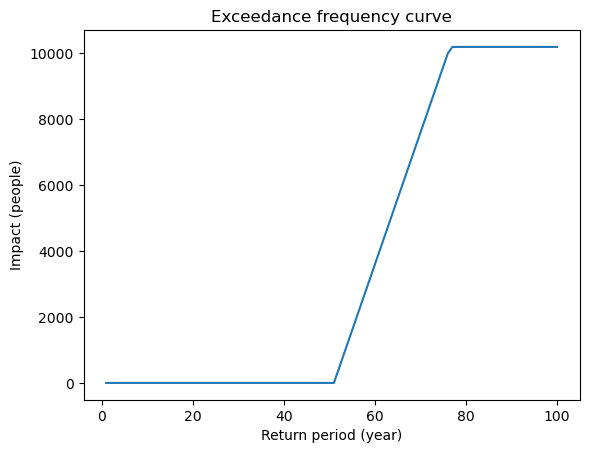

In [49]:
#Impact Map and Return Period Graph
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=10)
IMP_people_TC.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=False, adapt_fontsize=True)
freq_curve_people_TC = IMP_people_TC.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_people_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} people'.format(IMP_people_TC.aai_agg))
print('Damage with 100-year return period: {:.3e} people'.format(IMP_people_TC.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 2.599e+02 people
Damage with 100-year return period: 1.098e+04 people


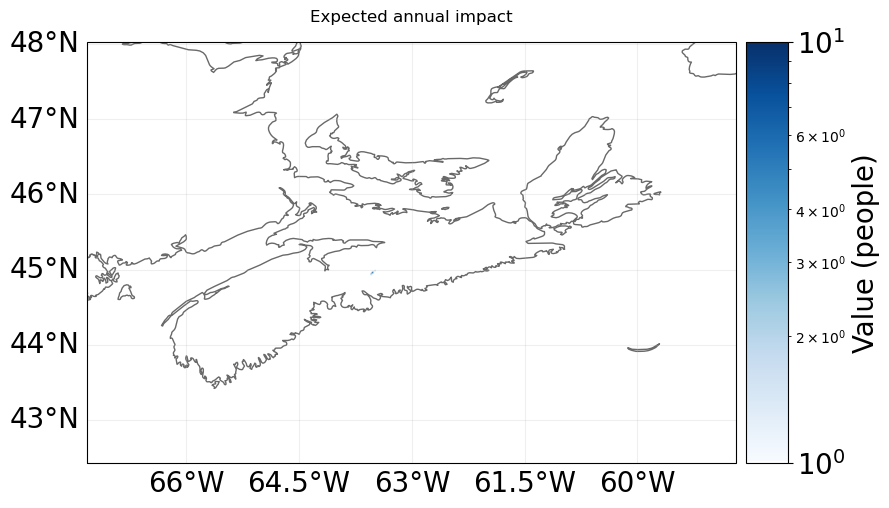

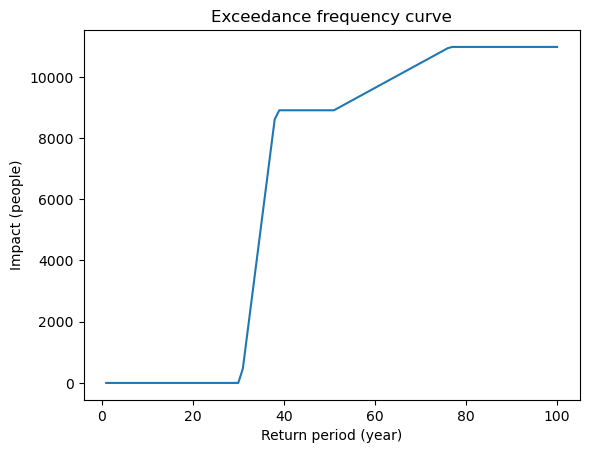

In [50]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=10)
IMP_people_TC_45.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=False, adapt_fontsize=True)
freq_curve_people_TC_45 = IMP_people_TC_45.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_people_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} people'.format(IMP_people_TC_45.aai_agg))
print('Damage with 100-year return period: {:.3e} people'.format(IMP_people_TC_45.calc_freq_curve(100).impact))

In [4]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=10)
IMP_people_TC_85.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=False, adapt_fontsize=False)
freq_curve_people_TC_85 = IMP_people_TC_85.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_people_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} people'.format(IMP_people_TC_85.aai_agg))
print('Damage with 100-year return period: {:.3e} people'.format(IMP_people_TC_85.calc_freq_curve(100).impact))

NameError: name 'IMP_people_TC_85' is not defined

In [37]:
## Define adaptation measures

from climada.entity import Measure
from climada.entity import MeasureSet

In [38]:
# Measures for Wind

TC_meas1 = Measure()
TC_meas1.name = 'Mangrove'
TC_meas1.haz_type = 'TC'
TC_meas1.color_rgb = np.array([0.16, 0.62, 0.56])
mangrove_maintain = 3000000
TC_meas1.cost = 150*1000000*0.000043*1160*1000*150/10000 + mangrove_maintain * 30
TC_meas1.mdd_impact = (1, 0)
TC_meas1.paa_impact = (1, 0)
TC_meas1.hazard_inten_imp = (1, -6) # reduces intensity by 5


TC_meas_set = MeasureSet()
TC_meas_set.append(TC_meas1)
TC_meas_set.check()

In [39]:
# Predict future risks, considering economic growth

from climada.entity import Entity
from climada.entity import DiscRates
import copy

In [40]:
# Construct discount rates

# discount rate for future values
disc = DiscRates()
disc.years = np.arange(2000, 2100)
disc.rates = np.ones(disc.years.size) * disc_rate

# number of people does not discount
people_disc = DiscRates()
people_disc.years = np.arange(2000, 2100)
people_disc.rates = np.zeros(people_disc.years.size)

In [41]:
# Current houses entity

future_year = 2050


ENT_houses = Entity()

ENT_houses.exposures = exp_house

ENT_houses.impact_funcs = IFs_TC_houses # When analysing surge, change IFs_TC_houses to IFs_TS_houses or other variable names defined for impact function set

ENT_houses.measures = TC_meas_set # When analysing surge, change IFs_TC_houses to IFs_TS_houses or other variable names defined for impact function set

ENT_houses.disc_rates = disc

ENT_houses.check()

# Future houses entity

EXP_houses_future = copy.deepcopy(exp_house)

EXP_houses_future.ref_year = future_year # houses_asset_growth is parameter defined in Configuration.py

n_years = EXP_houses_future.ref_year - exp_house.ref_year + 1

growth_rate = 1.05

growth = growth_rate ** n_years

EXP_houses_future.gdf['value'] = EXP_houses_future.gdf['value'] * growth 


ENT_houses_future = copy.deepcopy(ENT_houses)

ENT_houses_future.exposures = EXP_houses_future

ENT_houses_future.exposures.ref_year = horizon

ENT_houses_future.check()

In [42]:
# Current people entity

future_year = 2050


ENT_people = Entity()

ENT_people.exposures = exp_pop

ENT_people.impact_funcs = IFs_TC_people

ENT_people.measures = TC_meas_set

ENT_people.disc_rates = people_disc

ENT_people.check()

# Future people entity

EXP_people_future = copy.deepcopy(exp_pop)

EXP_people_future.ref_year = future_year # houses_asset_growth is parameter defined in Configuration.py

n_years_pop = EXP_people_future.ref_year - exp_pop.ref_year + 1

growth_rate_pop = 1.013

growth = growth_rate_pop ** n_years_pop

EXP_people_future.gdf['value'] = EXP_people_future.gdf['value'] * growth 



#EXP_people_future ['value'] *= population_growth


ENT_people_future = copy.deepcopy(ENT_people)

ENT_people_future.exposures = EXP_people_future

ENT_people_future.exposures.ref_year = horizon

ENT_people_future.check()


In [43]:
## Calculating cost-benefit of adaptation measures, given Climate Change (RCP 8.5) and Economic Growth, taking TC-houses as an example

from climada.engine import CostBenefit

In [44]:
# Wind-houses

cost_ben_houses_TC = CostBenefit()

cost_ben_houses_TC.calc(tc_ns, ENT_houses, HAZ_tc_cc85, ENT_houses_future, future_year=horizon)


Measure      Cost (USD m)    Benefit (USD m)    Benefit/Cost
---------  --------------  -----------------  --------------
Mangrove           202.23             283.47         1.40172

--------------------  --------  -------
Total climate risk:   456.372   (USD m)
Average annual risk:   73.3448  (USD m)
Residual risk:        172.902   (USD m)
--------------------  --------  -------
Net Present Values


<AxesSubplot:title={'center':'Total accumulated impact from 2022 to 2050'}, ylabel='Impact (USD m)'>

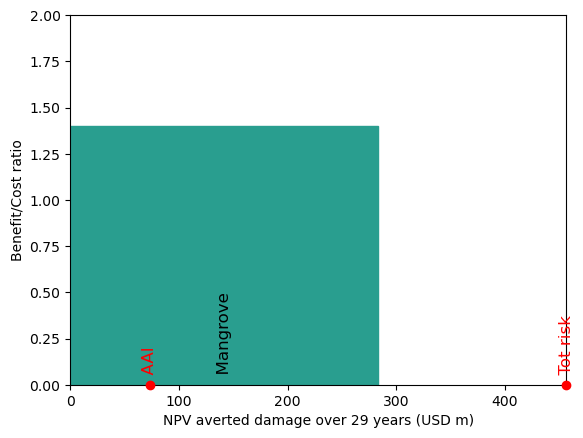

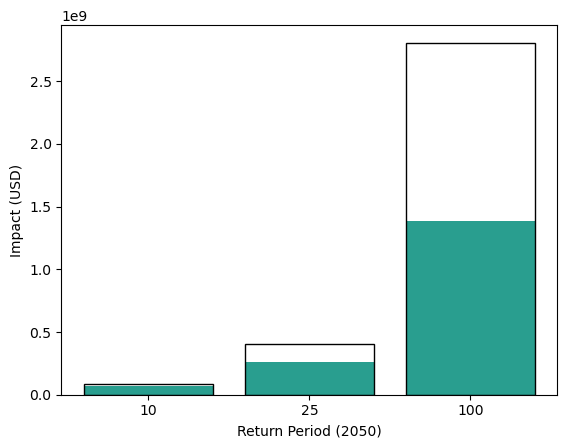

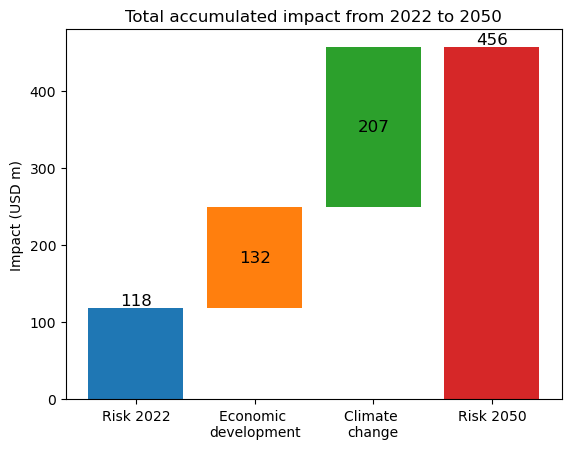

In [45]:
## Plot cost-benefit of adaptation measures

cost_ben_houses_TC.plot_cost_benefit()

cost_ben_houses_TC.plot_event_view()

cost_ben_houses_TC.plot_waterfall_accumulated(tc_ns, ENT_houses, ENT_houses_future)

2023-02-19 11:06:31,924 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-02-19 11:06:31,999 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.


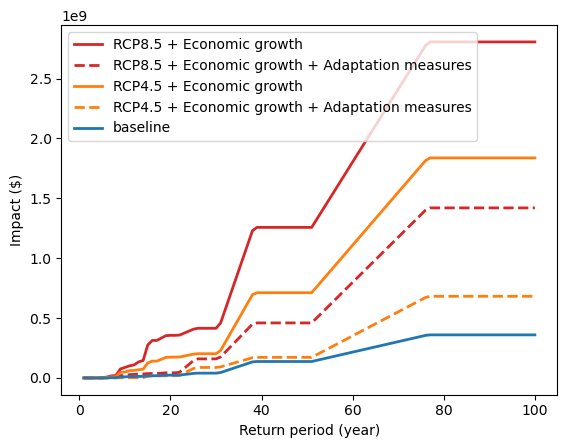

In [46]:
## Illustrate the damage reduction effect of adaptation measures under different climate scenarios (considering economic growth)

TC_meas_comb = Measure()
TC_meas_comb.name = 'Combined'
TC_meas_comb.haz_type = 'TC'
TC_meas_comb.color_rgb = np.array([1, 1, 1])
TC_meas_comb.cost = 1 # Cost is not relevant in the calculation but needed to define a measure. Therefore a random value is assigned.
TC_meas_comb.hazard_inten_imp = (1, -6) 
# NOTE: when creating a combined measure for surge adaptation, change -4 to -3.


IMP_houses_TC_eg_85 = Impact() # eg stands for economic growth
IMP_houses_TC_eg_85.calc(EXP_houses_future, IFs_TC_houses, HAZ_tc_cc85)
freq_curve_house_tc_500_eg_85 = IMP_houses_TC_eg_85.calc_freq_curve(np.linspace(1, 100, 100))
tc_imp_500_eg_85 = freq_curve_house_tc_500_eg_85.impact

IMP_houses_TC_eg_45 = Impact()
IMP_houses_TC_eg_45.calc(EXP_houses_future, IFs_TC_houses, HAZ_tc_cc45)
freq_curve_house_tc_500_eg_45 = IMP_houses_TC_eg_45.calc_freq_curve(np.linspace(1, 100, 100))
tc_imp_500_eg_45 = freq_curve_house_tc_500_eg_45.impact

IMP_houses_TC_eg_85_meas = TC_meas_comb.calc_impact(EXP_houses_future, IFs_TC_houses, HAZ_tc_cc85) # meas stands for measures
freq_curve_houses_tc_500_eg_85_meas = IMP_houses_TC_eg_85_meas[0].calc_freq_curve(np.linspace(1, 100, 100))
tc_imp_500_eg_85_meas = freq_curve_houses_tc_500_eg_85_meas.impact

IMP_houses_TC_eg_45_meas = TC_meas_comb.calc_impact(EXP_houses_future, IFs_TC_houses, HAZ_tc_cc45)
freq_curve_houses_tc_500_eg_45_meas = IMP_houses_TC_eg_45_meas[0].calc_freq_curve(np.linspace(1, 100, 100))
tc_imp_500_eg_45_meas = freq_curve_houses_tc_500_eg_45_meas.impact

tc_imp_500_eg_0_meas = freq_curve_houses_TC.impact

rp = freq_curve_house_tc_500_eg_85.return_per

plt.plot(rp, tc_imp_500_eg_85, label='RCP8.5 + Economic growth', color='tab:red', linewidth=2.0)
plt.plot(rp, tc_imp_500_eg_85_meas, label='RCP8.5 + Economic growth + Adaptation measures', color='tab:red', linewidth=2.0, linestyle='--')
plt.plot(rp, tc_imp_500_eg_45, label='RCP4.5 + Economic growth', color='tab:orange', linewidth=2.0)
plt.plot(rp, tc_imp_500_eg_45_meas, label='RCP4.5 + Economic growth + Adaptation measures', color='tab:orange', linewidth=2.0, linestyle='--')
plt.plot(rp, tc_imp_500_eg_0_meas, label='baseline', color='tab:blue', linewidth=2.0)

plt.legend()
# plt.yscale('log')
plt.xlabel('Return period (year)')
plt.ylabel('Impact ($)')
plt.title('')
fig = plt.gcf()

In [171]:
import warnings
warnings.filterwarnings('ignore') #Ignore warnings for making the tutorial's pdf.

#Define the base exposure
from climada.util.constants import EXP_DEMO_H5
from climada.entity import Exposures
exp_base = exp_house

In [172]:
# Define the function that returns an exposure with scaled total assed value
# Here x_exp is the input uncertainty parameter and exp_func the inputvar.func.
def exp_func(x_exp, exp_base=exp_base):
    exp = exp_base.copy()
    exp.gdf.value *= x_exp
    return exp

In [173]:
# Define the Uncertainty Variable with +-10% total asset value
# The probability density distribution of the input uncertainty parameter x_exp is sp.stats.uniform(0.9, 0.2)
from climada.engine.unsequa import InputVar
import scipy as sp

exp_distr = {"x_exp": sp.stats.uniform(0.9, 0.2),
              }
exp_iv = InputVar(exp_func, exp_distr)

In [174]:
# Uncertainty parameters
exp_iv.labels

['x_exp']

In [175]:
# Evaluate for a given value of the uncertainty parameters
exp095 = exp_iv.func(x_exp = 0.95)
print(f"Base value is {exp_base.gdf['value'].sum()}, and the value for x_exp=0.95 is {exp095.gdf['value'].sum()}")

Base value is 5183533166.697364, and the value for x_exp=0.95 is 4924356508.362495


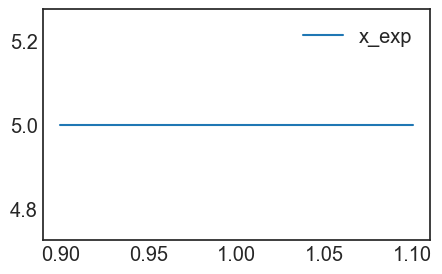

In [178]:
# Defined distribution
exp_iv.plot(figsize=(5, 3));

In [27]:
#Define the input variable functions
import numpy as np

from climada.entity import ImpactFunc, ImpactFuncSet, Exposures
from climada.util.constants import EXP_DEMO_H5, HAZ_DEMO_H5
from climada.hazard import Hazard

def impf_func(G=1, v_half=84.7, vmin=25.7, k=3, _id=1):

    def xhi(v, v_half, vmin):
        return max([(v - vmin), 0]) / (v_half - vmin)

    def sigmoid_func(v, G, v_half, vmin, k):
        return G * xhi(v, v_half, vmin)**k / (1 + xhi(v, v_half, vmin)**k)

    #In-function imports needed only for parallel computing on Windows
    import numpy as np
    from climada.entity import ImpactFunc, ImpactFuncSet
    intensity_unit = 'm/s'
    intensity = np.linspace(0, 150, num=100)
    mdd = np.repeat(1, len(intensity))
    paa = np.array([sigmoid_func(v, G, v_half, vmin, k) for v in intensity])
    imp_fun = ImpactFunc("TC", _id, intensity, mdd, paa, intensity_unit)
    imp_fun.check()
    impf_set = ImpactFuncSet([imp_fun])
    return impf_set

haz = tc_ns
exp_base = exp_house
#It is a good idea to assign the centroids to the base exposures in order to avoid repeating this
# potentially costly operation for each sample.
exp_base.assign_centroids(haz)
def exp_base_func(x_exp, exp_base):
    exp = exp_base.copy()
    exp.gdf.value *= x_exp
    return exp
from functools import partial
exp_func = partial(exp_base_func, exp_base=exp_base)

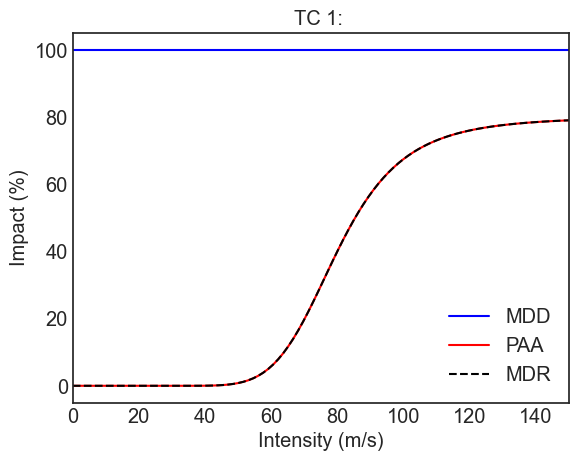

In [195]:
# Visualization of the parametrized impact function
impf_func(G=0.8, v_half=80, vmin=30,k=5).plot();

In [28]:
#Define the InputVars

import scipy as sp
from climada.engine.unsequa import InputVar

exp_distr = {"x_exp": sp.stats.beta(10, 1.1)} #This is not really a reasonable distribution but is used
                                              #here to show that you can use any scipy distribution.

exp_iv = InputVar(exp_func, exp_distr)

impf_distr = {
    "G": sp.stats.truncnorm(0.5, 1.5),
    "v_half": sp.stats.uniform(35, 65),
    "vmin": sp.stats.uniform(0, 15),
    "k": sp.stats.uniform(1, 4)
    }
impf_iv = InputVar(impf_func, impf_distr)

In [29]:
from climada.engine.unsequa import CalcImpact

calc_imp = CalcImpact(exp_iv, impf_iv, haz)

In [198]:
output_imp = calc_imp.make_sample(N=2**7, sampling_kwargs={'skip_values': 2**8})
output_imp.get_samples_df().tail()

,x_exp,G,v_half,vmin,k
1531,0.876684,1.242977,53.662109,2.080078,4.539062
1532,0.876684,0.790617,44.013672,2.080078,4.539062
1533,0.876684,0.790617,53.662109,13.681641,4.539062
1534,0.876684,0.790617,53.662109,2.080078,3.960938
1535,0.876684,0.790617,53.662109,2.080078,4.539062


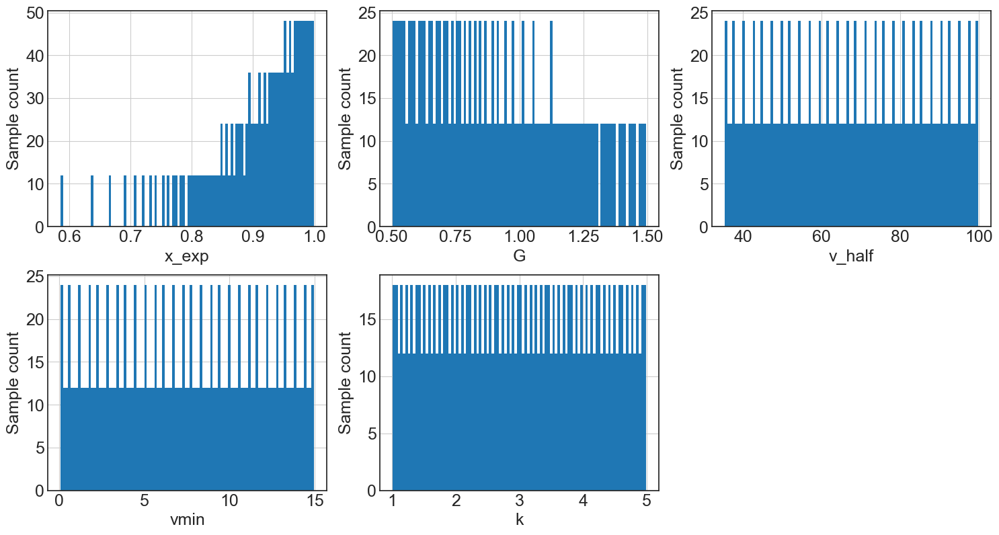

In [199]:
output_imp.plot_sample(figsize=(15,8));

In [200]:
output_imp = calc_imp.uncertainty(output_imp, rp = [50, 100, 250])

In [201]:
output_imp.get_uncertainty().tail()

,aai_agg,rp50,rp100,rp250,tot_value
1531,4.197532e+07,6.470614e+08,1.073786e+09,1.073786e+09,4.544320e+09
1532,5.607142e+07,8.606811e+08,1.242454e+09,1.242454e+09,4.544320e+09
1533,1.345179e+07,2.221423e+08,5.175267e+08,5.175267e+08,4.544320e+09
1534,3.417537e+07,5.010625e+08,7.560953e+08,7.560953e+08,4.544320e+09
1535,2.669914e+07,4.115747e+08,6.830004e+08,6.830004e+08,4.544320e+09


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


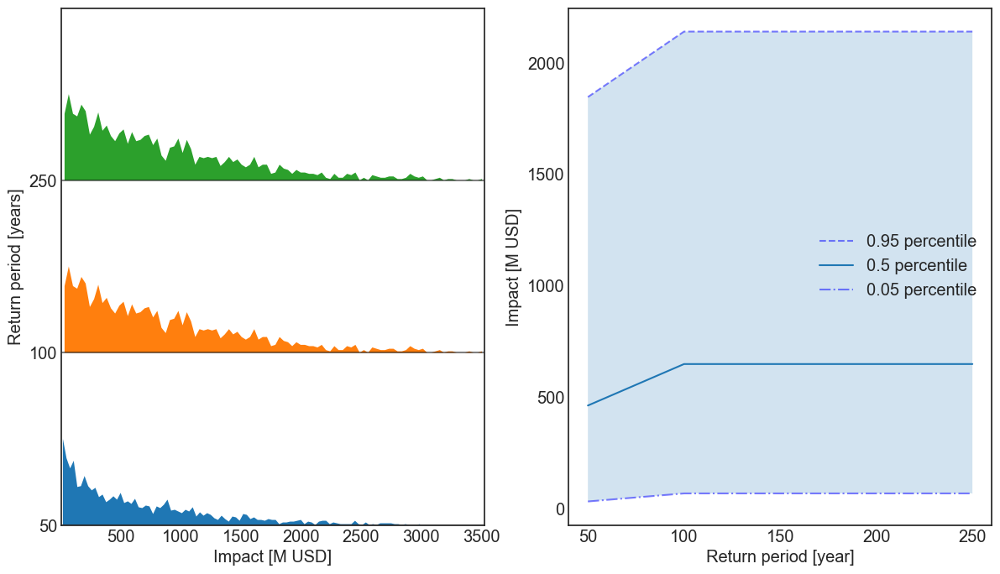

In [202]:
# Specific plot for the return period distributions
output_imp.plot_rp_uncertainty(figsize=(14.3,8));

In [203]:
output_imp = calc_imp.sensitivity(output_imp)

In [204]:
output_imp.sensitivity_metrics

['aai_agg', 'freq_curve', 'tot_value']

In [205]:
output_imp.get_sens_df('aai_agg').tail()

,si,param,param2,aai_agg
65,S2_conf,k,x_exp,NaN
66,S2_conf,k,G,NaN
67,S2_conf,k,v_half,NaN
68,S2_conf,k,vmin,NaN
69,S2_conf,k,k,NaN


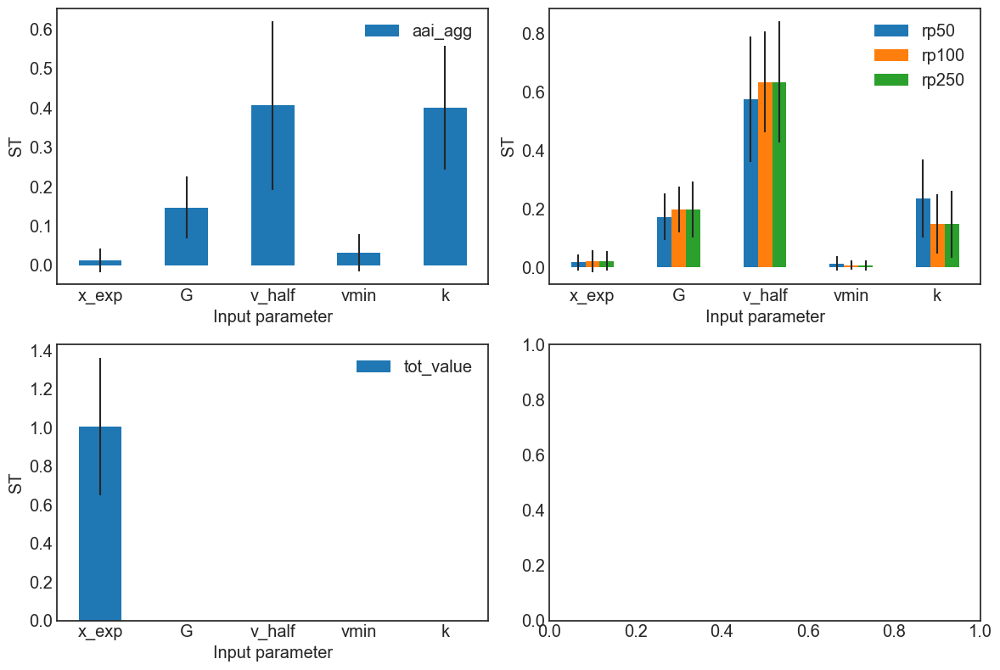

In [206]:
output_imp.plot_sensitivity(salib_si = 'ST', figsize=(12,8));

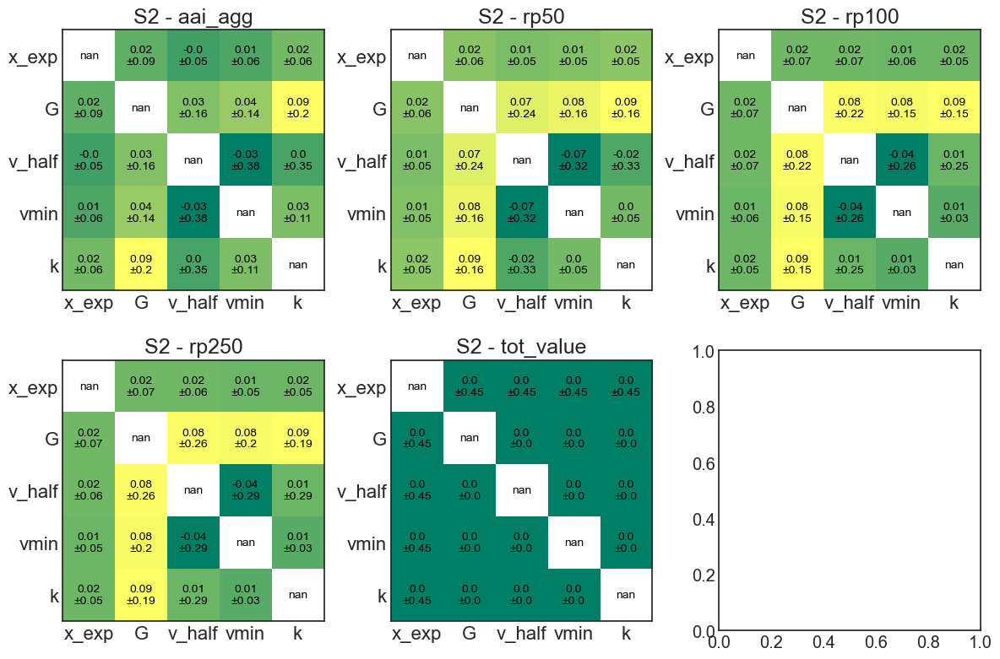

In [207]:
output_imp.plot_sensitivity_second_order(figsize=(12,8));

In [30]:
# Sampling method "latin" hypercube instead of `saltelli`.
from climada.engine.unsequa import CalcImpact

calc_imp2 = CalcImpact(exp_iv, impf_iv, haz)
output_imp2 = calc_imp2.make_sample(N=1000, sampling_method='latin')

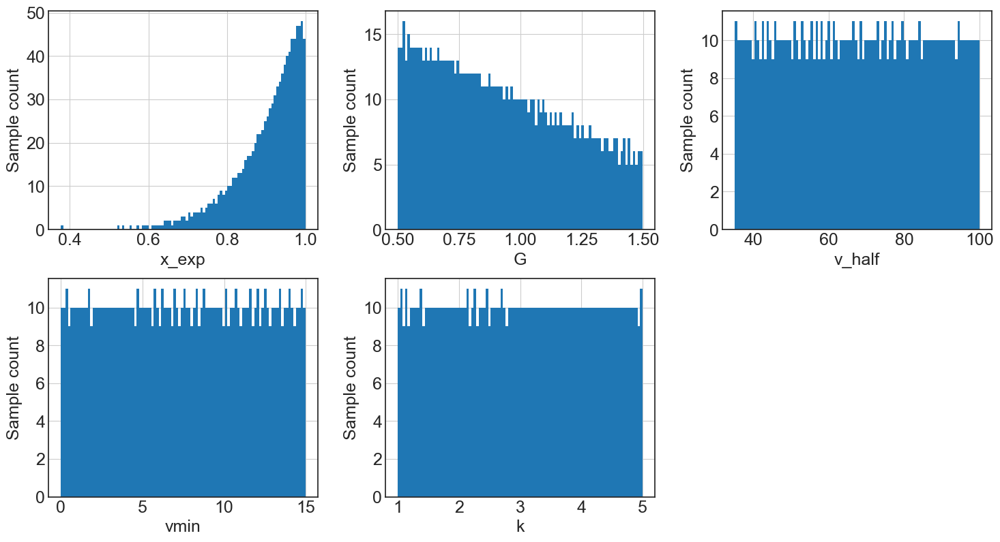

In [31]:
output_imp2.plot_sample(figsize=(15,8));

In [ ]:
# Compute also the distribution of the metric `eai_exp`
# To speed-up the comutations, we use a ProcessPool for parallel computations
from pathos.pools import ProcessPool as Pool
import time

calc_imp2 = CalcImpact(exp_iv, impf_iv, haz)
output_imp2 = calc_imp2.make_sample(N=1000, sampling_method='latin')

start = time.time()
pool = Pool()
output_imp2 = calc_imp2.uncertainty(output_imp2, rp = [50, 100, 250], calc_eai_exp=True, calc_at_event=True, pool=pool)
pool.close() #Do not forget to close your pool!
pool.join()
pool.clear()
end = time.time()
time_passed = end-start
print(f'Time passed with pool: {time_passed}')

In [475]:
# importing datetime class
from datetime import datetime
 
# Creating an instance of datetime.
dateIs = datetime(2099, 1, 1)
 
# Using toordinal() method
toOrdinal = dateIs.toordinal()
print(f"Ordinal value of Earliest Datetime {dateIs} is {toOrdinal}")

Ordinal value of Earliest Datetime 2099-01-01 00:00:00 is 766280


In [619]:
from climada.hazard import Hazard, Centroids

In [655]:
from climada.util import HAZ_TEMPLATE_XLS

In [656]:
# Fill DataFrame from Excel file
file_name = HAZ_TEMPLATE_XLS # provide absolute path of the excel file

In [657]:
# Hazard needs to know the acronym of the hazard type to be constructed!!! Use 'NA' if not known.
haz_tc = Hazard.from_excel(file_name)  # Historic tropical cyclones in Florida from 1990 to 2004
haz_tc.check() # Use always the check() method to see if the hazard has been loaded correctly

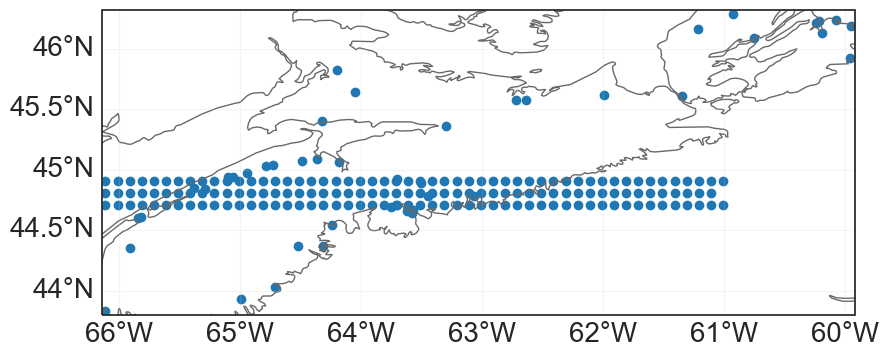

In [658]:
haz_tc.centroids.plot();

In [659]:
#Save hazard File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
haz_tc.write_hdf5(results.joinpath('haz_tc.h5'))

In [660]:
from climada.hazard import Hazard, Centroids
from climada.util import HAZ_DEMO_H5 # CLIMADA's Python file
# Hazard needs to know the acronym of the hazard type to be constructed!!! Use 'NA' if not known.
haz_tc = Hazard.from_hdf5(HAZ_DEMO_H5)  # Historic tropical cyclones in Florida from 1990 to 2004
haz_tc.check() # Use always the check() method to see if the hazard has been loaded correctly

In [661]:
haz_tc = TropCyclone.from_hdf5(HAZ_DEMO_H5)

<GeoAxesSubplot:title={'center':' max intensity at each point'}>

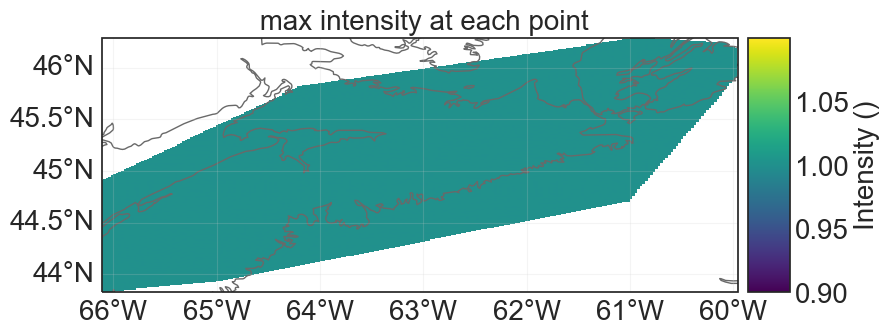

In [662]:
haz_tc.plot_intensity(event=0)

<AxesSubplot:title={'center':'Centroid 50: (44.71, -65.61000000000003)'}, xlabel='Event number', ylabel='Intensity ()'>

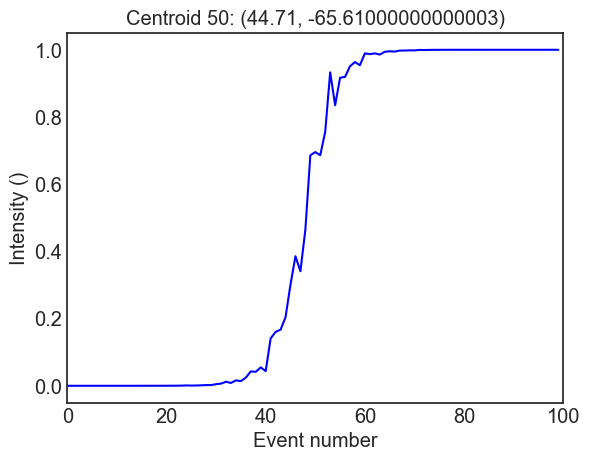

In [663]:
haz_tc.plot_intensity(centr=50)

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity ()', ylabel='Impact (%)'>

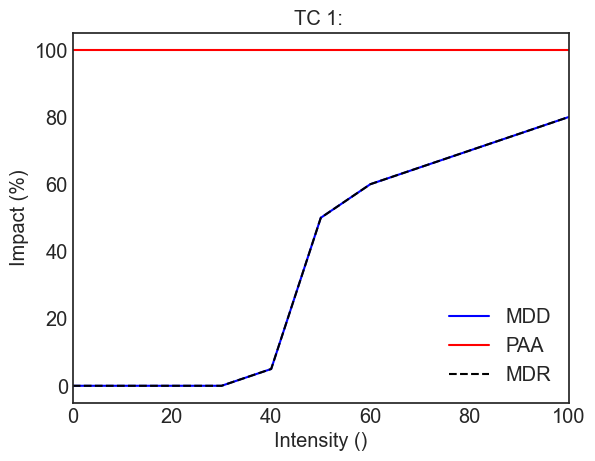

In [741]:
# Impact function wind-houses

IFs_TC_houses2 = ImpactFuncSet()

if_tc2 = IFTropCyclone()
if_tc2.haz_type = 'TC'
if_tc2.id = 1
if_tc2.intensity_unit = ''
if_tc2.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 80, 100])
if_tc2.mdd = np.array([0, 0.0, 0.0, 0.0, 0.05, 0.5, 0.6, 0.7, 0.8])
if_tc2.paa = np.ones(9)
if_tc2.check()

IFs_TC_houses2.append(if_tc2)
IFs_TC_houses2.plot()

In [688]:
#check Impact function wind-houses
# Get the hazard type and hazard id
[haz_type] = IFs_TC_houses2.get_hazard_types()
[haz_id] = IFs_TC_houses2.get_ids()[haz_type]
print(f"hazard type: {haz_type}, hazard id: {haz_id}")

hazard type: TC, hazard id: 1


['British Columbia', 'Alberta', 'Saskatchewan', 'Manitoba', 'Ontario', 'Québec', 'New Brunswick', 'Yukon', 'Nunavut', 'Newfoundland and Labrador', 'Nova Scotia', 'Northwest Territories', 'Prince Edward Island']
Nova Scotia index: 10

 Runtime `from_shape` : 10.98 sec.



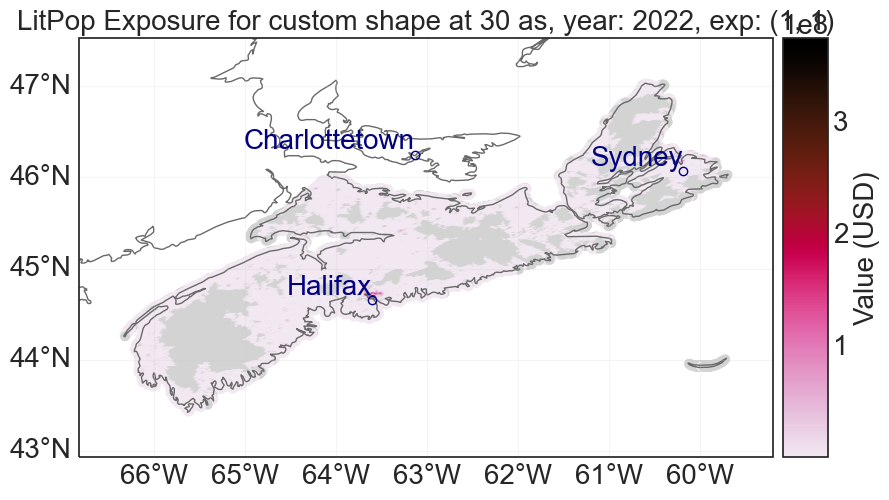

In [689]:
#Construct Exposure
#Houses

import time
import climada.util.coordinates as u_coord
import climada.entity.exposures.litpop as lp

country_iso3a = 'CAN'
state_name = 'Nova Scotia'
reslution_arcsec = 200
"""First, we need to get the shape of Nova Scotia:"""
admin1_info, admin1_shapes = u_coord.get_admin1_info(country_iso3a)
admin1_info = admin1_info[country_iso3a]
admin1_shapes = admin1_shapes[country_iso3a]
admin1_names = [record['name'] for record in admin1_info]
print(admin1_names)
for idx, name in enumerate(admin1_names):
    if admin1_names[idx]==state_name:
        break
print('Nova Scotia index: ' + str(idx))

"""Secondly, we estimate the `total_value`"""
# `total_value` required user input for `from_shape`, here we assume 2.01% of total value of the whole CAN, and 12,97% of total GDP:
total_value2 = 0.0201 * 0.1297 * lp._get_total_value_per_country(country_iso3a, 'income_group', 2022)

"""Then, we can initiate the exposures for Nova Scotia:"""
start = time.process_time()
exp_house2 = LitPop.from_shape(admin1_shapes[idx], total_value2, res_arcsec=30, reference_year=2022)
print(f'\n Runtime `from_shape` : {time.process_time() - start:1.2f} sec.\n')
exp_house2.plot_scatter(vmin=100, buffer=.5);

In [690]:
# Exposures: rename column and assign id
exp_house2.gdf.rename(columns={"impf_": "impf_"}, inplace=True)
exp_house2.gdf['impf_'] = haz_id
exp_house2.check()
exp_house2.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_
1485,112.976002,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,112.975994,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,112.975994,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,112.975994,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,112.993635,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


In [691]:
exp_house2.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_
1485,112.976002,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,112.975994,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,112.975994,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,112.975994,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,112.993635,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


In [692]:
# Wind-houses
IMP_houses_TC2 = Impact()
IMP_houses_TC2.calc(exp_house2, IFs_TC_houses2, haz_tc)

2023-02-21 11:25:38,898 - climada.engine.impact - WARNING - The use of Impact().calc() is deprecated. Use ImpactCalc().impact() instead.
2023-02-21 11:25:38,994 - climada.util.coordinates - WARNING - Distance to closest centroid is greater than 100km for 118 coordinates.


AttributeError: 'list' object has no attribute 'calc_mdr'

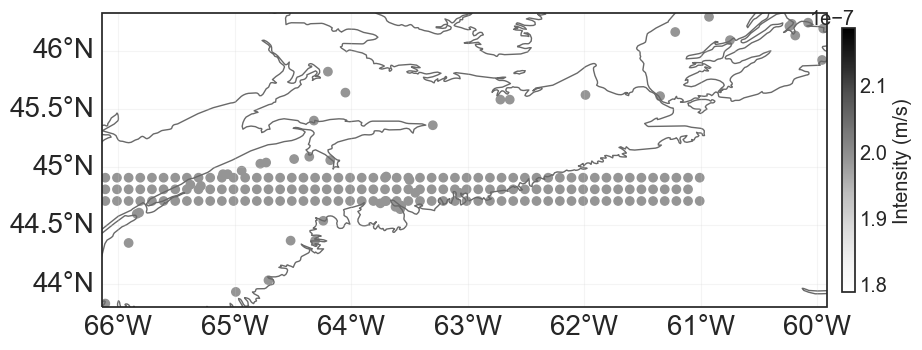

In [694]:
ax_pnt1 = haz_tc.centroids.plot(c=np.array(haz_tc.intensity[0,:].todense()).squeeze()) # plot intensity per point
ax_pnt1.get_figure().colorbar(ax_pnt1.collections[0], fraction=0.0175, pad=0.02).set_label('Intensity (m/s)') # add colorbar

In [696]:
#Impact Map and Return Period Graph
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
IMP_houses_TC2.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC2 = IMP_houses_TC2.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_houses_TC2.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(IMP_houses_TC2.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(IMP_houses_TC2.calc_freq_curve(100).impact))

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

AttributeError: 'list' object has no attribute 'calc_mdr'

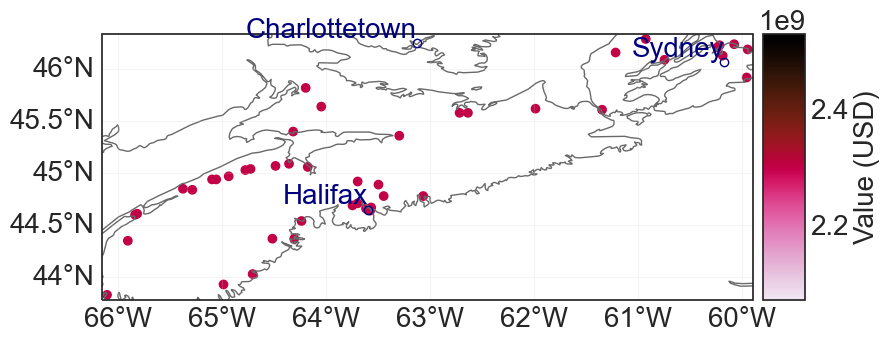

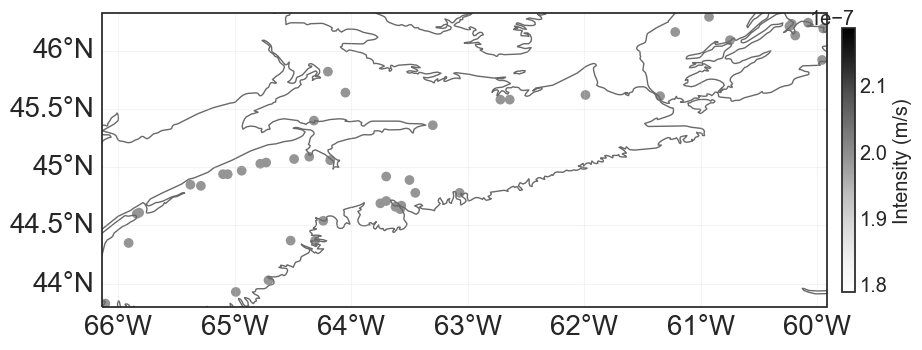

In [762]:
%matplotlib inline
# EXAMPLE: POINT EXPOSURES WITH POINT HAZARD
import numpy as np
from climada.entity import Exposures, ImpactFuncSet, IFTropCyclone
from climada.hazard import Centroids, TCTracks, TropCyclone
from climada.engine import ImpactCalc

# Set Exposures in points
exp_pnt = Exposures(crs='epsg:4326') #set coordinate system
exp_pnt.gdf['latitude'] = np.array([45.62, 46.29, 46.24, 44.67, 45.82, 46.13, 46.19, 45.36, 45.58, 46.23, 45.07, 44.37, 43.83, 46.21, 44.97, 44.64, 45.64, 44.03, 45.58, 45.61, 45.09, 44.37, 45.04, 44.35, 44.94, 46.16, 44.54, 45.4, 45.06, 44.84, 45.92, 46.09, 44.85, 45.03, 44.89, 44.71, 44.6, 44.69, 44.94, 43.93, 44.61, 44.78, 44.78, 44.66, 44.92
])
exp_pnt.gdf['longitude'] = np.array([-61.99, -60.93, -60.08, -63.57, -64.2, -60.19, -59.95, -63.3, -62.64, -60.22, -64.49, -64.52, -66.11, -60.24, -64.94, -63.58, -64.05, -64.71, -62.72, -61.35, -64.36, -64.31, -64.73, -65.91, -65.06, -61.22, -64.24, -64.32, -64.18, -65.29, -59.96, -60.75, -65.38, -64.78, -63.5, -63.7, -65.84, -63.75, -65.1, -64.99, -65.82, -63.07, -63.45, -63.62, -63.7
])
exp_pnt.gdf['value'] = np.array([2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9, 2.3e9
])
exp_pnt.check()
exp_pnt.plot_scatter(buffer=0.05)

# Set Hazard in Exposures points
# set centroids from exposures coordinates
centr_pnt = Centroids.from_lat_lon(exp_pnt.gdf.latitude.values, exp_pnt.gdf.longitude.values, exp_pnt.crs)
# compute Hazard in that centroids
tr_pnt = Hazard.from_excel(file_name) #Hazard.from_hdf5(HAZ_DEMO_H5)  #tr_pnt = Hazard.from_hdf5(HAZ_DEMO_H5) #TCTracks.from_ibtracs_netcdf(storm_id='2007314N10093')
tc_pnt = tr_pnt
#tc_pnt = TropCyclone.from_tracks(tr_pnt, centroids=centr_pnt)
tc_pnt.check()
ax_pnt = tc_pnt.centroids.plot(c=np.array(tc_pnt.intensity[0,:].todense()).squeeze()) # plot intensity per point
ax_pnt.get_figure().colorbar(ax_pnt.collections[0], fraction=0.0175, pad=0.02).set_label('Intensity (m/s)') # add colorbar

# Set impact function
impf_tc = ImpfTropCyclone.from_emanuel_usa()
impf_pnt = ImpactFuncSet([impf_tc])
impf_pnt.check()

# add the impact function to an Impact function set
impf_set = ImpactFuncSet([impf_tc])
impf_set.check()

# Get the hazard type and hazard id
[haz_type] = impf_set.get_hazard_types()
[haz_id] = impf_set.get_ids()[haz_type]
# Exposures: rename column and assign id
exp_house2.gdf.rename(columns={"impf_": "impf_" + haz_type}, inplace=True)
exp_house2.gdf['impf_' + haz_type] = haz_id
exp_house2.gdf.head()

# Compute Impact
imp_pnt = ImpactCalc(exp_pnt, IFs_TC_houses2, tc_pnt).impact()
# nearest neighbor of exposures to centroids gives identity
print('Nearest neighbor hazard.centroids indexes for each exposure:', exp_pnt.gdf.centr_TC.values)
imp_pnt.plot_scatter_eai_exposure(ignore_zero=False, buffer=0.05);

Expected average annual impact (houses TC): 2.906e+08 USD
Damage with 100-year return period: 1.236e+10 USD


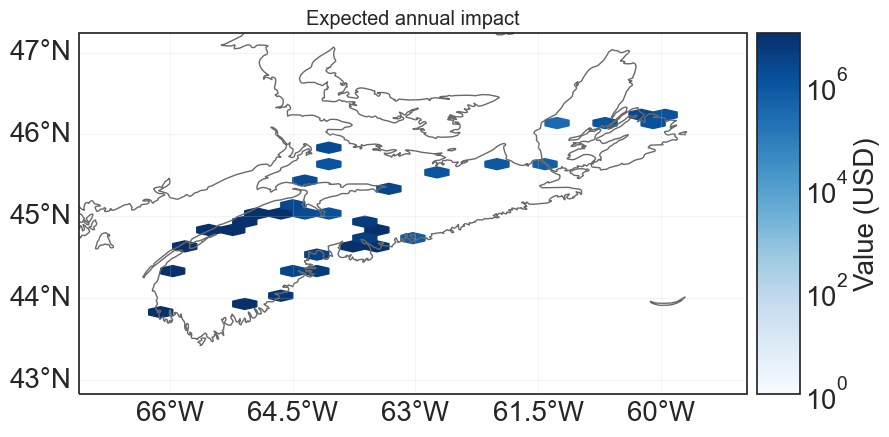

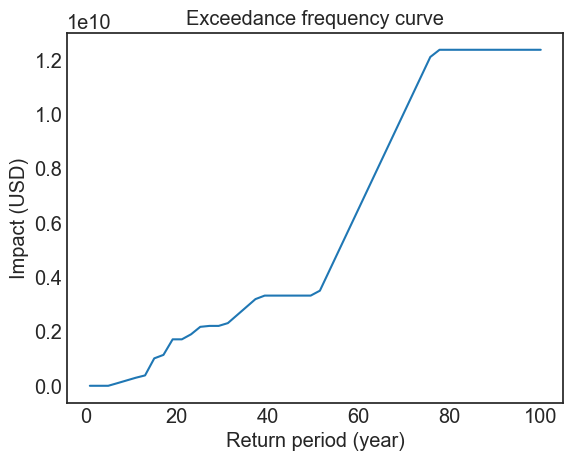

In [743]:
#Impact Map and Return Period Graph
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_pnt.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_houses_TC2 = imp_pnt.calc_freq_curve(np.linspace(1, 100, 50))  # impact exceedence frequency curve
freq_curve_houses_TC2.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_pnt.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_pnt.calc_freq_curve(100).impact))

In [745]:
tc_ns.write_hdf5(results.joinpath('tc_ns.h5'))

In [763]:
# write file
freq_curve_houses_TC.write_excel('results/freq_curve_houses_TC.xlsx')

AttributeError: 'ImpactFreqCurve' object has no attribute 'write_excel'